# Modelling Th1/2 polarization with perturbation effects

In [1]:
import os,sys
import pandas as pd
import numpy as np
import scanpy as sc

from pert2state_model.Perturb2StateModel import Perturb2StateModel

import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

sys.path.append('../3_DE_analysis/')
from DE_analysis_utils import *

Plotting utils

In [2]:
def plot_regulator_effects(adata_de, genes, regulators, y_target, sort_by='perturbation', figsize=(18, 6), condition='Rest', return_data=False):
    """Plot effects of regulators on target genes.
    
    Args:
        top_rows: List of target genes to plot
        gr: List of regulators to analyze
        wide_de_results: DataFrame with DE results
        wide_de_results_signif: DataFrame with significance values
        y_target: Series with aging effects
    """

    # Get DE results and pivot to wide format
    long_de_results = get_DE_results_long(adata_de, targets=regulators, genes=genes, gene_id_col='gene_name')
    long_de_results = long_de_results[long_de_results['culture_condition'] == condition].copy()
    wide_de_results = long_de_results.pivot(index='gene', columns='target_contrast_gene_name', values='zscore').T
    wide_de_results_signif = long_de_results.pivot(index='gene', columns='target_contrast_gene_name', values='adj_p_value').T

    pl_df = wide_de_results.loc[regulators, genes].reset_index().melt(id_vars='target_contrast_gene_name')
    signif = wide_de_results_signif.loc[regulators, genes] < 0.1
    # Calculate mean values per gene
    gene_means = pl_df.groupby('gene')['value'].mean()
    # Sort either by aging effect (y_target) or mean perturbation effect
    if sort_by == 'aging':
        gene_order = y_target.loc[genes].sort_values().index
    elif sort_by == 'perturbation':
        gene_order = wide_de_results.loc[regulators, genes].mean().sort_values().index
    else:
        gene_order = genes # Keep original order
    pl_df['aging_effect'] = y_target.loc[pl_df['gene']].values
    pl_df['target_contrast_gene_name'] = pl_df['target_contrast_gene_name'].astype(str)
    pl_df['significant'] = False
    for gene in regulators:
        for target in genes:
            pl_df.loc[(pl_df['target_contrast_gene_name'] == gene) & (pl_df['gene'] == target), 'significant'] = signif.loc[gene, target]

    plt.figure(figsize=figsize)
    plt.axvline(x=0, color='grey', linestyle=':', zorder=0)

    palette = {name: sns.color_palette('Pastel1')[i] 
              for i, name in enumerate(pl_df['target_contrast_gene_name'].unique())}

    # Create base stripplot with legend using ordered regulators
    ax = sns.stripplot(data=pl_df[~pl_df.significant], y='gene', x='value', 
                      hue='target_contrast_gene_name', dodge=False, palette=palette, legend=False,
                      order=gene_order, size=8, alpha=0.5)

    # Add points with black outline for significant values, no legend
    ax = sns.stripplot(data=pl_df[pl_df.significant], y='gene', x='value', 
                      hue='target_contrast_gene_name', dodge=False, 
                      edgecolor='black', linewidth=1, palette=palette, legend=True,
                      order=gene_order, size=8, alpha=0.7)

    # Add scatter points for aging effect
    sns.scatterplot(data=pl_df, y='gene', x='aging_effect', 
                    s=200, color='black', marker='*', label='Aging signature effect')

    # Adjust y-axis labels
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)

    # Add axis labels
    plt.ylabel('Signature genes', fontsize=14)
    plt.xlabel('Perturb-seq effect size\n(DE z-score)', fontsize=14)

    # Add white point with black outline to legend to indicate significance
    plt.scatter([], [], c='white', edgecolor='black', linewidth=1, s=80, label='Significant effect (10% FDR)')

    # Move legend outside with larger font
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Target gene', fontsize=12, title_fontsize=14, frameon=False)
    
    if return_data:
        return(wide_de_results, wide_de_results_signif)

In [166]:
import yaml
with open('../../metadata/th1_th2_known_regulators.yaml', 'r') as f:
    known_regulators = yaml.safe_load(f)
known_regulators

{'th2': ['GATA3', 'IL4R', 'STAT6', 'SETDB1', 'MTA2', 'CHD4', 'MBD2'],
 'th1': ['STAT1',
  'IFNGR2',
  'IFNGR1',
  'IKFZ1',
  'IL4',
  'TBX21',
  'STAT4',
  'RASGRP1',
  'IRF1',
  'IRF9',
  'STAT2']}

## Load perturb-seq signatures

In [3]:
datadir = '/mnt/oak/users/emma/data/GWT/CD4i_final/'
experiment_name = 'CD4i_final'
adata_de = sc.read_h5ad(datadir + f'/DE_results_all_confounders/{experiment_name}.merged_DE_results.h5ad')

adata_de.layers['zscore'] = adata_de.layers['log_fc'] / adata_de.layers['lfcSE']
adata_de.layers['zscore'][np.where(adata_de.layers['zscore'] > 100)] = 100
for cond in adata_de.obs.culture_condition.unique():
    affected_gs_cond = np.sum(adata_de[adata_de.obs['culture_condition'] == cond].layers['adj_p_value'] < 0.1, axis=0)
    adata_de.var[f'n_signif_effects_{cond}'] = affected_gs_cond

adata_de.var_names = adata_de.var['gene_name'].values
adata_de.var_names

# Filter very lowly expressed genes
base_mean_df = sc.get.obs_df(adata_de, adata_de.var_names.tolist() + ['culture_condition', 'chunk'], layer='baseMean')
base_mean_df = base_mean_df.drop_duplicates().sort_values('culture_condition')

# Calculate for Rest condition
base_mean_rest = base_mean_df[base_mean_df['culture_condition'] == 'Rest'].set_index('chunk').drop('culture_condition', axis=1).T
adata_de.var['mean_baseMean_Rest'] = base_mean_rest.mean(1).fillna(0)
adata_de.var['std_baseMean_Rest'] = base_mean_rest.std(1).fillna(10000)

# Calculate for Stim8hr condition
base_mean_stim8 = base_mean_df[base_mean_df['culture_condition'] == 'Stim8hr'].set_index('chunk').drop('culture_condition', axis=1).T
adata_de.var['mean_baseMean_Stim8hr'] = base_mean_stim8.mean(1).fillna(0)
adata_de.var['std_baseMean_Stim8hr'] = base_mean_stim8.std(1).fillna(10000)

# Calculate for Stim48hr condition
base_mean_stim48 = base_mean_df[base_mean_df['culture_condition'] == 'Stim48hr'].set_index('chunk').drop('culture_condition', axis=1).T
adata_de.var['mean_baseMean_Stim48hr'] = base_mean_stim48.mean(1).fillna(0)
adata_de.var['std_baseMean_Stim48hr'] = base_mean_stim48.std(1).fillna(10000)

# Exclude from analysis genes with very low base mean (messing up reliability estimate)
gs_mask = (adata_de.var['mean_baseMean_Rest'] > 0.1) & (adata_de.var['mean_baseMean_Stim8hr'] > 0.1) & (adata_de.var['mean_baseMean_Stim48hr'] > 0.1)
adata_de = adata_de[:, gs_mask].copy()
sum(~gs_mask)

3677

In [4]:
# Load summary stats
DE_stats = pd.read_csv(datadir + f'/DE_results_all_confounders/DE_summary_stats_per_target.csv', index_col=0)


K562 data as negative control

In [5]:
k562_adata_de = sc.read_h5ad('/mnt/oak/users/emma/data/GWT/K562_DE_analysis/K562.merged_DE_results.h5ad')

k562_adata_de.layers['zscore'] = k562_adata_de.layers['log_fc'] / k562_adata_de.layers['lfcSE']
k562_adata_de.layers['zscore'][np.where(k562_adata_de.layers['zscore'] > 50)] = 50
k562_adata_de

AnnData object with n_obs × n_vars = 3081 × 6294
    obs: 'culture_condition', 'target_contrast', 'chunk', 'target_contrast_gene_name', 'n_cells_target'
    layers: 'adj_p_value', 'baseMean', 'lfcSE', 'log_fc', 'p_value', 'zscore'

## Train signature prediction models

- Train on discovery signature (Ota2021)
- Validate with reconstruction on held-out genes in replication dataset (Hollbacher2021)
- Check recovery of known regulators

In [9]:
def mask_cis_effects(X_perturbs):
    """Mask diagonal elements (cis effects) in perturbation matrix and impute with column means."""
    X_perturbs_masked = X_perturbs.copy()
    mask = pd.DataFrame(False, index=X_perturbs_masked.index, columns=X_perturbs_masked.columns)
    for idx in X_perturbs_masked.index:
        if idx in X_perturbs_masked.columns:
            mask.loc[idx, idx] = True
    X_perturbs_masked = X_perturbs_masked.mask(mask)
    # Impute masked values with column means
    X_perturbs_masked = X_perturbs_masked.fillna(X_perturbs_masked.mean())
    return X_perturbs_masked

def mask_low_zscore(X_perturbs, zscore_threshold=2.0):
    """Mask values below zscore threshold in perturbation matrix and impute with column means."""
    X_perturbs_masked = X_perturbs.copy()
    mask = pd.DataFrame(False, index=X_perturbs_masked.index, columns=X_perturbs_masked.columns)
    mask[abs(X_perturbs_masked) < zscore_threshold] = True
    X_perturbs_masked = X_perturbs_masked.mask(mask)
    # Impute masked values with column means
    X_perturbs_masked = X_perturbs_masked.fillna(X_perturbs_masked.mean())
    return X_perturbs_masked

def _train_model(input_adata_de, signature, perturb_layer, n_pcs, n_splits, n_repeats, model_id = 'model', scramble=False, mask_low=False, scale_y = False):
    """Train perturbation-to-state model from perturbseq DE results."""
    # Get target state values
    y_target = signature[perturb_layer].copy()
    if scale_y:
        y_target = (y_target - y_target.mean()) / y_target.std()

    # Get perturbseq responses 
    X_perturbs = sc.get.obs_df(input_adata_de, 
                                ['target_contrast_gene_name', 'culture_condition'] + list(input_adata_de.var_names), 
                                layer='zscore')
    X_perturbs = X_perturbs.set_index(X_perturbs['target_contrast_gene_name'].astype(str) + '_' + X_perturbs['culture_condition'].astype(str)).drop(['target_contrast_gene_name', 'culture_condition'], axis=1).T
    print(f"Perturbation matrix shape: {X_perturbs.shape}")
    # Assert that y_target and X_perturbs have matching indices
    assert all(y_target.index == X_perturbs.index), "Target state and perturbation matrix indices do not match"
    
    # Mask effect on target gene
    X_perturbs_masked = mask_cis_effects(X_perturbs)

    if mask_low:
        X_perturbs_masked = mask_low_zscore(X_perturbs_masked, zscore_threshold=3)

    if scramble:  
        print(f"Scrambling input")
        X_perturbs_masked = X_perturbs_masked.apply(lambda row: np.random.permutation(row.values), axis=1, result_type='broadcast')
        
    # Train model on CD4 cells
    print(f"Training model with {n_pcs} PCs, {n_splits} splits, {n_repeats} repeats")
    p2t_model = Perturb2StateModel(pca_transform=True, n_pcs=n_pcs, n_splits=n_splits, n_repeats=n_repeats, positive=False)
    p2t_model.fit(X_perturbs_masked, y_target, model_id=f'{model_id}')
    return(p2t_model, X_perturbs_masked, y_target)

In [10]:
# In vivo signature - discovery
ota_signature = pd.read_csv('results/Ota_Th2vsTh1_DE_results.csv', index_col='variable').dropna()
ota_signature.loc[ota_signature['zscore'] > 30, 'zscore'] = 30
ota_signature.loc[ota_signature['zscore'] < -30, 'zscore'] = -30

# In vivo signature - replication
hollbacker_signature = pd.read_csv('results/hollbacher_Th2vsTh1_DE_results.csv', index_col='variable').dropna()
hollbacker_signature.loc[hollbacker_signature['zscore'] > 30, 'zscore'] = 30
hollbacker_signature.loc[hollbacker_signature['zscore'] < -30, 'zscore'] = -30

# In vitro differentiation signature
diff34_signature = pd.read_csv('results/Diff043_Th2vsTh1_DE_results.csv', index_col='variable').dropna()
diff34_signature = diff34_signature[diff34_signature.contrast == 'Th2_vs_Th1_Rest'].copy()
diff34_signature.loc[diff34_signature['zscore'] > 30, 'zscore'] = 30
diff34_signature.loc[diff34_signature['zscore'] < -30, 'zscore'] = -30

# General activation signature as neg control
activation_signature = pd.read_csv('Arce2024_20230130_DESeq2_output_AAVS1_Teff_Stimulation_vs_Resting.csv').dropna()
activation_signature = activation_signature.rename(columns={'log2FoldChange':'log_fc', 'padj':'adj_p_value', 'gene_name':'variable'})
activation_signature['zscore'] = activation_signature['log_fc']/activation_signature['lfcSE']
activation_signature = activation_signature.set_index('variable').sort_values('zscore').groupby(level=0).last()

#### Small parameter sweep

Pick conditions and model parameters

In [11]:
comparisons = [
    'ota_Rest',
    'ota_Stim8hr',
    'ota_Stim48hr'
]

comparison_data = {}

for comp in comparisons:
    signature = ota_signature.copy()
    
    # Define genes to test
    y_genes = signature.index.tolist()
    x_genes = adata_de.var_names.tolist()
    common_gs = np.intersect1d(y_genes, x_genes)

    # Define regulators to test
    c = comp.split('_')[1]
    keep_targets = DE_stats[(DE_stats.n_total_de_genes >= 10)].target_name.unique().tolist()
    if c != 'all':
        a = adata_de[(adata_de.obs['culture_condition'] == c) & (adata_de.obs['target_contrast_gene_name'].isin(keep_targets))][:, common_gs].copy()
    if c == 'all':
        a = adata_de[(adata_de.obs['target_contrast_gene_name'].isin(keep_targets))][:, common_gs].copy()

    comp_data = (signature.loc[common_gs], a)
    comparison_data[comp] = comp_data

In [12]:
%%time
comparison_results = {}
for comp_key in comparison_data.keys():
    signature, input_adata_de = comparison_data[comp_key]
    for n_pcs in [30,40,50,60]:
        p2t_model, X_perturbs, y_target = _train_model(
            input_adata_de = input_adata_de,
            signature = signature,
            perturb_layer = 'zscore',
            n_pcs = n_pcs,
            n_splits = 5,
            n_repeats = 1,
            scale_y=True
        )
        comparison_results[comp_key + f"_{n_pcs}PCs"] = p2t_model, X_perturbs, y_target
        
        # Scramble values to exclude reconstruction is driven by mean zscore for each gene
        p2t_model, X_perturbs, y_target = _train_model(
            input_adata_de = input_adata_de,
            signature = signature,
            perturb_layer = 'zscore',
            n_pcs = n_pcs,
            n_splits = 5,
            n_repeats = 1,
            scale_y=True,
            scramble=True
        )
        comparison_results[comp_key + f"_{n_pcs}PCs_scrambled"] = p2t_model, X_perturbs, y_target


Perturbation matrix shape: (9481, 3838)
Training model with 30 PCs, 5 splits, 1 repeats
Perturbation matrix shape: (9481, 3838)
Scrambling input
Training model with 30 PCs, 5 splits, 1 repeats
Perturbation matrix shape: (9481, 3838)
Training model with 40 PCs, 5 splits, 1 repeats
Perturbation matrix shape: (9481, 3838)
Scrambling input
Training model with 40 PCs, 5 splits, 1 repeats
Perturbation matrix shape: (9481, 3838)
Training model with 50 PCs, 5 splits, 1 repeats
Perturbation matrix shape: (9481, 3838)
Scrambling input
Training model with 50 PCs, 5 splits, 1 repeats
Perturbation matrix shape: (9481, 3838)
Training model with 60 PCs, 5 splits, 1 repeats
Perturbation matrix shape: (9481, 3838)
Scrambling input
Training model with 60 PCs, 5 splits, 1 repeats
Perturbation matrix shape: (9481, 3927)
Training model with 30 PCs, 5 splits, 1 repeats
Perturbation matrix shape: (9481, 3927)
Scrambling input
Training model with 30 PCs, 5 splits, 1 repeats
Perturbation matrix shape: (9481, 3

In [15]:
%%time
for comp_key in comparison_data.keys():
    signature, input_adata_de = comparison_data[comp_key]
    for n_pcs in [70,80,90,100]:
        p2t_model, X_perturbs, y_target = _train_model(
            input_adata_de = input_adata_de,
            signature = signature,
            perturb_layer = 'zscore',
            n_pcs = n_pcs,
            n_splits = 5,
            n_repeats = 1,
            scale_y=True
        )
        comparison_results[comp_key + f"_{n_pcs}PCs"] = p2t_model, X_perturbs, y_target
        
        # Scramble values to exclude reconstruction is driven by mean zscore for each gene
        p2t_model, X_perturbs, y_target = _train_model(
            input_adata_de = input_adata_de,
            signature = signature,
            perturb_layer = 'zscore',
            n_pcs = n_pcs,
            n_splits = 5,
            n_repeats = 1,
            scale_y=True,
            scramble=True
        )
        comparison_results[comp_key + f"_{n_pcs}PCs_scrambled"] = p2t_model, X_perturbs, y_target


Perturbation matrix shape: (9481, 3838)
Training model with 70 PCs, 5 splits, 1 repeats
Perturbation matrix shape: (9481, 3838)
Scrambling input
Training model with 70 PCs, 5 splits, 1 repeats
Perturbation matrix shape: (9481, 3838)
Training model with 80 PCs, 5 splits, 1 repeats
Perturbation matrix shape: (9481, 3838)
Scrambling input
Training model with 80 PCs, 5 splits, 1 repeats
Perturbation matrix shape: (9481, 3838)
Training model with 90 PCs, 5 splits, 1 repeats
Perturbation matrix shape: (9481, 3838)
Scrambling input
Training model with 90 PCs, 5 splits, 1 repeats
Perturbation matrix shape: (9481, 3838)
Training model with 100 PCs, 5 splits, 1 repeats
Perturbation matrix shape: (9481, 3838)
Scrambling input
Training model with 100 PCs, 5 splits, 1 repeats
Perturbation matrix shape: (9481, 3927)
Training model with 70 PCs, 5 splits, 1 repeats
Perturbation matrix shape: (9481, 3927)
Scrambling input
Training model with 70 PCs, 5 splits, 1 repeats
Perturbation matrix shape: (9481,

In [ ]:
all_evals = pd.DataFrame()
for dataset_key in comparison_results.keys():
    p2t_model, X_perturbs, y_target = comparison_results[dataset_key]
    eval = p2t_model.summarize_eval()
    eval['dataset_key'] = dataset_key
    all_evals = pd.concat([all_evals, eval])

all_evals['n_pcs'] = all_evals.dataset_key.str.split("_").str[2].str.replace("PCs", "").astype(int)
all_evals['celltype'] = all_evals.dataset_key.str.split("_").str[1]
all_evals['signature'] = all_evals.dataset_key.str.split("_").str[0]
all_evals.to_csv('./results/polarization_model_Ota_sweep_eval.csv')

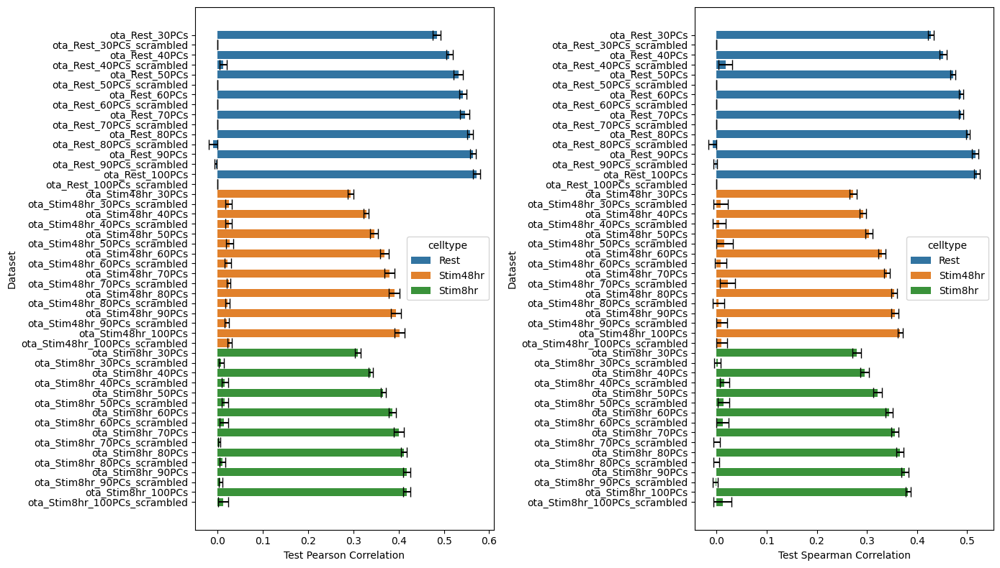

In [ ]:
# Sort data by condition and n_pcs
sorted_evals = all_evals.sort_values(['celltype', 'n_pcs', 'dataset_key'])

# Create figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 8))

# Plot test_pearson
sns.barplot(data=sorted_evals, y='dataset_key', x='test_pearson', hue='celltype', ax=ax1)
ax1.errorbar(x=sorted_evals['test_pearson'], y=range(len(sorted_evals)),
            xerr=sorted_evals['test_pearson_se'],
            fmt='none', capsize=5, color='black')
ax1.set_xlabel('Test Pearson Correlation')
ax1.set_ylabel('Dataset')

# Plot test_spearman 
sns.barplot(data=sorted_evals, y='dataset_key', x='test_spearman', hue='celltype', ax=ax2)
ax2.errorbar(x=sorted_evals['test_spearman'], y=range(len(sorted_evals)),
            xerr=sorted_evals['test_spearman_se'], 
            fmt='none', capsize=5, color='black')
ax2.set_xlabel('Test Spearman Correlation')
ax2.set_ylabel('Dataset')

plt.tight_layout()

Quick check of all results

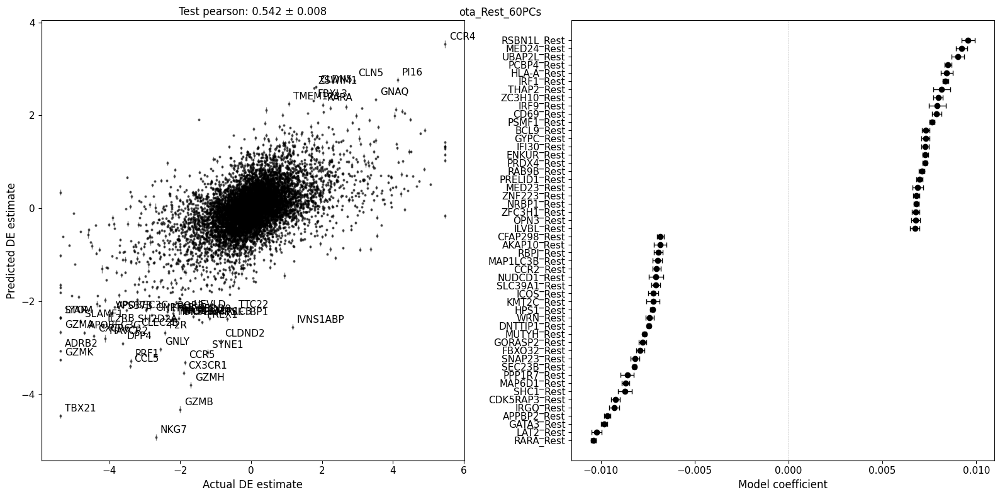

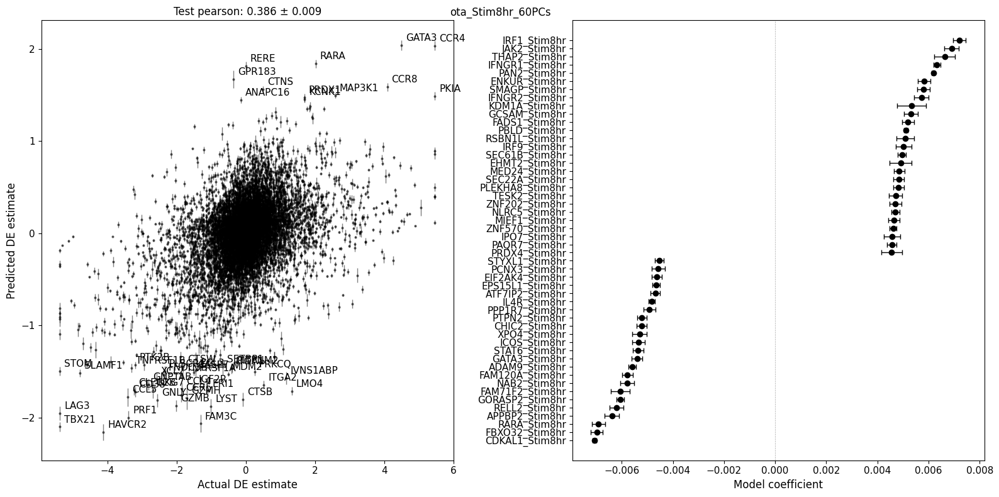

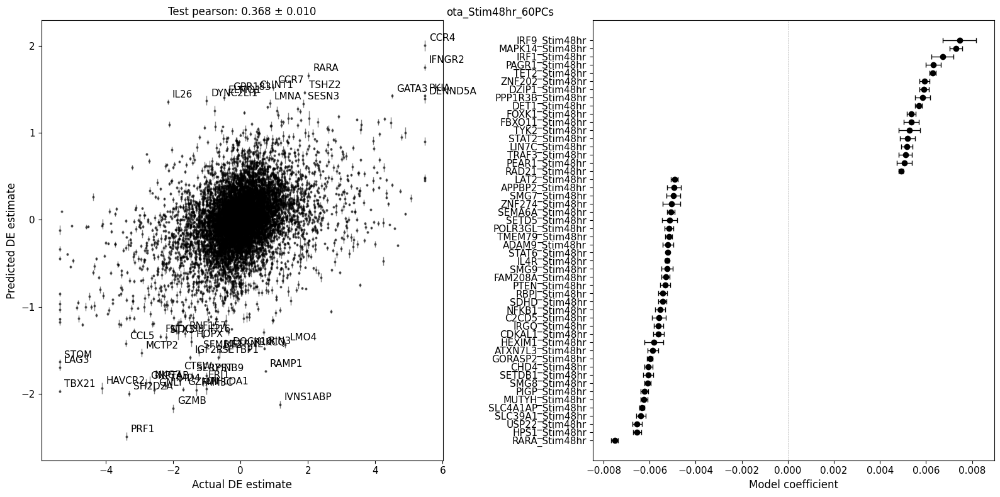

In [31]:
for dataset_key in comparison_results.keys():
    if 'scrambled' not in dataset_key and '60PCs' in dataset_key:
        p2t_model, X_perturbs, y_target = comparison_results[dataset_key]
        fig, axes = plt.subplots(1, 2, figsize=(16, 8))
        p2t_model.plot_prediction(X_perturbs, y_target, plot_metric='pearson', ax=axes[0], annotate_top_n=50)
        # p2t_model.plot_prediction(X_perturbs[y_target.abs() > 2], y_target[y_target.abs() > 2], plot_metric='pearson', ax=axes[0], annotate_top_n=50)
        p2t_model.plot_coefs(top_n=50, ax=axes[1])
        fig.tight_layout()
        fig.suptitle(dataset_key)
        fig.show()

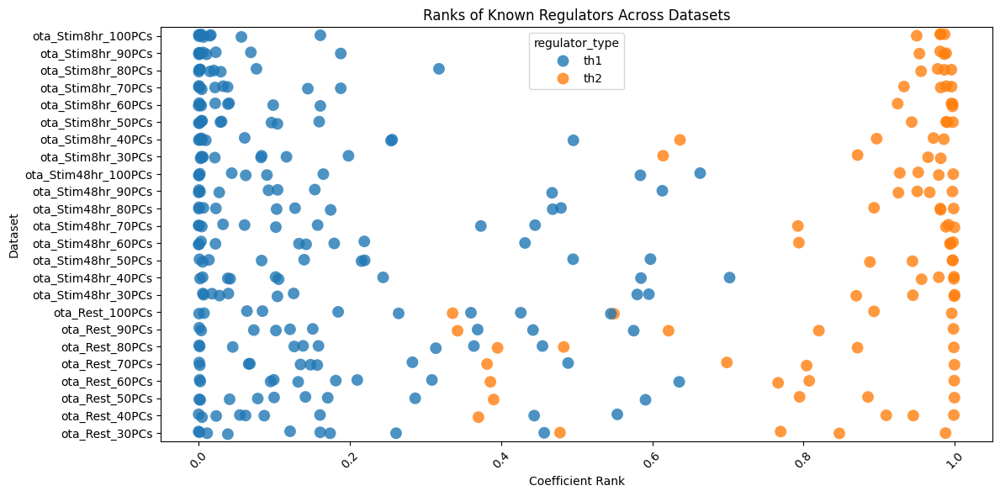

In [ ]:

# Create mapping of regulator to cell type
regulator_type = {}
for cell_type, regulators in known_regulators.items():
    for reg in regulators:
        regulator_type[reg] = cell_type
# Combine coefficients from all datasets and normalize per dataset
all_coefs = []
for dataset_key in comparison_results.keys():
    if 'scrambled' not in dataset_key:
        p2t_model, X_perturbs, y_target = comparison_results[dataset_key]
        mod_coefs = p2t_model.get_coefs()
        
        # Get ranks of coefficients and normalize to 0-1
        coef_mean = mod_coefs['coef_mean']
        coef_ranks = coef_mean.rank(ascending=False)
        n_coefs = len(coef_ranks)
        normalized_ranks = (coef_ranks - 1) / (n_coefs - 1)  # Normalize to 0-1 range
        mod_coefs['coef_rank'] = normalized_ranks
        
        mod_coefs['regulator'] = mod_coefs.index.str.split('_').str[0]
        mod_coefs['known_regulators'] = mod_coefs['regulator'].isin(regulator_type.keys())
        mod_coefs['dataset_key'] = dataset_key
        
        # Add regulator type column
        mod_coefs['regulator_type'] = mod_coefs['regulator'].map(regulator_type)
        
        all_coefs.append(mod_coefs)

all_coefs_df = pd.concat(all_coefs)
all_coefs_df['n_pcs'] = all_coefs_df.dataset_key.str.split("_").str[2].str.replace("PCs", "").astype(int)
all_coefs_df['celltype'] = all_coefs_df.dataset_key.str.split("_").str[1]
all_coefs_df['signature'] = all_coefs_df.dataset_key.str.split("_").str[0]
sorted_coefs = all_coefs_df.sort_values(['celltype', 'n_pcs', 'dataset_key'])

# Create single figure 
fig, ax = plt.subplots(figsize=(12, 6))

# Create strip plot of ranks for known regulators
sns.stripplot(data=sorted_coefs[sorted_coefs['known_regulators']], 
             y='dataset_key', x='coef_rank', ax=ax, hue='regulator_type', alpha=0.8, s=10)

ax.set_ylabel('Dataset')
ax.set_xlabel('Coefficient Rank')
ax.set_title('Ranks of Known Regulators Across Datasets')
plt.xticks(rotation=45)

# Invert y-axis so higher ranks are on top
ax.invert_yaxis()

plt.tight_layout()


/tmp/ipykernel_366490/4022892041.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
/tmp/ipykernel_366490/4022892041.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
/tmp/ipykernel_366490/4022892041.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)


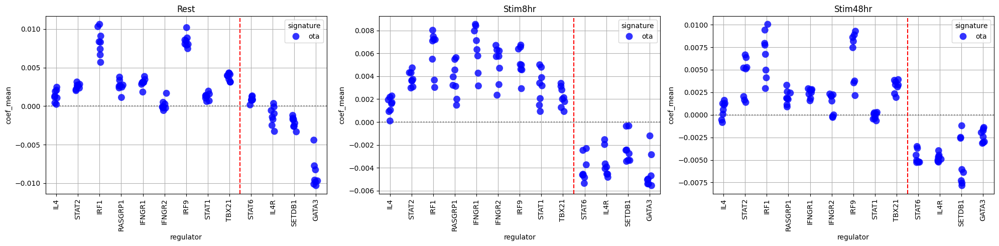

In [38]:
pl_df = all_coefs_df[all_coefs_df['known_regulators']].reset_index()
sorted_regulators = []
for cell_type in ['th1', 'th2']:
    sorted_regulators.extend([reg for reg in pl_df['regulator'].unique() if all_coefs_df[all_coefs_df['regulator']==reg]['regulator_type'].iloc[0] == cell_type])
pl_df['regulator'] = pd.Categorical(pl_df['regulator'], categories=sorted_regulators)
pl_df['signature'] = pl_df['dataset_key'].str.split('_').str[0]
pl_df['ct'] = pl_df['dataset_key'].str.split('_').str[1]

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

signature_palette = {
    'activation':'grey',
    'ota':'blue',
    'diff34':'green',
}

for i, condition in enumerate(['Rest', 'Stim8hr', 'Stim48hr']):
    sns.stripplot(data=pl_df[pl_df['ct'] == condition], hue='signature', palette=signature_palette,
                 x='regulator', y='coef_mean', alpha=0.8, ax=axes[i], s=10)
    axes[i].grid(True)
    axes[i].axhline(y=0, color='black', linestyle=':', alpha=0.5)
    
    # Add vertical line between th1 and th2 regulators
    th1_regs = [reg for reg in sorted_regulators if all_coefs_df[all_coefs_df['regulator']==reg]['regulator_type'].iloc[0] == 'th1']
    axes[i].axvline(x=len(th1_regs)-0.5, color='red', linestyle='--', alpha=1)
    
    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
    axes[i].set_title(condition)

plt.tight_layout()


In [ ]:
#### Plot DE effects of predicted regulators

# num_of_sig_genes = 60
# signature_gs_ota = ota_signature.reset_index().sort_values(by='adj_p_value').variable[:num_of_sig_genes].tolist()
# all_coef = all_coefs_df[all_coefs_df.dataset_key == 'ota_Stim8hr'].set_index('regulator')
# top_quant = 0.01

# coef_label = 'coef_mean'
# n = len(all_coef)
# top_percent = all_coef[coef_label].nlargest(int(n * top_quant))
# bottom_percent = all_coef[coef_label].nsmallest(int(n * top_quant))
# predicted_effect_size = pd.concat([top_percent, bottom_percent]).sort_values(ascending=False)
# predicted_regulator_ota = predicted_effect_size.index.tolist()
# len(predicted_regulator_ota)
# long_de_results = get_DE_results_long(adata_de, targets=predicted_regulator_ota, genes=signature_gs_ota, gene_id_col='gene_name')
# long_de_results = long_de_results[long_de_results['culture_condition'] == 'Stim8hr'].copy()
# wide_de_results = long_de_results.pivot(index='gene', columns='target_contrast_gene_name', values='zscore')
# # Create a mask for diagonal values and low zscore values
# mask = pd.DataFrame(False, index=wide_de_results.index, columns=wide_de_results.columns)
# for idx in wide_de_results.index:
#     if idx in wide_de_results.columns:
#         mask.loc[idx, idx] = True
# # Add mask for abs zscore < 1
# mask = mask | (wide_de_results.abs() < 0)
# wide_de_results = wide_de_results.mask(mask, 0)
# wide_de_results = wide_de_results.T
# wide_de_results = wide_de_results.fillna(0)
# predicted_regulator = wide_de_results.index
# wide_de_results.index
# # Create row annotation dataframe with predicted effect sizes (now rows after transpose)
# row_annot = pd.DataFrame({
#     'regression coef': all_coef.loc[predicted_regulator]['coef_mean']
# })

# # Create column annotation dataframe with signature zscores (now columns after transpose)
# col_annot = pd.DataFrame({
#     'zscore': ota_signature.loc[wide_de_results.columns, 'zscore'],
#     # 'activation_gene': wide_de_results.columns.isin(activation_genes)
# })

# # Create different color maps for annotations
# cmap_row = plt.cm.PiYG_r    # Pink-Yellow-Green for row annotation (predicted effect size)
# cmap_col = plt.cm.RdYlBu_r  # Red-Yellow-Blue for column annotation (signature zscore)
# cmap_activation = plt.cm.binary  # Binary colormap for activation genes

# # Center the colormaps at 0 by using symmetric vmin/vmax
# vmax_row = max(abs(row_annot['regression coef'].min()), abs(row_annot['regression coef'].max()))
# vmax_col = max(abs(col_annot['zscore'].min()), abs(col_annot['zscore'].max()))
# # Create color series for annotations (seaborn expects Series, not DataFrame with RGBA)
# row_colors = row_annot['regression coef'].apply(lambda x: cmap_row((x + vmax_row) / (2 * vmax_row)))
# col_colors = col_annot['zscore'].apply(lambda x: cmap_col((x + vmax_col) / (2 * vmax_col)))
# # activation_colors = col_annot['activation_gene'].apply(lambda x: cmap_activation(1.0 if x else 0.0))

# # Create the clustermap
# #plt.figure(figsize=(20, 15))
# g = sns.clustermap(wide_de_results,
#                    cmap='RdBu_r',
#                    center=0,
#                    row_cluster=True,
#                    col_cluster=True,
#                    xticklabels=True,
#                    yticklabels=True,
#                    method='ward',
#                    figsize=(20, 20),
#                    row_colors=row_colors,
#                    col_colors=[col_colors],
#                    vmin=-5,
#                    vmax=5,
#                    cbar_pos=None)

# # Rotate x-axis labels
# plt.setp(g.ax_heatmap.get_xticklabels(), rotation=90, ha='center', fontsize=16)
# plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0, fontsize=16)

# plt.show()

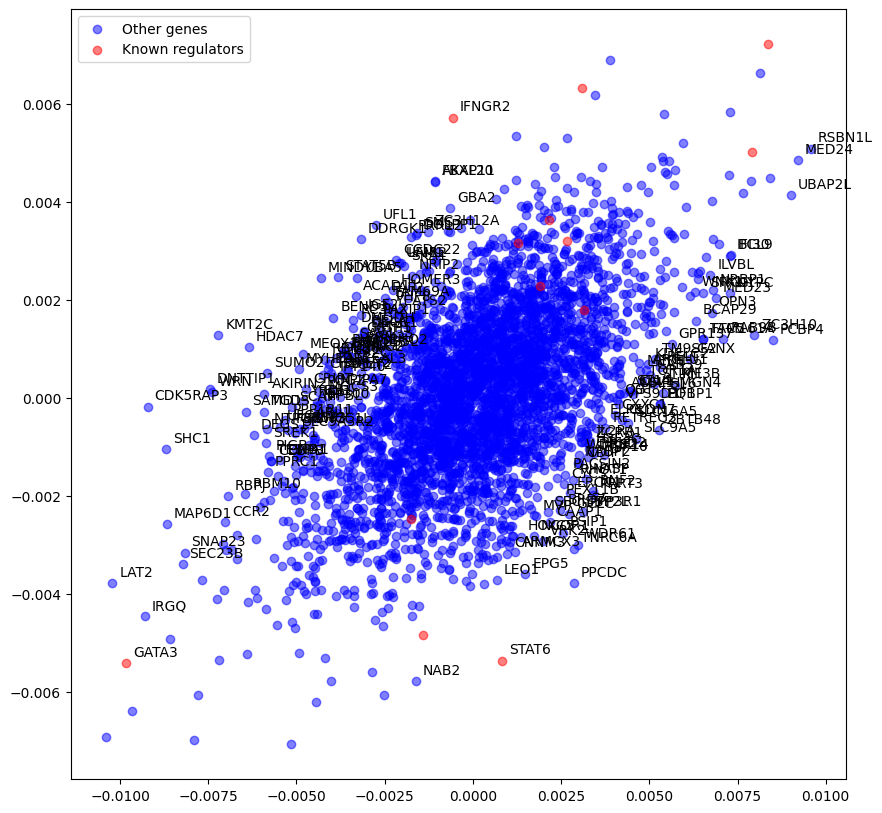

In [41]:
coefs_wide = all_coefs_df.pivot(index='regulator', columns='dataset_key', values='coef_mean')
coefs_wide = coefs_wide.dropna()

plt.figure(figsize=(10,10))
known_reg_mask = coefs_wide.index.isin(all_coefs_df[all_coefs_df['known_regulators']]['regulator'])
plt.scatter(coefs_wide.loc[~known_reg_mask, 'ota_Rest_60PCs'], 
           coefs_wide.loc[~known_reg_mask, 'ota_Stim8hr_60PCs'],
           c='blue', alpha=0.5, label='Other genes', zorder=1)

# Plot known regulators on top
plt.scatter(coefs_wide.loc[known_reg_mask, 'ota_Rest_60PCs'],
           coefs_wide.loc[known_reg_mask, 'ota_Stim8hr_60PCs'], 
           c='red', alpha=0.5, label='Known regulators', zorder=2)

# Calculate difference between Rest and Stim8hr coefficients
diff = abs(coefs_wide['ota_Rest_60PCs'] - coefs_wide['ota_Stim8hr_60PCs'])

# Find points with large differences (off diagonal)
threshold = diff.mean() + 2*diff.std()
off_diagonal = diff > threshold

# Annotate off-diagonal points
for idx in coefs_wide[off_diagonal].index:
    plt.annotate(idx, 
                (coefs_wide.loc[idx, 'ota_Rest_60PCs'], 
                 coefs_wide.loc[idx, 'ota_Stim8hr_60PCs']),
                xytext=(5, 5), textcoords='offset points')

plt.legend()

#### Comparison with K562 as negative control

Picking only common perturbations across K562 and CD4 Stim8hr

In [94]:
comparisons = [
    # 'ota_Rest',
    'ota_Stim8hr',
    # 'ota_Stim48hr',
    'ota_K562'
]

# Define regulators to test
comparison_data = {}

signature = ota_signature.copy()
signature_replication = hollbacker_signature.copy()

# Define genes to test
y_genes = signature.index.tolist()
y_repl_genes = signature_replication.index.tolist()
x_genes = adata_de.var_names.tolist()
x_ctrl_genes = k562_adata_de.var_names.tolist()
common_gs = np.intersect1d(np.intersect1d(np.intersect1d(y_genes, y_repl_genes), x_genes), x_ctrl_genes)
print(f"Number of common genes across datasets: {len(common_gs)}")

# Define regulators to test (intersection of CD4T and K562 targets that meet criteria)
keep_targets_CD4T = DE_stats[(DE_stats.n_total_de_genes > 2) & (DE_stats.condition == 'Stim8hr')].target_name.unique().tolist()
k562_DE_stats = get_de_stats(k562_adata_de, effect_col='log_fc', signif_col='adj_p_value')
keep_targets_K562 = k562_DE_stats.target_name.unique()
keep_targets = np.intersect1d(keep_targets_CD4T, keep_targets_K562)
print(f"Number of common perturbations across datasets: {len(keep_targets)}")

for comp in comparisons:
    c = comp.split('_')[1]
    if c != 'K562':    
        a = adata_de[(adata_de.obs['culture_condition'] == c) & (adata_de.obs['target_contrast_gene_name'].isin(keep_targets))][:, common_gs].copy()
    else:
        # K562 as control
        a = k562_adata_de[k562_adata_de.obs['target_contrast_gene_name'].isin(keep_targets)][:, common_gs].copy()

    comp_data = (signature.loc[common_gs], a)
    comparison_data[comp] = comp_data

Number of common genes across datasets: 5380
Number of common perturbations across datasets: 2190


In [103]:
%%time
comparison_results = {}
for comp_key in comparison_data.keys():
    signature, input_adata_de = comparison_data[comp_key]
    p2t_model, X_perturbs, y_target = _train_model(
        input_adata_de = input_adata_de,
        signature = signature,
        perturb_layer = 'zscore',
        n_pcs = 60,
        n_splits = 3,
        n_repeats = 3
    )
    comparison_results[comp_key] = p2t_model, X_perturbs, y_target


Perturbation matrix shape: (5380, 2190)
Training model with 60 PCs, 3 splits, 3 repeats
Perturbation matrix shape: (5380, 2190)
Training model with 60 PCs, 3 splits, 3 repeats
CPU times: user 11min 24s, sys: 11min 7s, total: 22min 32s
Wall time: 28.5 s


In [104]:
# Scrambled controls
for comp_key in comparison_data.keys():
    signature, input_adata_de = comparison_data[comp_key]
    p2t_model, X_perturbs, y_target = _train_model(
        input_adata_de = input_adata_de,
        signature = signature,
        perturb_layer = 'zscore',
        n_pcs = 60,
        n_splits = 3,
        n_repeats = 3,
        scramble=True
    )
    comparison_results[comp_key + '_scrambled'] = p2t_model, X_perturbs, y_target

Perturbation matrix shape: (5380, 2190)
Scrambling input
Training model with 60 PCs, 3 splits, 3 repeats
Perturbation matrix shape: (5380, 2190)
Scrambling input
Training model with 60 PCs, 3 splits, 3 repeats


Compare test-set reconstruction on replication dataset 

In [105]:
# Get effect of polarization in replication dataset
y_target_replication = signature_replication['zscore'].copy()

all_split_corrs = pd.DataFrame()
for dataset_key in comparison_results.keys():
    p2t_model, X_perturbs, y_target = comparison_results[dataset_key]
    # Get predictions for each train-test split
    splits_pred = p2t_model.get_prediction(X_perturbs, return_splits=True)
    test_indices = [x[1] for x in p2t_model.split_ixs]
    
    # Compare predictions to true values for each test split
    for i, test_idx in enumerate(test_indices):
        # Get predictions for this split from the corresponding column
        test_pred = splits_pred.iloc[test_idx, i]
        test_input = y_target.iloc[test_idx]
        test_true = y_target_replication.loc[test_input.index]
        
        # Calculate correlation for this split
        corr = np.corrcoef(test_pred, test_true)[0,1]
        top_corr = np.corrcoef(test_input, test_true)[0,1]
        
        # Store correlation in dataframe
        split_corr_df = pd.DataFrame({
            'split': i,
            'correlation': corr,
            'upper_correlation': top_corr,
            'dataset_key': dataset_key
        }, index=[0])
        
        all_split_corrs = pd.concat([all_split_corrs, split_corr_df])
            

/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


([0, 1, 2, 3],
 [Text(0, 0, 'ota_Stim8hr'),
  Text(1, 0, 'ota_K562'),
  Text(2, 0, 'ota_Stim8hr_scrambled'),
  Text(3, 0, 'ota_K562_scrambled')])

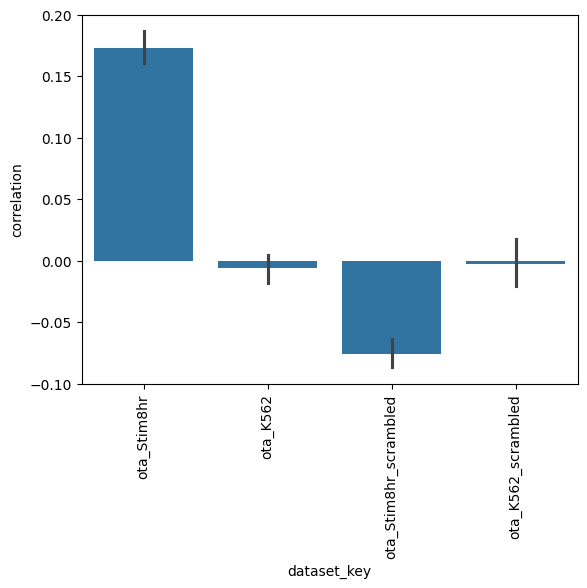

In [106]:
sns.barplot(data=all_split_corrs.reset_index(), x='dataset_key',y='correlation');
plt.xticks(rotation=90)

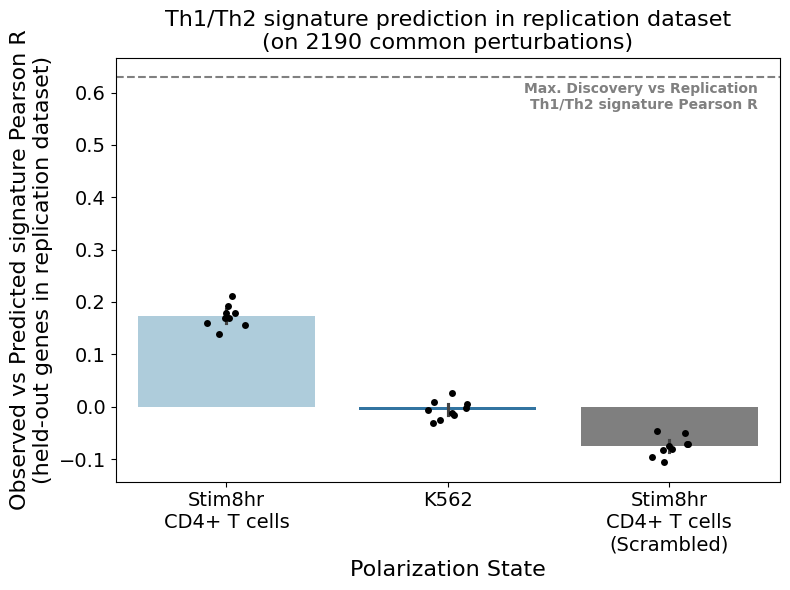

In [157]:
plot_keys = {
    'ota_Stim8hr': 'Stim8hr\nCD4+ T cells', 
    'ota_Stim8hr_scrambled': 'Stim8hr\nCD4+ T cells\n(Scrambled)', 
    'ota_K562': "K562"}

palette = {'Stim8hr\nCD4+ T cells': sns.color_palette("Paired")[0], 
           'K562': sns.color_palette("Paired")[1], 
           'Stim8hr\nCD4+ T cells\n(Scrambled)': 'tab:gray'}

pl_df = all_split_corrs[all_split_corrs['dataset_key'].isin(plot_keys.keys())].copy()
pl_df['dataset_key'] = pl_df['dataset_key'].map(plot_keys)

plt.figure(figsize=(8, 6))
sns.barplot(data=pl_df, x='dataset_key', y='correlation', hue='dataset_key', palette=palette)
sns.stripplot(data=pl_df, x='dataset_key', y='correlation', dodge=False, color='black')

# Increase font sizes
plt.xlabel('Polarization State', fontsize=16)
plt.ylabel('Observed vs Predicted signature Pearson R\n(held-out genes in replication dataset)', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Add horizontal line for mean upper correlation bound
plt.axhline(y=pl_df['upper_correlation'].mean(), color='gray', linestyle='--')
plt.text(plt.xlim()[1]-0.1, pl_df['upper_correlation'].mean()-0.01, 
        'Max. Discovery vs Replication\nTh1/Th2 signature Pearson R', 
        color='gray',
        horizontalalignment='right', verticalalignment='top',
        weight='bold')

plt.title(f'Th1/Th2 signature prediction in replication dataset\n(on {X_perturbs.shape[1]} common perturbations)', fontsize=16)
plt.tight_layout()
plt.savefig('./results/polarization_prediction_k562_comparison.barplot.png');
plt.savefig('./results/polarization_prediction_k562_comparison.barplot.pdf');

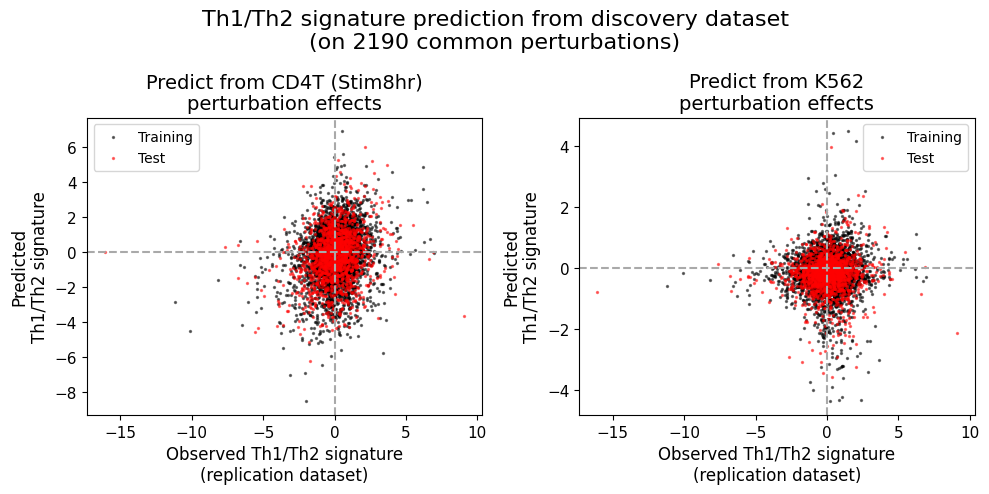

In [133]:
best_split_CD4 = all_split_corrs[all_split_corrs['dataset_key'] == 'ota_Stim8hr'].sort_values('correlation', ascending=False)['split'].iloc[0]
best_split_K562 = all_split_corrs[all_split_corrs['dataset_key'] == 'ota_K562'].sort_values('correlation', ascending=False)['split'].iloc[0]

# Create a figure with subplots for all conditions
fig, axes = plt.subplots(1,2, figsize=(10, 5))

# Process each state

p2t_model, X_perturbs, y_target = comparison_results['ota_Stim8hr']
p2t_model_k562, X_perturbs_ctrl, y_target = comparison_results['ota_K562']
# X_perturbs_ctrl = X_perturbs_ctrl.loc[X_perturbs.index, X_perturbs.columns]

# Get predictions for each train-test split
splits_pred = p2t_model.get_prediction(X_perturbs, return_splits=True)
test_indices = [x[1] for x in p2t_model.split_ixs]

y_target_repl = y_target_replication.copy()
y_target_repl = y_target_repl.loc[y_target.index]

# Plot predictions for the main model in the top subplot
p2t_model.plot_prediction(X_perturbs, y_target_repl, split_id=best_split_CD4, ax=axes[0], return_ax=True)
axes[0].set_ylabel('Predicted\nTh1/Th2 signature', fontsize=12)
axes[0].set_xlabel(f'Observed Th1/Th2 signature\n(replication dataset)', fontsize=12)
axes[0].set_title('Predict from CD4T (Stim8hr)\nperturbation effects', fontsize=14)
axes[0].axhline(y=0, color='darkgrey', linestyle='--')
axes[0].axvline(x=0, color='darkgrey', linestyle='--')

# Plot predictions for the K562 model in the bottom subplot
p2t_model_k562.plot_prediction(X_perturbs_ctrl, y_target_repl, split_id=best_split_K562, ax=axes[1], return_ax=True)
axes[1].set_ylabel('Predicted\nTh1/Th2 signature', fontsize=12)
axes[1].set_xlabel(f'Observed Th1/Th2 signature\n(replication dataset)', fontsize=12)
axes[1].set_title('Predict from K562\nperturbation effects', fontsize=14)
axes[1].axhline(y=0, color='darkgrey', linestyle='--')
axes[1].axvline(x=0, color='darkgrey', linestyle='--')

plt.suptitle(f'Th1/Th2 signature prediction from discovery dataset\n(on {X_perturbs.shape[1]} common perturbations)', fontsize=16)
plt.tight_layout()

plt.savefig('./results/polarization_prediction_k562_comparison.scatter.png');
plt.savefig('./results/polarization_prediction_k562_comparison.scatter.pdf');

#### Comparison on recovery of known regulators

We use activation signature (Rest vs Stim from Arce et al. 2024) as a negative control (reconstruction should be good, but known Th1/Th2 regulators shouldn't be prioritized).

In [158]:
comparisons = [
    'ota_Rest',
    'ota_Stim8hr',
    'ota_Stim48hr',
    'activation_Rest',
    'activation_Stim8hr',
    'activation_Stim48hr',
]

comparison_data = {}

for comp in comparisons:
    if 'ota' in comp:
        signature = ota_signature.copy()
    elif 'activation' in comp:
        signature = activation_signature.copy()

    # Define genes to test
    y_genes = signature.index.tolist()
    x_genes = adata_de.var_names.tolist()
    common_gs = np.intersect1d(y_genes, x_genes)

    # Define regulators to test
    c = comp.split('_')[1]
    keep_targets = DE_stats[(DE_stats.n_total_de_genes >= 10)].target_name.unique().tolist()
    a = adata_de[(adata_de.obs['culture_condition'] == c) & (adata_de.obs['target_contrast_gene_name'].isin(keep_targets))][:, common_gs].copy()
    
    comp_data = (signature.loc[common_gs], a)
    comparison_data[comp] = comp_data

In [159]:
%%time
comparison_results = {}
for comp_key in comparison_data.keys():
    signature, input_adata_de = comparison_data[comp_key]
    p2t_model, X_perturbs, y_target = _train_model(
        input_adata_de = input_adata_de,
        signature = signature,
        perturb_layer = 'zscore',
        n_pcs = 60,
        n_splits = 5,
        n_repeats = 3
    )
    comparison_results[comp_key] = p2t_model, X_perturbs, y_target

Perturbation matrix shape: (9481, 3838)
Training model with 60 PCs, 5 splits, 3 repeats
Perturbation matrix shape: (9481, 3927)
Training model with 60 PCs, 5 splits, 3 repeats
Perturbation matrix shape: (9481, 3821)
Training model with 60 PCs, 5 splits, 3 repeats
Perturbation matrix shape: (9788, 3838)
Training model with 60 PCs, 5 splits, 3 repeats
Perturbation matrix shape: (9788, 3927)
Training model with 60 PCs, 5 splits, 3 repeats
Perturbation matrix shape: (9788, 3821)
Training model with 60 PCs, 5 splits, 3 repeats
CPU times: user 1h 40min 3s, sys: 1h 16min 36s, total: 2h 56min 39s
Wall time: 4min 3s


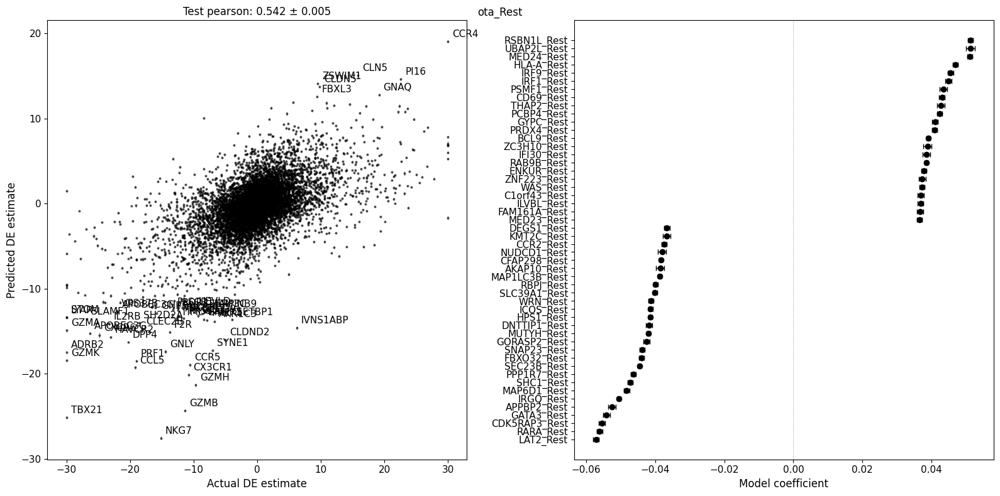

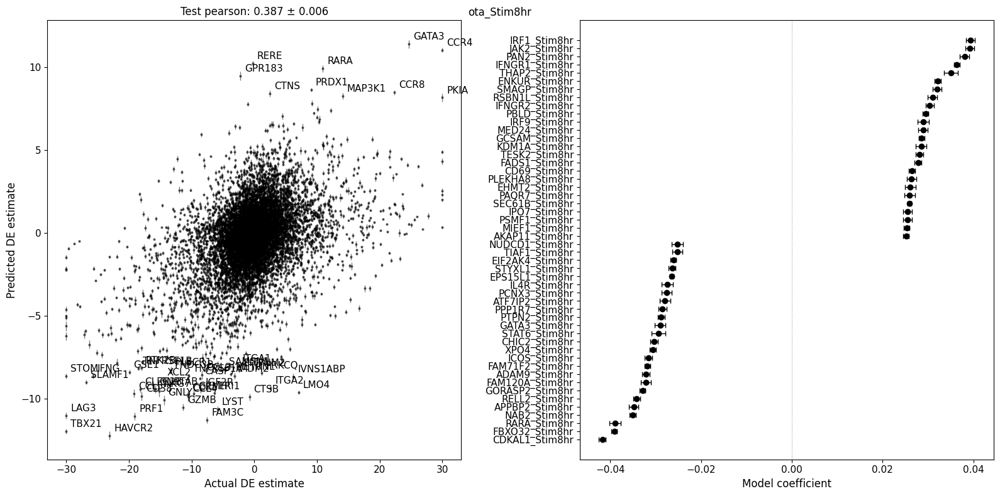

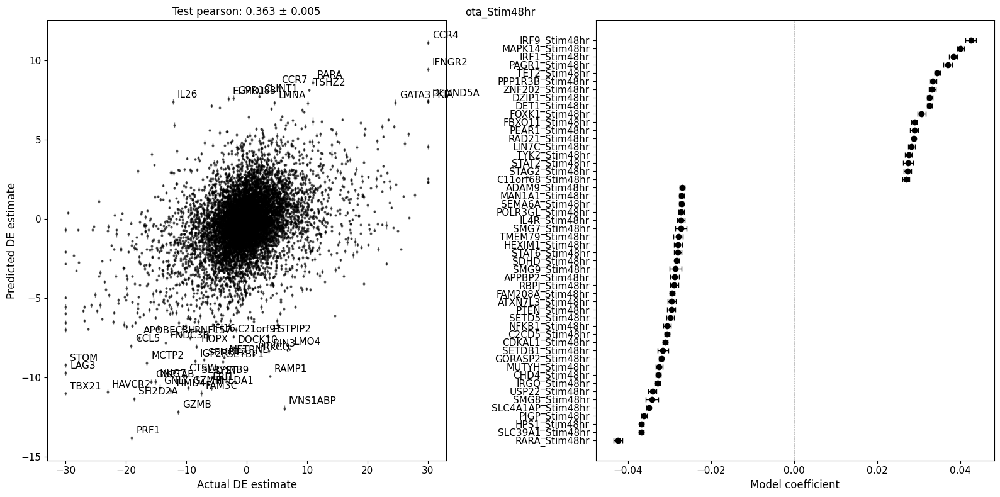

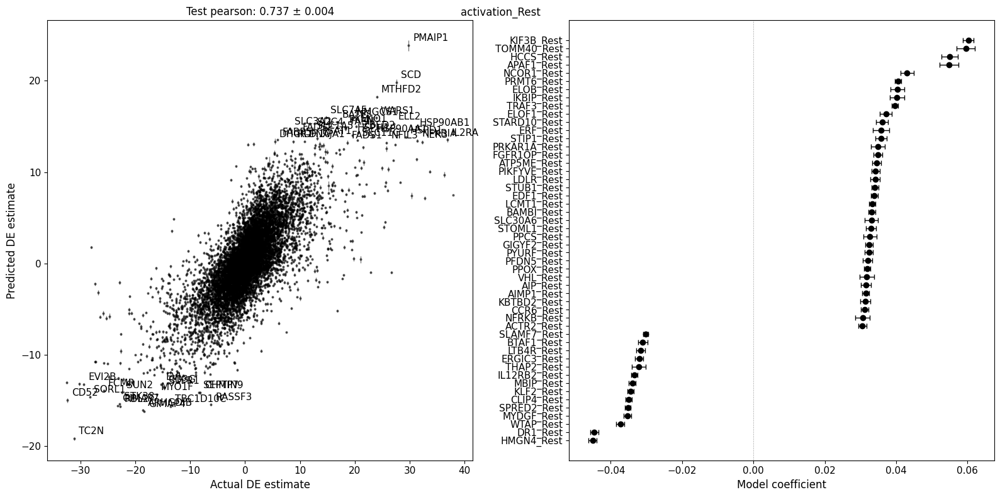

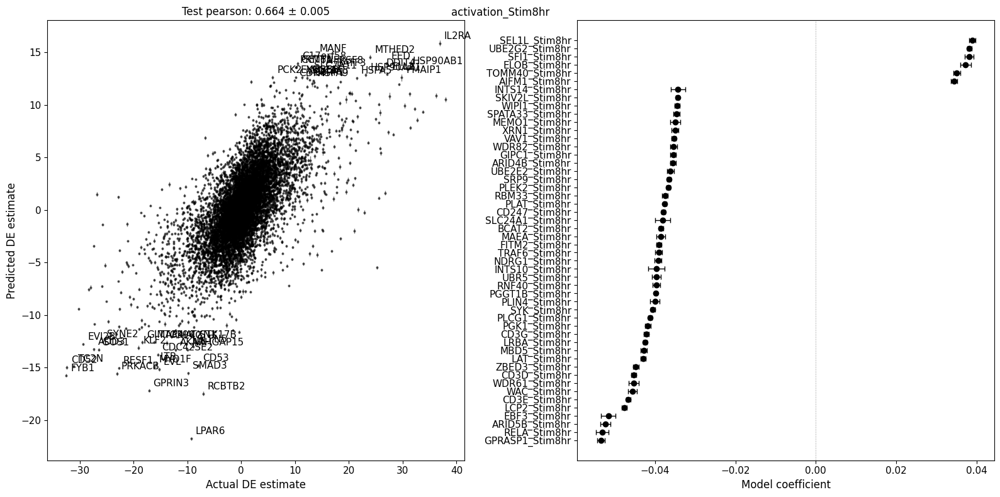

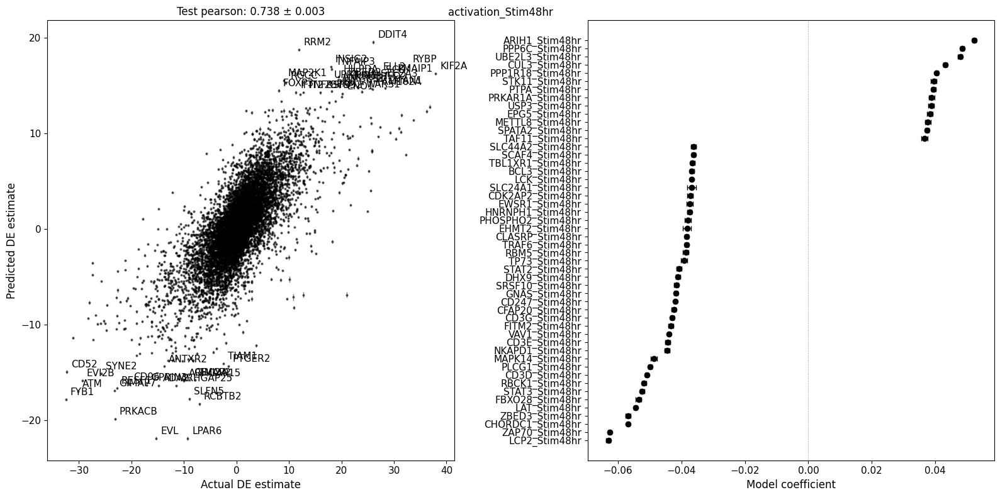

In [160]:
for dataset_key in comparison_results.keys():
    p2t_model, X_perturbs, y_target = comparison_results[dataset_key]
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    p2t_model.plot_prediction(X_perturbs, y_target, plot_metric='pearson', ax=axes[0], annotate_top_n=50)
    # p2t_model.plot_prediction(X_perturbs[y_target.abs() > 2], y_target[y_target.abs() > 2], plot_metric='pearson', ax=axes[0], annotate_top_n=50)
    p2t_model.plot_coefs(top_n=50, ax=axes[1])
    fig.tight_layout()
    fig.suptitle(dataset_key)
    fig.show()

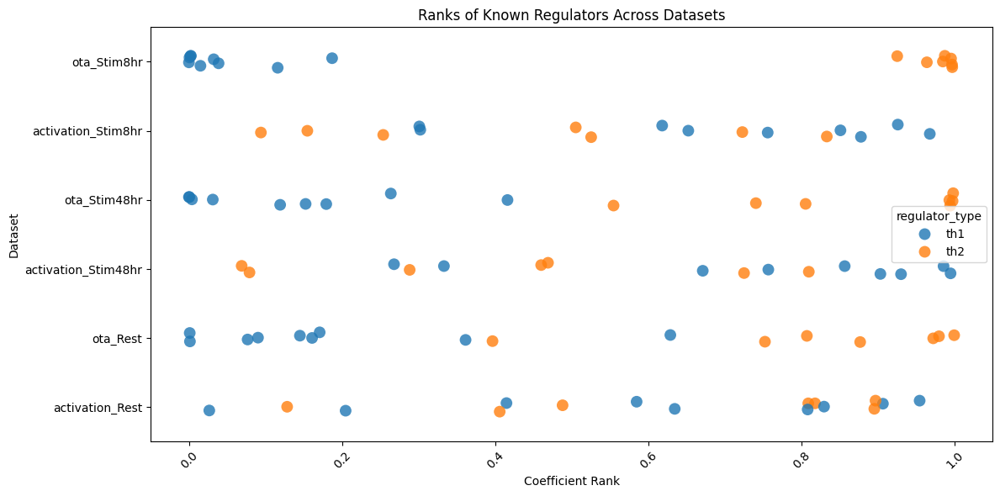

In [168]:
# Create mapping of regulator to cell type
regulator_type = {}
for cell_type, regulators in known_regulators.items():
    for reg in regulators:
        regulator_type[reg] = cell_type
# Combine coefficients from all datasets and normalize per dataset
all_coefs = []
for dataset_key in comparison_results.keys():
    if 'scrambled' not in dataset_key:
        p2t_model, X_perturbs, y_target = comparison_results[dataset_key]
        mod_coefs = p2t_model.get_coefs()
        
        # Get ranks of coefficients and normalize to 0-1
        coef_mean = mod_coefs['coef_mean']
        coef_ranks = coef_mean.rank(ascending=False)
        n_coefs = len(coef_ranks)
        normalized_ranks = (coef_ranks - 1) / (n_coefs - 1)  # Normalize to 0-1 range
        mod_coefs['coef_rank'] = normalized_ranks
        
        mod_coefs['regulator'] = mod_coefs.index.str.split('_').str[0]
        mod_coefs['known_regulators'] = mod_coefs['regulator'].isin(regulator_type.keys())
        mod_coefs['dataset_key'] = dataset_key
        
        # Add regulator type column
        mod_coefs['regulator_type'] = mod_coefs['regulator'].map(regulator_type)
        
        all_coefs.append(mod_coefs)

all_coefs_df = pd.concat(all_coefs)
all_coefs_df['celltype'] = all_coefs_df.dataset_key.str.split("_").str[1]
all_coefs_df['signature'] = all_coefs_df.dataset_key.str.split("_").str[0]
sorted_coefs = all_coefs_df.sort_values(['celltype', 'dataset_key'])

# Create single figure 
fig, ax = plt.subplots(figsize=(12, 6))

# Create strip plot of ranks for known regulators
sns.stripplot(data=sorted_coefs[sorted_coefs['known_regulators']], 
             y='dataset_key', x='coef_rank', ax=ax, hue='regulator_type', alpha=0.8, s=10)

ax.set_ylabel('Dataset')
ax.set_xlabel('Coefficient Rank')
ax.set_title('Ranks of Known Regulators Across Datasets')
plt.xticks(rotation=45)

# Invert y-axis so higher ranks are on top
ax.invert_yaxis()

plt.tight_layout()


/tmp/ipykernel_366490/4022892041.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
/tmp/ipykernel_366490/4022892041.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
/tmp/ipykernel_366490/4022892041.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)


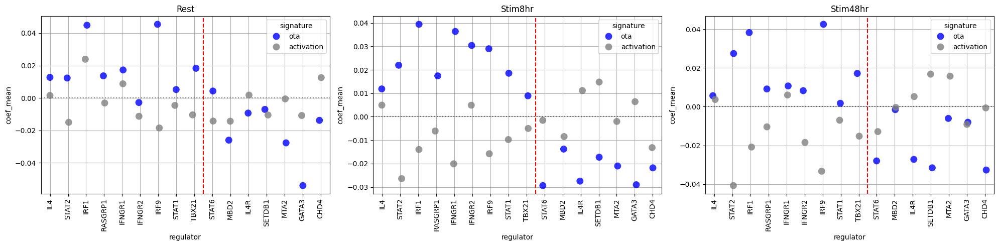

In [169]:
pl_df = all_coefs_df[all_coefs_df['known_regulators']].reset_index()
sorted_regulators = []
for cell_type in ['th1', 'th2']:
    sorted_regulators.extend([reg for reg in pl_df['regulator'].unique() if all_coefs_df[all_coefs_df['regulator']==reg]['regulator_type'].iloc[0] == cell_type])
pl_df['regulator'] = pd.Categorical(pl_df['regulator'], categories=sorted_regulators)
pl_df['signature'] = pl_df['dataset_key'].str.split('_').str[0]
pl_df['ct'] = pl_df['dataset_key'].str.split('_').str[1]

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

signature_palette = {
    'activation':'grey',
    'ota':'blue',
    'diff34':'green',
}

for i, condition in enumerate(['Rest', 'Stim8hr', 'Stim48hr']):
    sns.stripplot(data=pl_df[pl_df['ct'] == condition], hue='signature', palette=signature_palette,
                 x='regulator', y='coef_mean', alpha=0.8, ax=axes[i], s=10)
    axes[i].grid(True)
    axes[i].axhline(y=0, color='black', linestyle=':', alpha=0.5)
    
    # Add vertical line between th1 and th2 regulators
    th1_regs = [reg for reg in sorted_regulators if all_coefs_df[all_coefs_df['regulator']==reg]['regulator_type'].iloc[0] == 'th1']
    axes[i].axvline(x=len(th1_regs)-0.5, color='red', linestyle='--', alpha=1)
    
    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
    axes[i].set_title(condition)

plt.tight_layout()


---
---

## Old code - still cleaning 

### Compare with effect on cytokines

In [69]:
marker_gene = ['IFNG', 'IL4', 'IL5', 'IL13']
marker_zscore = adata_de[adata_de.obs.culture_condition=='Stim8hr', adata_de.var.gene_name.isin(marker_gene)].layers['zscore']
marker_zscore_df = pd.DataFrame(data=marker_zscore, 
                                index=adata_de[adata_de.obs.culture_condition=='Stim8hr'].obs.target_contrast_gene_name, 
                                columns=marker_gene)
marker_zscore_df.loc[marker_gene] = 0
marker_zscore_df = marker_zscore_df.reset_index().rename(columns={'index':'regulator'})
pl_df = pd.merge(all_coefs_df, marker_zscore_df, left_index=True, right_index=True)

# Compute correlation between coefficient means and IFNG response for each dataset
corr_results = []
for dataset_key in pl_df.dataset_key.unique():
    subset = pl_df[pl_df.dataset_key == dataset_key]
    corr = subset[['coef_mean', 'IL5']].corr().iloc[0,1]
    corr_results.append({
        'dataset_key': dataset_key,
        'correlation': corr
    })

corr_df = pd.DataFrame(corr_results)
print("\nCorrelation between coefficient means and IFNG response:")
print(corr_df)



Correlation between coefficient means and IFNG response:
            dataset_key  correlation
0              ota_Rest     0.001469
1           ota_Stim8hr     0.010458
2          ota_Stim48hr    -0.001109
3              ota_K562     0.037914
4           diff34_Rest    -0.000349
5        diff34_Stim8hr    -0.001279
6       diff34_Stim48hr     0.009797
7           diff34_K562     0.047927
8       activation_Rest     0.018221
9    activation_Stim8hr    -0.005547
10  activation_Stim48hr     0.009817
11      activation_K562     0.001070


## Fit model of target state from perturbations with Hollbacher et al 2021 signature

In [78]:
hollbacher_signature = pd.read_csv('results/hollbacher_Th2vsTh1_DE_results.csv', index_col='variable')

In [65]:
y_target = signature[signature.contrast==target_state]['zscore'].fillna(0).copy()
y_target = y_target[signature.reset_index().pivot_table(index='variable', columns='contrast', values='adj_p_value')[target_state] < 0.1]

y_target.loc['IL5']

KeyError: 'IL5'

In [66]:
perturb_layer = 'zscore'
ctrl_de = None
n_pcs = 60
n_splits = 5
n_repeats = 1
target_state = 'Th2_vs_Th1'
conds = ['Rest', 'Stim8hr', 'Stim48hr']
p2t_model_all = []
X_perturbs_all = []
y_target_all = []
signature = hollbacher_signature

for cond in conds:
    # Get target state values
    y_target = signature[signature.contrast==target_state]['zscore'].fillna(0).copy()
    # y_target = y_target[signature.reset_index().pivot_table(index='variable', columns='contrast', values='adj_p_value')[target_state] < 0.1]
    
    # Find common genes between all DE results
    common_gs = np.intersect1d(y_target.index, adata_de.var_names)
    print(f"Common genes between target and adata_de: {len(common_gs)}")
    
    y_target = y_target.loc[common_gs]
    
    # Get responses in stim cells
    print(f"Getting perturbation responses for condition: {cond}")
    X_perturbs = sc.get.obs_df(adata_de[adata_de.obs.culture_condition == cond], 
                                ['target_contrast_gene_name'] + list(common_gs), 
                                layer=perturb_layer)
    X_perturbs = X_perturbs.set_index('target_contrast_gene_name').T
    print(f"Perturbation matrix shape: {X_perturbs.shape}")
    
    # Mask effects in cis
    X_perturbs_masked = X_perturbs.copy()
    mask = pd.DataFrame(False, index=X_perturbs_masked.index, columns=X_perturbs_masked.columns)
    for idx in X_perturbs_masked.index:
        if idx in X_perturbs_masked.columns:
            mask.loc[idx, idx] = True
    X_perturbs_masked = X_perturbs_masked.mask(mask)
    # Impute masked values with column means
    X_perturbs_masked = X_perturbs_masked.fillna(X_perturbs_masked.mean())
    
    # Train model on CD4 cells
    print(f"Training CD4 model with {n_pcs} PCs, {n_splits} splits, {n_repeats} repeats")
    p2t_model = Perturb2StateModel(pca_transform=True, n_pcs=n_pcs, n_splits=n_splits, n_repeats=n_repeats, positive=False)
    p2t_model.fit(X_perturbs_masked, y_target, model_id=f'{cond}')
    print(f"CD4 model training complete.")
    
    print(f"Model training for {target_state} completed successfully")
    p2t_model_all.append(p2t_model)
    X_perturbs_all.append(X_perturbs)
    y_target_all.append(y_target)

Common genes between target and adata_de: 10616
Getting perturbation responses for condition: Rest
Perturbation matrix shape: (10616, 11288)
Training CD4 model with 60 PCs, 5 splits, 1 repeats
CD4 model training complete.
Model training for Th2_vs_Th1 completed successfully
Common genes between target and adata_de: 10616
Getting perturbation responses for condition: Stim8hr
Perturbation matrix shape: (10616, 11416)
Training CD4 model with 60 PCs, 5 splits, 1 repeats
CD4 model training complete.
Model training for Th2_vs_Th1 completed successfully
Common genes between target and adata_de: 10616
Getting perturbation responses for condition: Stim48hr
Perturbation matrix shape: (10616, 11282)
Training CD4 model with 60 PCs, 5 splits, 1 repeats
CD4 model training complete.
Model training for Th2_vs_Th1 completed successfully


In [70]:
hollbacher_p2t_model_all = p2t_model_all.copy()
hollbacher_X_perturbs_all = X_perturbs_all.copy()
hollbacher_y_target_all = y_target_all.copy()
hollbacher_pt_coef_all = []
for i in range(len(hollbacher_p2t_model_all)):
    hollbacher_pt_coef_all.append(hollbacher_p2t_model_all[i].get_coefs())

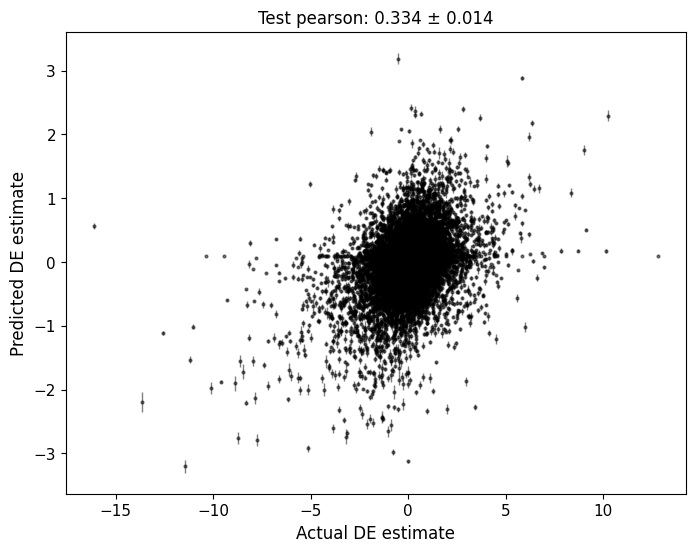

In [71]:
i = 1
pl1 = p2t_model_all[i].plot_prediction(hollbacher_X_perturbs_all[i].fillna(0), hollbacher_y_target_all[i], plot_metric='pearson')

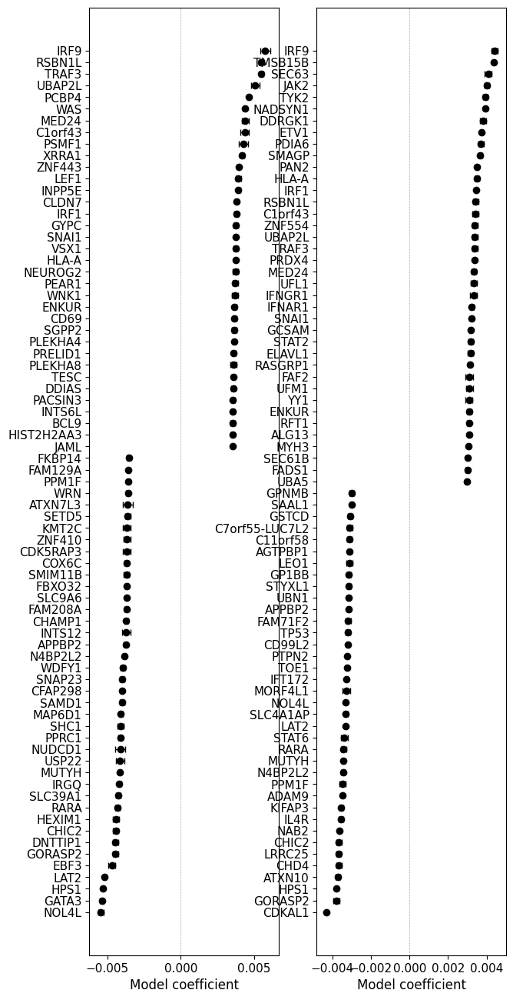

In [73]:
fig, axs = plt.subplots(1,2,figsize=(7, 16))
p = hollbacher_p2t_model_all[0].plot_coefs(top_n=75, ax=axs[0])
p = hollbacher_p2t_model_all[1].plot_coefs(top_n=75, ax=axs[1])


In [77]:
signature[signature['adj_p_value'] < 0.1].loc['IFNG']

baseMean        61.068016
log_fc          -7.728838
lfcSE            1.512384
stat            -5.110369
p_value               0.0
adj_p_value       0.00003
contrast       Th2_vs_Th1
zscore          -5.110369
Name: IFNG, dtype: object

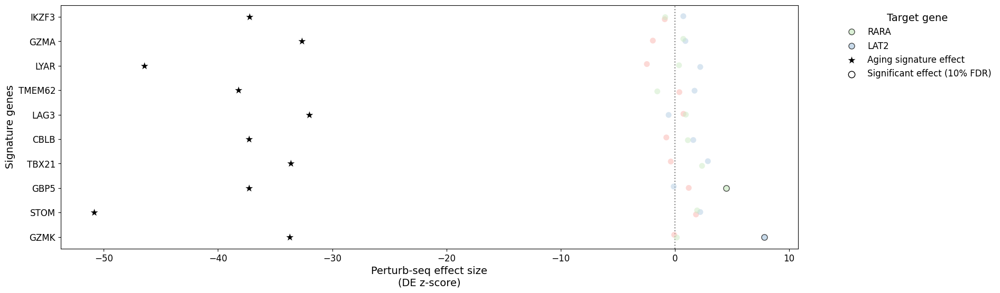

In [33]:
gs = y_target_all[i].sort_values().iloc[0:10].index.tolist()
plot_regulator_effects(adata_de, genes=gs, regulators = ['GATA3', 'LAT2', 'RARA'], y_target =  y_target_all[i], sort_by='perturbation', figsize=(18, 6), condition='Rest')

## Fit model of target state from perturbations with Ota et al 2021 signature

In [81]:
ota_signature = pd.read_csv('results/Ota_Th2vsTh1_DE_results.csv', index_col='variable')
#ota_signature = ota_signature[ota_signature.adj_p_value<=1].copy()

In [93]:
ota_signature.loc['IFNG']

baseMean        31.916292
log_fc           -7.26822
lfcSE            0.282466
stat           -25.731264
p_value               0.0
adj_p_value           0.0
contrast       Th2_vs_Th1
zscore         -25.731264
Name: IFNG, dtype: object

In [89]:
perturb_layer = 'zscore'
ctrl_de = None
n_pcs = 60
n_splits = 5
n_repeats = 1
target_state = 'Th2_vs_Th1'
conds = ['Rest', 'Stim8hr', 'Stim48hr']
p2t_model_all = []
X_perturbs_all = []
y_target_all = []
signature = ota_signature

for cond in conds:
    # Get target state values
    y_target = signature[signature.contrast==target_state]['zscore'].fillna(0).copy()
    
    # Find common genes between all DE results
    common_gs = np.intersect1d(y_target.index, adata_de.var_names)
    print(f"Common genes between target and adata_de: {len(common_gs)}")
    
    y_target = y_target.loc[common_gs]
    
    # Get responses in stim cells
    print(f"Getting perturbation responses for condition: {cond}")
    X_perturbs = sc.get.obs_df(adata_de[adata_de.obs.culture_condition == cond], 
                                ['target_contrast_gene_name'] + list(common_gs), 
                                layer=perturb_layer)
    X_perturbs = X_perturbs.set_index('target_contrast_gene_name').T
    print(f"Perturbation matrix shape: {X_perturbs.shape}")
    
    # Mask effects in cis
    X_perturbs_masked = X_perturbs.copy()
    mask = pd.DataFrame(False, index=X_perturbs_masked.index, columns=X_perturbs_masked.columns)
    for idx in X_perturbs_masked.index:
        if idx in X_perturbs_masked.columns:
            mask.loc[idx, idx] = True
    X_perturbs_masked = X_perturbs_masked.mask(mask)
    # Impute masked values with column means
    X_perturbs_masked = X_perturbs_masked.fillna(X_perturbs_masked.mean())
    
    # Train model on CD4 cells
    print(f"Training CD4 model with {n_pcs} PCs, {n_splits} splits, {n_repeats} repeats")
    p2t_model = Perturb2StateModel(pca_transform=True, n_pcs=n_pcs, n_splits=n_splits, n_repeats=n_repeats, positive=False)
    p2t_model.fit(X_perturbs_masked, y_target, model_id=f'{cond}')
    print(f"CD4 model training complete.")
    
    print(f"Model training for {target_state} completed successfully")
    p2t_model_all.append(p2t_model)
    X_perturbs_all.append(X_perturbs)
    y_target_all.append(y_target)

Common genes between target and adata_de: 11370
Getting perturbation responses for condition: Rest
Perturbation matrix shape: (11370, 11288)
Training CD4 model with 60 PCs, 5 splits, 1 repeats
CD4 model training complete.
Model training for Th2_vs_Th1 completed successfully
Common genes between target and adata_de: 11370
Getting perturbation responses for condition: Stim8hr
Perturbation matrix shape: (11370, 11416)
Training CD4 model with 60 PCs, 5 splits, 1 repeats
CD4 model training complete.
Model training for Th2_vs_Th1 completed successfully
Common genes between target and adata_de: 11370
Getting perturbation responses for condition: Stim48hr
Perturbation matrix shape: (11370, 11282)
Training CD4 model with 60 PCs, 5 splits, 1 repeats
CD4 model training complete.
Model training for Th2_vs_Th1 completed successfully


In [91]:
ota_p2t_model_all = p2t_model_all.copy()
ota_X_perturbs_all = X_perturbs_all.copy()
ota_y_target_all = y_target_all.copy()
ota_pt_coef_all = []
for i in range(len(ota_p2t_model_all)):
    ota_pt_coef_all.append(ota_p2t_model_all[i].get_coefs())

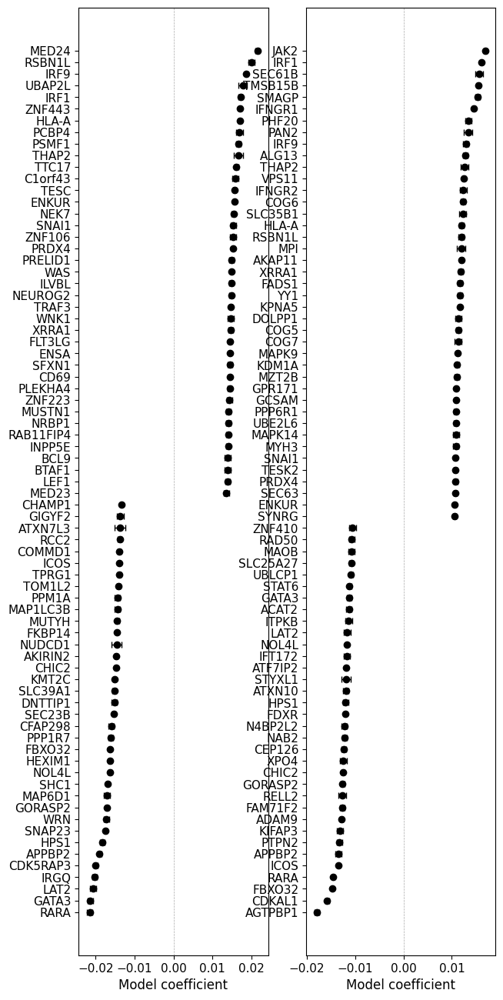

In [92]:
fig, axs = plt.subplots(1,2,figsize=(7, 16))
p = ota_p2t_model_all[0].plot_coefs(top_n=75, ax=axs[0])
p = ota_p2t_model_all[1].plot_coefs(top_n=75, ax=axs[1])


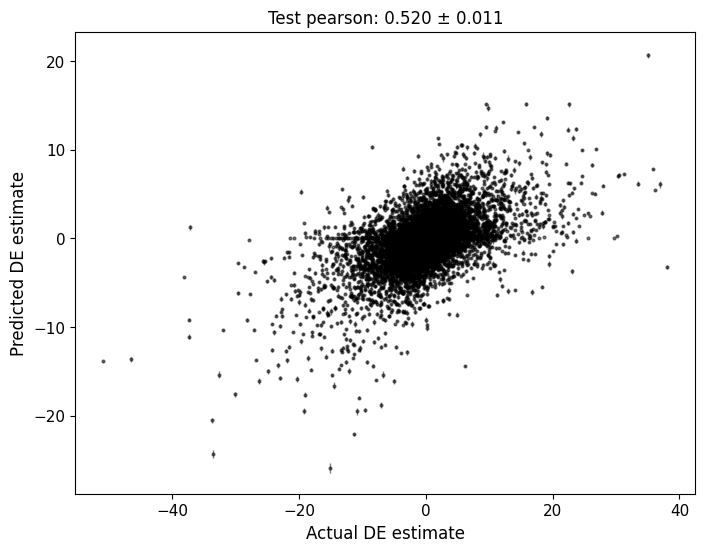

In [86]:
i = 0
pl1 = p2t_model_all[i].plot_prediction(X_perturbs_all[i].fillna(0), y_target_all[i], plot_metric='pearson')

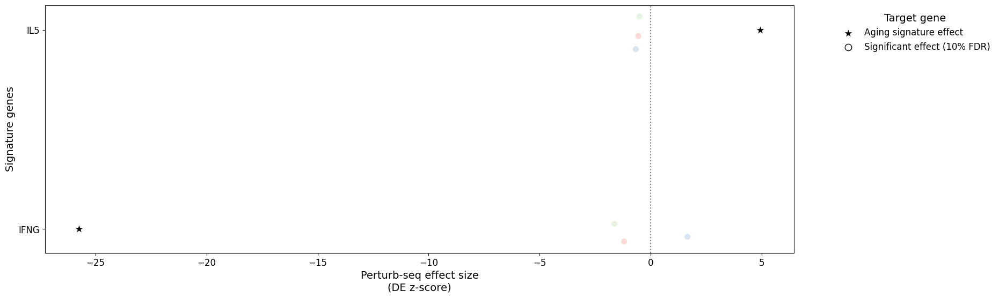

In [125]:
gs_up = y_target_all[i].sort_values(ascending=False).iloc[0:10].index.tolist()
gs_down = y_target_all[i].sort_values(ascending=True).iloc[0:10].index.tolist()
# plot_regulator_effects(adata_de, genes=gs_up + gs_down, regulators = ['GATA3', 'LAT2', 'RARA'], 
#     y_target =  y_target_all[i], 
#     sort_by='perturbation', figsize=(18, 6), condition='Rest')
data = plot_regulator_effects(adata_de, genes=['IL5', 'IFNG'], regulators = ['GATA3', 'IL4R', 'TBX21'], 
    y_target =  y_target_all[i], 
    sort_by='perturbation', figsize=(18, 6), condition='Rest', return_data=True)

In [123]:
long_de_results = get_DE_results_long(adata_de, targets=['GATA3', 'IL4R', 'TBX21'], genes=['IL5', 'IFNG'], gene_id_col='gene_name')
long_de_results = long_de_results[long_de_results['culture_condition'] == 'Stim48hr'].copy()
long_de_results
# wide_de_results = long_de_results.pivot(index='gene', columns='target_contrast_gene_name', values='zscore').T
# wide_de_results_signif = long_de_results.pivot(index='gene', columns='target_contrast_gene_name', values='adj_p_value').T

,index,gene,log_fc,zscore,adj_p_value,significant,gene_name,culture_condition,target_contrast,target_contrast_gene_name
2,ENSG00000073861_Stim48hr,IFNG,-3.291278,-7.131236,1.299845e-09,True,IFNG,Stim48hr,ENSG00000073861,TBX21
3,ENSG00000073861_Stim48hr,IL5,-1.927743,-2.029164,3.288766e-01,False,IL5,Stim48hr,ENSG00000073861,TBX21
8,ENSG00000077238_Stim48hr,IFNG,2.570156,7.070977,1.565178e-09,True,IFNG,Stim48hr,ENSG00000077238,IL4R
9,ENSG00000077238_Stim48hr,IL5,-4.128314,-4.677825,3.817235e-04,True,IL5,Stim48hr,ENSG00000077238,IL4R
14,ENSG00000107485_Stim48hr,IFNG,-1.091641,-2.986508,3.627261e-02,True,IFNG,Stim48hr,ENSG00000107485,GATA3
15,ENSG00000107485_Stim48hr,IL5,-3.816903,-4.697768,1.510149e-04,True,IL5,Stim48hr,ENSG00000107485,GATA3


In [118]:
wide_de_results_signif

gene,IFNG,IL5
target_contrast_gene_name,,
GATA3,0.380936,0.000309
IL4R,0.758496,0.871143
TBX21,0.012193,0.909360


In [162]:
long_de_results = get_DE_results_long(adata_de, genes=['IL5'], gene_id_col='gene_name')
long_de_results = long_de_results[(long_de_results['culture_condition'] == 'Rest') & (long_de_results['adj_p_value'] < 0.1)]
long_de_results.sort_values('adj_p_value').iloc[0:40]
# df = long_de_results.pivot(index='target_contrast_gene_name', columns='gene', values='log_fc')
# sns.scatterplot(data=df, x='IL5', y='IFNG', s=4, edgecolor='none')
# df.corr()

,index,gene,log_fc,zscore,adj_p_value,significant,gene_name,culture_condition,target_contrast,target_contrast_gene_name
12405,ENSG00000130023_Rest,IL5,9.492775,7.663095,1.123063e-10,True,IL5,Rest,ENSG00000130023,ERMARD
14442,ENSG00000136451_Rest,IL5,5.147986,5.461166,1.612830e-04,True,IL5,Rest,ENSG00000136451,VEZF1
2005,ENSG00000065548_Rest,IL5,5.168533,5.136492,4.948879e-04,True,IL5,Rest,ENSG00000065548,ZC3H15
10576,ENSG00000122122_Rest,IL5,4.586329,4.860691,2.727431e-03,True,IL5,Rest,ENSG00000122122,SASH3
20507,ENSG00000161558_Rest,IL5,5.258809,4.880258,6.555494e-03,True,IL5,Rest,ENSG00000161558,TMEM143
10833,ENSG00000123338_Rest,IL5,3.140786,3.117520,1.414285e-02,True,IL5,Rest,ENSG00000123338,NCKAP1L
19143,ENSG00000155363_Rest,IL5,4.171872,3.524723,1.869591e-02,True,IL5,Rest,ENSG00000155363,MOV10
10594,ENSG00000122223_Rest,IL5,3.866311,4.109823,2.227468e-02,True,IL5,Rest,ENSG00000122223,CD244
31947,ENSG00000205758_Rest,IL5,3.069017,3.209115,2.588561e-02,True,IL5,Rest,ENSG00000205758,CRYZL1
2201,ENSG00000067992_Rest,IL5,4.084425,4.375923,3.706525e-02,True,IL5,Rest,ENSG00000067992,PDK3


gene,GATA3,TBX21
gene,,
GATA3,1.000000,0.305337
TBX21,0.305337,1.000000


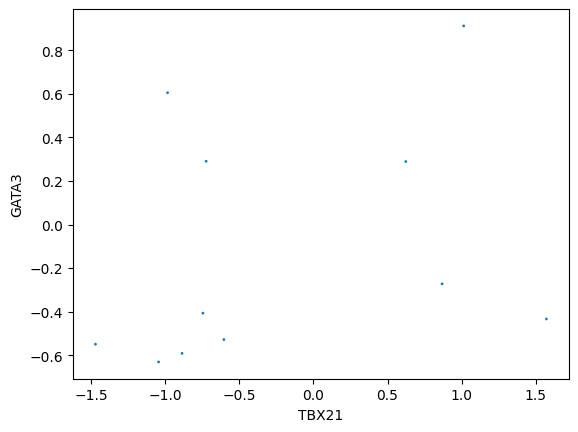

In [ ]:
long_de_results = get_DE_results_long(adata_de, genes=['TBX21', 'GATA3'], gene_id_col='gene_name')
long_de_results = long_de_results[(long_de_results['culture_condition'] == 'Stim8hr') & (long_de_results['adj_p_value'] < 0.1)]
df = long_de_results.pivot(index='target_contrast_gene_name', columns='gene', values='log_fc')
sns.scatterplot(data=df, x='TBX21', y='GATA3', s=4, edgecolor='none')

df.corr()

In [87]:
pt_coef_all = ota_pt_coef_all[0].copy()
pt_coef_all.columns = ['coef_mean_ota', 'coef_sem_ota']
pt_coef_all[['coef_mean_diff043', 'coef_sem_diff043']] = diff043_pt_coef_all[0][['coef_mean', 'coef_sem']]
pt_coef_all[['coef_mean_hollbacher', 'coef_sem_hollbacher']] = hollbacher_pt_coef_all[0][['coef_mean', 'coef_sem']]

NameError: name 'diff043_pt_coef_all' is not defined

In [53]:
pt_coef_all.head()

,coef_mean_ota,coef_sem_ota,coef_mean_diff043,coef_sem_diff043,coef_mean_hollbacher,coef_sem_hollbacher
ABHD5,-0.006855,0.000505,-0.004739,0.000110,-0.001762,0.000194
TRIO,-0.001306,0.000614,-0.004017,0.000295,0.000172,0.000160
CDON,0.002769,0.000359,-0.003897,0.000152,0.001111,0.000099
ITCH,-0.005196,0.000355,0.003105,0.000432,-0.000458,0.000047
COL16A1,0.000169,0.000450,0.011129,0.000323,-0.000047,0.000099


In [54]:
marker_gene = ['IFNG', 'IL4', 'IL5', 'IL13']
marker_zscore = adata_de[adata_de.obs.culture_condition=='Stim8hr', adata_de.var.gene_name.isin(marker_gene)].layers['zscore']
marker_zscore_df = pd.DataFrame(data=marker_zscore, 
                                index=adata_de[adata_de.obs.culture_condition=='Stim8hr'].obs.target_contrast_gene_name, 
                                columns=marker_gene)
marker_zscore_df.loc[marker_gene] = 0

test = pd.merge(pt_coef_all, marker_zscore_df, left_index=True, right_index=True)

In [55]:
test

,coef_mean_ota,coef_sem_ota,coef_mean_diff043,coef_sem_diff043,coef_mean_hollbacher,coef_sem_hollbacher,IFNG,IL4,IL5,IL13
ABHD5,-0.006855,0.000505,-0.004739,0.000110,-0.001762,0.000194,-0.375944,-1.092689,-3.069032,-0.282528
TRIO,-0.001306,0.000614,-0.004017,0.000295,0.000172,0.000160,-1.006430,0.169055,-1.998519,0.099467
CDON,0.002769,0.000359,-0.003897,0.000152,0.001111,0.000099,1.847287,-1.598804,-3.517729,-0.706020
ITCH,-0.005196,0.000355,0.003105,0.000432,-0.000458,0.000047,0.910874,0.069976,0.283396,1.242052
COL16A1,0.000169,0.000450,0.011129,0.000323,-0.000047,0.000099,-0.320822,-1.043702,-1.012125,0.166671
...,...,...,...,...,...,...,...,...,...,...
ZNF442,-0.002282,0.000257,0.001633,0.000123,-0.001125,0.000105,-1.969056,-1.829010,0.768495,-1.267123
SERF1B,0.005026,0.000277,-0.000575,0.000185,0.000782,0.000062,-2.092855,-2.311584,-2.900983,-1.050056
NPTXR,0.002138,0.000441,-0.000389,0.000167,0.000672,0.000065,1.369372,-2.483543,0.692755,0.320003
SLFN14,0.001719,0.000542,-0.002823,0.000291,-0.000108,0.000102,1.049527,0.769417,-0.307702,0.727357


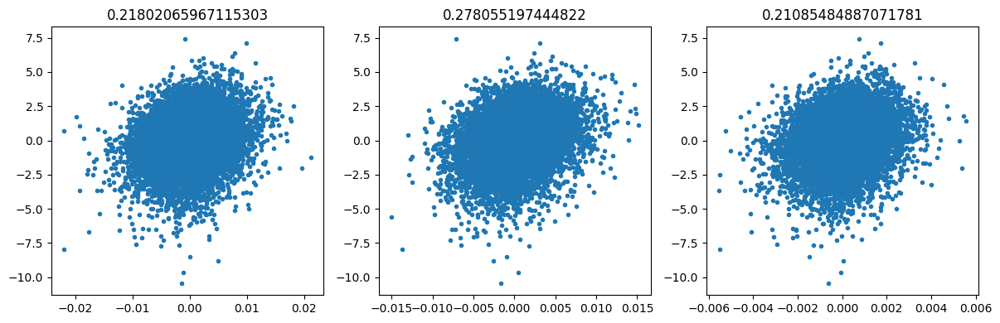

In [56]:
fig, ax = plt.subplots(1,3,figsize=(12,4))
ax[0].plot(test['coef_mean_ota'], test['IL13']-test['IFNG'],'.')
ax[0].set_title(pearsonr(test['coef_mean_ota'], test['IL13']-test['IFNG'])[0])
ax[1].plot(test['coef_mean_diff043'], test['IL13']-test['IFNG'],'.')
ax[1].set_title(pearsonr(test['coef_mean_diff043'], test['IL13']-test['IFNG'])[0])
ax[2].plot(test['coef_mean_hollbacher'], test['IL13']-test['IFNG'],'.')
ax[2].set_title(pearsonr(test['coef_mean_hollbacher'], test['IL13']-test['IFNG'])[0])

plt.tight_layout()

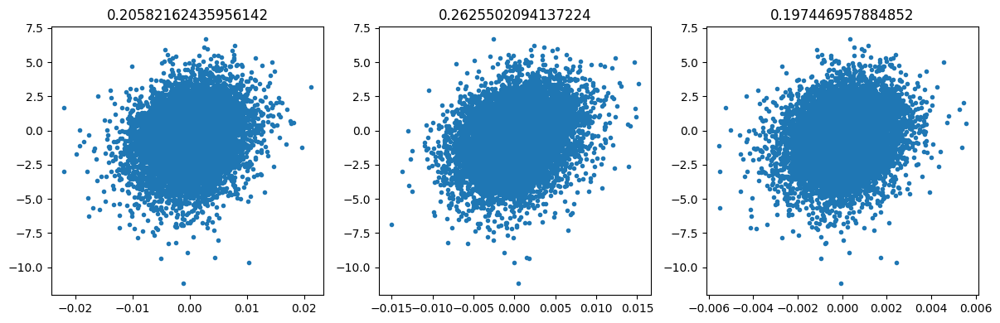

In [57]:
fig, ax = plt.subplots(1,3,figsize=(12,4))
ax[0].plot(test['coef_mean_ota'], test['IL5']-test['IFNG'],'.')
ax[0].set_title(pearsonr(test['coef_mean_ota'], test['IL5']-test['IFNG'])[0])
ax[1].plot(test['coef_mean_diff043'], test['IL5']-test['IFNG'],'.')
ax[1].set_title(pearsonr(test['coef_mean_diff043'], test['IL5']-test['IFNG'])[0])
ax[2].plot(test['coef_mean_hollbacher'], test['IL5']-test['IFNG'],'.')
ax[2].set_title(pearsonr(test['coef_mean_hollbacher'], test['IL5']-test['IFNG'])[0])

plt.tight_layout()

In [128]:
pt_coef_all.to_csv('results/ota_vs_Diff043Rest_Th2_vs_Th1_regulators.csv')

In [62]:
pt_coef_all_old = pd.read_csv('results/ota_vs_diff043Rest_Th2_vs_Th1_regulators.csv', index_col=0)

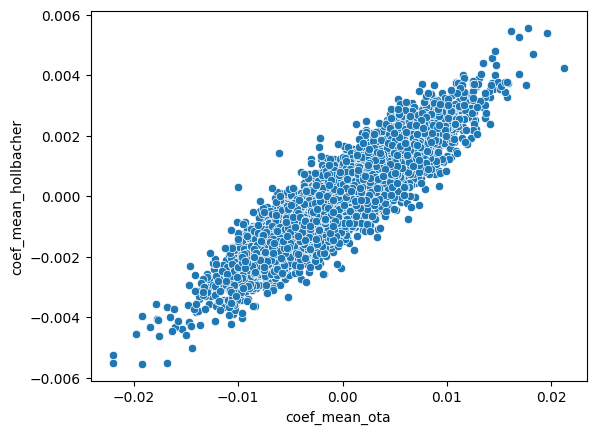

In [77]:
fig = sns.scatterplot(
    pt_coef_all,
    x='coef_mean_ota',
    y='coef_mean_hollbacher'
    
)

Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.


([Text(-0.01840681965087628, -0.012836417061364543, 'GATA3'),
  Text(-0.0015828511242658126, -0.008191673462664393, 'IL4R'),
  Text(0.003408417564077962, 0.002604760285394258, 'STAT1'),
  Text(0.012581169974177159, -0.0010337076200736192, 'IFNGR1'),
  Text(0.00402653992902452, 0.009441812775669196, 'IL5'),
  Text(0.011168655598574946, 0.003431843168022093, 'IL4'),
  Text(0.005167998867370384, 0.0001975740242629448, 'STAT4'),
  Text(0.009634281798701745, 0.007980951332095601, 'TBX21'),
  Text(0.0032662896693964397, 0.005043349281190004, 'STAT6'),
  Text(0.01276950140043727, 0.0010891708021905505, 'BACH2'),
  Text(-0.0014200505772290414, 0.007888901305739732, 'STAT3'),
  Text(0.01143987456787944, 0.010329400196171377, 'RASGRP1'),
  Text(0.00952059815004782, 0.005864005050528122, 'NLRP1'),
  Text(-0.0035810339638741306, 0.0002473597164461515, 'XBP1'),
  Text(0.0025131500304689525, -0.0020009218288722617, 'SETDB1'),
  Text(-0.004313261799123051, 0.002688755663234812, 'IFNGR2')],
 [Text(0.0

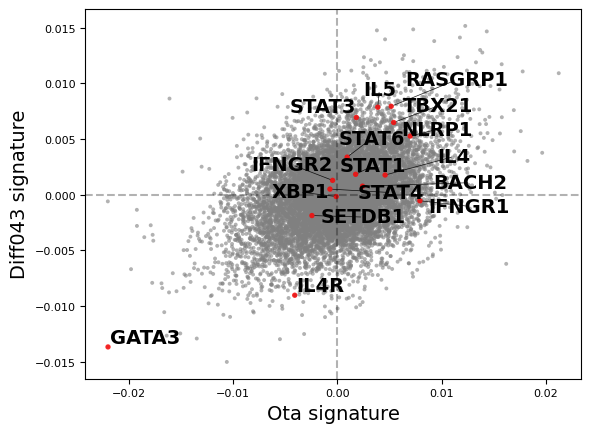

In [79]:
known_regulators = [
    'GATA3', 'IL4R', 'STAT1', 'IFNGR1', 'IKFZ1', 'IL5', 'IL4',
    'STAT4', 'TBX21', "STAT6", 'BACH2', 'STAT3',
    'RASGRP1', 'NLRP1', 'XBP1', 'SETDB1', 'IFNGR2'
]
ax = sns.scatterplot(data=pt_coef_all, x='coef_mean_ota', y='coef_mean_diff043', color='grey', s=8, alpha=0.6, edgecolor='none')

# Add scatter points for known regulators in red
regulators = pt_coef_all[pt_coef_all.index.isin(known_regulators)]
sns.scatterplot(data=regulators, x='coef_mean_ota', y='coef_mean_diff043', color='red', s=15,alpha=0.8, edgecolor='none', ax=ax)

# Add dotted lines at x=0 and y=0
ax.axhline(y=0, color='black', linestyle='--', alpha=0.3)
ax.axvline(x=0, color='black', linestyle='--', alpha=0.3)

# Set larger font sizes for axis labels and ticks
ax.set_xlabel('Ota signature', fontsize=14)
ax.set_ylabel('Diff043 signature', fontsize=14)
ax.tick_params(axis='both', which='major', labelsize=8)

# Add annotations for known regulators using adjustText
from adjustText import adjust_text
texts = []
for gene in known_regulators:
    if gene in pt_coef_all.index:
        texts.append(ax.text(pt_coef_all.loc[gene, 'coef_mean_ota'], 
                           pt_coef_all.loc[gene, 'coef_mean_diff043'],
                           gene,
                           fontsize=14,
                           weight='bold'))

# Adjust text positions to avoid overlaps|
adjust_text(texts, 
           arrowprops=dict(arrowstyle='-', color='black', lw=0.5, alpha=0.9),
           expand_points=(1.5, 1.5))

In [114]:
all_coef = pd.read_csv('results/ota_vs_diff043Rest_Th2_vs_Th1_regulators.csv', index_col=0)

In [115]:
marker_gene = ['IFNG', 'IL4', 'IL5', 'IL13']
marker_zscore = adata_de[adata_de.obs.culture_condition=='Stim8hr', adata_de.var.gene_name.isin(marker_gene)].layers['zscore']
marker_zscore_df = pd.DataFrame(data=marker_zscore, 
                                index=adata_de[adata_de.obs.culture_condition=='Stim8hr'].obs.target_contrast_gene_name, 
                                columns=marker_gene)
marker_zscore_df.loc[marker_gene] = 0

test = pd.merge(pt_coef_all, marker_zscore_df, left_index=True, right_index=True)

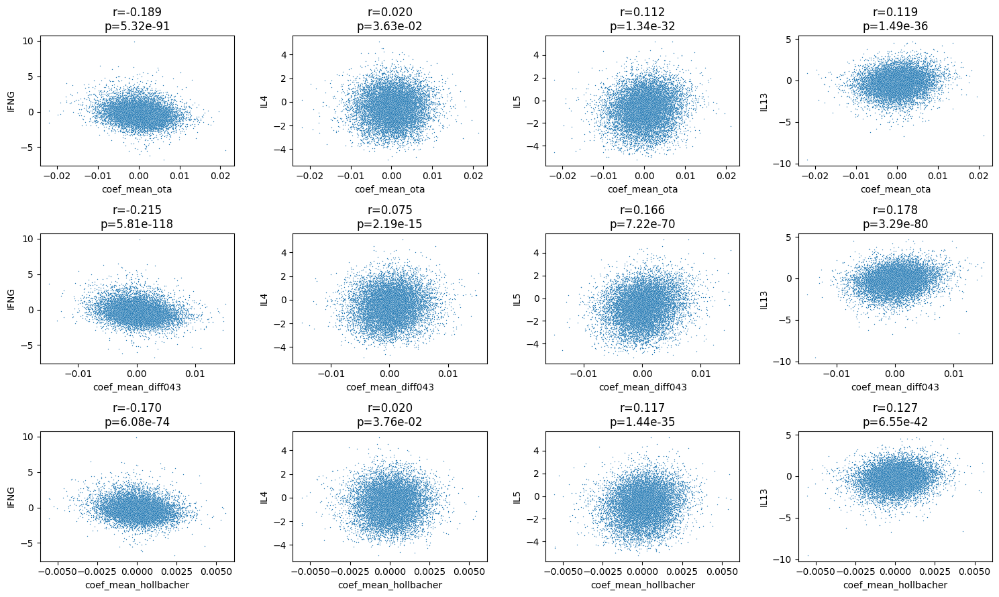

In [117]:
fig, ax = plt.subplots(3, 4, figsize=(15,9))
coef_label = ['coef_mean_ota', 'coef_mean_diff043', 'coef_mean_hollbacher']
for i, col in enumerate(coef_label):
    for j, marker in enumerate(marker_gene):
        sns.scatterplot(test, x=col, y=marker, ax=ax[i,j], s=1)
        corr, pval = pearsonr(test[col], test[marker])
        ax[i,j].set_title(f'r={corr:.3f}\np={pval:.2e}')

plt.tight_layout()

In [88]:
marker_zscore_rest = adata_de[adata_de.obs.culture_condition=='Rest', adata_de.var.gene_name.isin(marker_gene)].layers['zscore']
marker_zscore_rest_df = pd.DataFrame(data=marker_zscore_rest, 
                                index=adata_de[adata_de.obs.culture_condition=='Rest'].obs.target_contrast_gene_name, 
                                columns=marker_gene)
marker_zscore_rest_df.loc[marker_gene] = 0

marker_zscore_stim8hr = adata_de[adata_de.obs.culture_condition=='Stim8hr', adata_de.var.gene_name.isin(marker_gene)].layers['zscore']
marker_zscore_stim8hr_df = pd.DataFrame(data=marker_zscore_stim8hr, 
                                index=adata_de[adata_de.obs.culture_condition=='Stim8hr'].obs.target_contrast_gene_name, 
                                columns=marker_gene)
marker_zscore_stim8hr_df.loc[marker_gene] = 0

In [89]:
test2 = pd.merge(marker_zscore_rest_df, marker_zscore_stim8hr_df, left_index=True, right_index=True, suffixes=('_rest', '_stim8hr'))

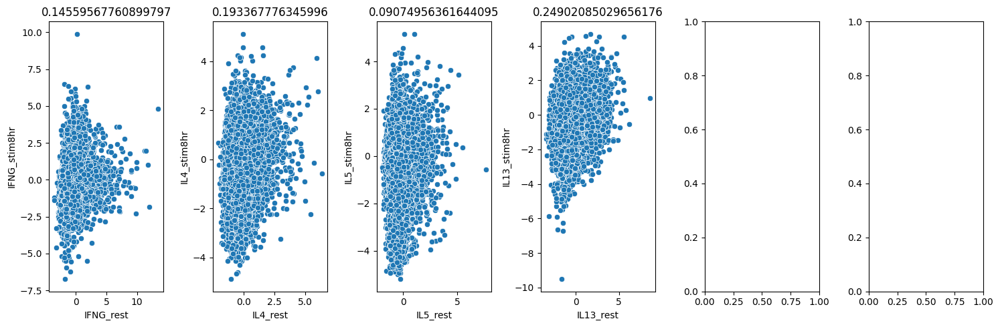

In [90]:
fig, ax = plt.subplots(1, 6, figsize=(15,5))
for i, marker in enumerate(marker_gene):
    sns.scatterplot(test2, x=marker+'_rest', y=marker+'_stim8hr', ax=ax[i])
    ax[i].set_title(pearsonr(test2[marker+'_rest'], test2[marker+'_stim8hr'])[0])

plt.tight_layout()

### Plot DE effects of predicted regulators

In [93]:
signature_ota = pd.read_csv('results/Ota_Th2vsTh1_DE_results.csv')
signature_diff043 = pd.read_csv('results/Diff043_Th2vsTh1_DE_results.csv')
signature_diff043rest = signature_diff043[signature_diff043.contrast=='Th2_vs_Th1_Rest'].copy()
all_coef = pd.read_csv('results/ota_vs_diff043Rest_Th2_vs_Th1_regulators.csv', index_col=0)
common_gs = set(signature_ota.variable) & set(signature_diff043rest.variable) & set(adata_de.var_names)
signature_ota_subset = signature_ota[signature_ota.variable.isin(common_gs)].copy()
signature_diff043rest_subset = signature_diff043rest[signature_diff043rest.variable.isin(common_gs)].copy()

In [97]:
num_of_sig_genes = 60
signature_gs_ota = signature_ota_subset.sort_values(by='adj_p_value').variable[:num_of_sig_genes].tolist()
signature_gs_ota = list(set(signature_gs_ota) | set(['GATA3', 'TBX21']))
signature_gs_diff043 = signature_diff043rest_subset.sort_values(by='adj_p_value').variable[:num_of_sig_genes].tolist()
signature_gs_diff043 = list(set(signature_gs_diff043) | set(['GATA3', 'TBX21']))

In [94]:
all_coef = pd.read_csv('results/ota_vs_diff043Rest_Th2_vs_Th1_regulators.csv', index_col=0)
top_quant = 0.02

coef_label = 'coef_mean_ota'
n = len(all_coef)
top_percent = all_coef[coef_label].nlargest(int(n * top_quant))
bottom_percent = all_coef[coef_label].nsmallest(int(n * top_quant))
predicted_effect_size = pd.concat([top_percent, bottom_percent]).sort_values(ascending=False)
predicted_regulator_ota = predicted_effect_size.index.tolist()

coef_label = 'coef_mean_Diff043'
top_percent = all_coef[coef_label].nlargest(int(n * top_quant))
bottom_percent = all_coef[coef_label].nsmallest(int(n * top_quant))
predicted_effect_size = pd.concat([top_percent, bottom_percent]).sort_values(ascending=False)
predicted_regulator_diff043 = predicted_effect_size.index.tolist()

In [95]:
predicted_regulator = list(set(predicted_regulator_ota) & set(predicted_regulator_diff043))
#predicted_regulator = predicted_regulator_diff043
predicted_regulator = predicted_regulator + ['ARRDC4', 'TMED9', 'SMARCB1', 'ACBD5', 'MEAF6']
len(predicted_regulator)

97

In [98]:
long_de_results = get_DE_results_long(adata_de, targets=predicted_regulator, genes=signature_gs_ota, gene_id_col='gene_name')
long_de_results = long_de_results[long_de_results['culture_condition'] == 'Rest'].copy()
wide_de_results = long_de_results.pivot(index='gene', columns='target_contrast_gene_name', values='zscore')

long_de_results = get_DE_results_long(adata_de, targets=predicted_regulator, genes=['IFNG', 'IL4', 'IL5', 'IL13'], gene_id_col='gene_name')
long_de_results = long_de_results[long_de_results['culture_condition'] == 'Stim8hr'].copy()
wide_de_results_2 = long_de_results.pivot(index='gene', columns='target_contrast_gene_name', values='zscore')

wide_de_results = pd.concat([wide_de_results, wide_de_results_2], axis=0)

In [99]:
# Create a mask for diagonal values and low zscore values
mask = pd.DataFrame(False, index=wide_de_results.index, columns=wide_de_results.columns)
for idx in wide_de_results.index:
    if idx in wide_de_results.columns:
        mask.loc[idx, idx] = True
# Add mask for abs zscore < 1
mask = mask | (wide_de_results.abs() < 0)
wide_de_results = wide_de_results.mask(mask, 0)
wide_de_results = wide_de_results.T
wide_de_results = wide_de_results.fillna(0)

In [100]:
wide_de_results.head()

gene,ABCB1,ADRB2,APOBEC3G,ARAP2,ARHGAP26,C1orf162,CBLB,CCR4,CD2,CHDH,...,TESPA1,TIAM1,TMEM62,TRPS1,ZC2HC1A,ZNF101,IFNG,IL13,IL4,IL5
target_contrast_gene_name,,,,,,,,,,,,,,,,,,,,,
ACBD5,-0.530281,-1.601425,-0.684748,0.554238,0.007288,0.860280,0.134310,-0.552100,-1.815784,1.501492,...,1.519333,-0.628302,-0.101217,-0.763234,0.139586,-0.790415,-2.514769,2.290927,1.474729,2.069141
ADCK5,0.136229,-0.423720,0.558188,0.264366,1.048630,2.560499,-0.968859,1.108315,-1.435060,-0.539407,...,0.794222,0.764283,-0.746773,-0.415622,1.106008,-1.120895,-0.531295,-1.156097,-0.089661,0.463589
ADCY7,0.465762,-0.200213,-0.271029,0.618420,-1.120654,0.033798,0.693937,0.444936,-2.005722,1.471992,...,-0.349197,-1.687214,-0.462316,-0.810354,-0.413033,-2.661102,-0.565176,0.822735,-0.163016,0.450186
AGPS,0.126441,0.932730,0.912374,-0.477592,1.050973,-0.262465,-1.603056,-2.645957,-0.248697,-0.388036,...,-1.140805,1.845030,-0.158819,-1.535006,-1.125393,2.133681,-0.155644,-1.572102,-1.776245,-1.488841
APOC1,-0.165077,-2.430398,-1.608141,-0.723926,0.156451,-0.349819,-0.015049,1.046677,-1.040857,0.436213,...,0.601485,-0.828242,0.660892,-1.190729,0.696793,-0.095719,-0.643861,-0.062218,-0.848307,1.455032


In [101]:
predicted_regulator_annot = list(wide_de_results.index).copy()
for i, reg in enumerate(predicted_regulator_annot):
    if reg in (set(predicted_regulator_ota) & set(predicted_regulator_diff043)):
        predicted_regulator_annot[i] = reg + '_both'
    elif reg in predicted_regulator_ota:
        predicted_regulator_annot[i] = reg + '_ota'
    else:
        predicted_regulator_annot[i] = reg + '_diff043rest'

predicted_regulator = wide_de_results.index
wide_de_results.index = predicted_regulator_annot

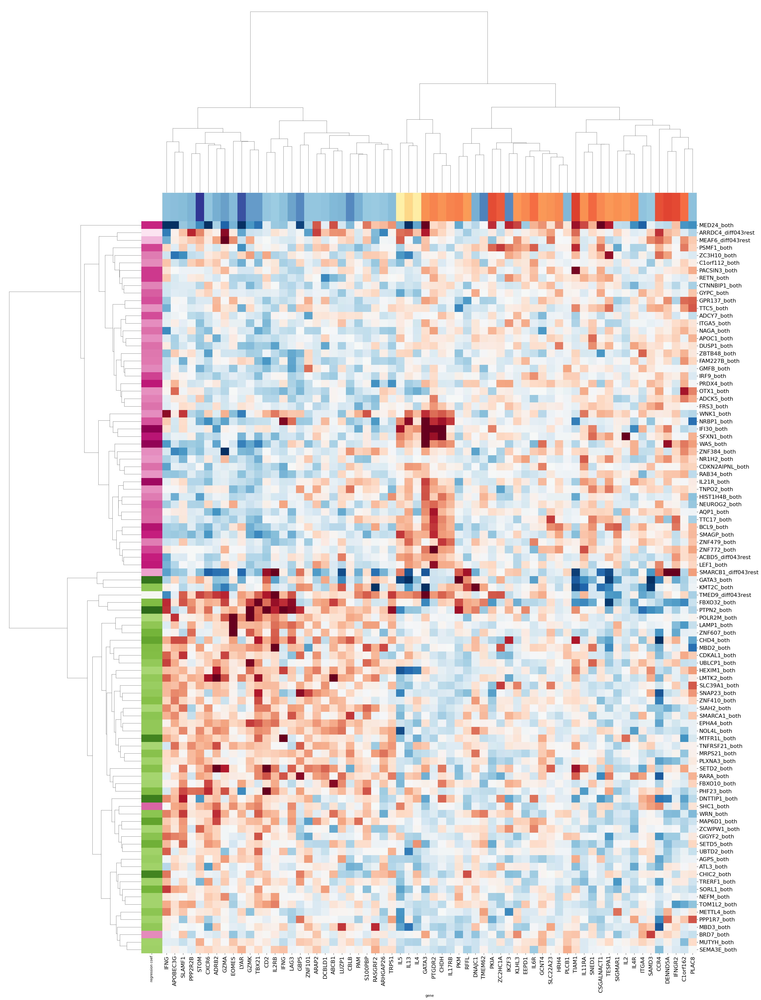

In [105]:
# Create row annotation dataframe with predicted effect sizes (now rows after transpose)
row_annot = pd.DataFrame({
    'regression coef': all_coef.loc[predicted_regulator]['coef_mean_Diff043']
})

# Create column annotation dataframe with signature zscores (now columns after transpose)
col_annot = pd.DataFrame({
    'zscore': signature_ota_subset.set_index('variable').loc[wide_de_results.columns, 'zscore'],
    # 'activation_gene': wide_de_results.columns.isin(activation_genes)
})

# Create different color maps for annotations
cmap_row = plt.cm.PiYG_r    # Pink-Yellow-Green for row annotation (predicted effect size)
cmap_col = plt.cm.RdYlBu_r  # Red-Yellow-Blue for column annotation (signature zscore)
cmap_activation = plt.cm.binary  # Binary colormap for activation genes

# Center the colormaps at 0 by using symmetric vmin/vmax
vmax_row = max(abs(row_annot['regression coef'].min()), abs(row_annot['regression coef'].max()))
vmax_col = max(abs(col_annot['zscore'].min()), abs(col_annot['zscore'].max()))
# Create color series for annotations (seaborn expects Series, not DataFrame with RGBA)
row_colors = row_annot['regression coef'].apply(lambda x: cmap_row((x + vmax_row) / (2 * vmax_row)))
row_colors.index = predicted_regulator_annot
col_colors = col_annot['zscore'].apply(lambda x: cmap_col((x + vmax_col) / (2 * vmax_col)))
# activation_colors = col_annot['activation_gene'].apply(lambda x: cmap_activation(1.0 if x else 0.0))

# Create the clustermap
#plt.figure(figsize=(20, 15))
g = sns.clustermap(wide_de_results,
                   cmap='RdBu_r',
                   center=0,
                   row_cluster=True,
                   col_cluster=True,
                   xticklabels=True,
                   yticklabels=True,
                   method='ward',
                   figsize=(30, 40),
                   row_colors=row_colors,
                   col_colors=[col_colors],
                   vmin=-5,
                   vmax=5,
                   cbar_pos=None)

# Rotate x-axis labels
plt.setp(g.ax_heatmap.get_xticklabels(), rotation=90, ha='center', fontsize=16)
plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0, fontsize=16)

# plt.savefig('../../../RZAnalysisCodes/results/commonreg+ARRDC4+TMED9+SMARCB1+ACBD5+MEAF6_otags.png')

plt.show()

### Combined ranking of regulators, taking into account direct regulators of TBX21, GATA3, IFNG, IL4, IL5, IL13

In [106]:
cytokines = ['IFNG', 'IL4', 'IL5', 'IL13']
#cytokines = ['IFNG', 'IL5']
TFs = ['TBX21', 'GATA3']

In [108]:
cytokine_zscore = adata_de[adata_de.obs.culture_condition=='Stim8hr', adata_de.var.gene_name.isin(cytokines)].layers['zscore']
cytokine_padj = adata_de[adata_de.obs.culture_condition=='Stim8hr', adata_de.var.gene_name.isin(cytokines)].layers['adj_p_value']
cytokine_zscore_df = pd.DataFrame(data=np.concatenate([cytokine_zscore, cytokine_padj],axis=1), 
                                  index=adata_de[adata_de.obs.culture_condition=='Stim8hr'].obs.target_contrast_gene_name, 
                                  columns=[cytokine+'_stim8hr_zscore' for cytokine in cytokines]+[cytokine+'_stim8hr_padj' for cytokine in cytokines])

TF_zscore = adata_de[adata_de.obs.culture_condition=='Rest', adata_de.var.gene_name.isin(TFs)].layers['zscore']
TF_padj = adata_de[adata_de.obs.culture_condition=='Rest', adata_de.var.gene_name.isin(TFs)].layers['adj_p_value']
TF_zscore_df = pd.DataFrame(data=np.concatenate([TF_zscore, TF_padj], axis=1), 
                            index=adata_de[adata_de.obs.culture_condition=='Rest'].obs.target_contrast_gene_name, 
                            columns=[TF+'_rest_zscore' for TF in TFs]+[TF+'_rest_padj' for TF in TFs])



combined_df = pd.merge(cytokine_zscore_df, TF_zscore_df, left_index=True, right_index=True)

combined_df = pd.merge(combined_df, all_coef[['coef_mean_ota', 'coef_mean_Diff043']], left_index=True, right_index=True)

In [109]:
for col in combined_df.columns:
    if 'padj' not in col:
        combined_df[col+'_rank'] = 0
        positive_mask = combined_df[col] > 0
        combined_df.loc[positive_mask, col+'_rank'] = combined_df.loc[positive_mask, col].rank(ascending=False).astype(int)
        negative_mask = combined_df[col] <= 0
        combined_df.loc[negative_mask, col+'_rank'] = -combined_df.loc[negative_mask, col].rank(ascending=True).astype(int)

In [110]:
combined_df.columns

Index(['IFNG_stim8hr_zscore', 'IL4_stim8hr_zscore', 'IL5_stim8hr_zscore',
       'IL13_stim8hr_zscore', 'IFNG_stim8hr_padj', 'IL4_stim8hr_padj',
       'IL5_stim8hr_padj', 'IL13_stim8hr_padj', 'TBX21_rest_zscore',
       'GATA3_rest_zscore', 'TBX21_rest_padj', 'GATA3_rest_padj',
       'coef_mean_ota', 'coef_mean_Diff043', 'IFNG_stim8hr_zscore_rank',
       'IL4_stim8hr_zscore_rank', 'IL5_stim8hr_zscore_rank',
       'IL13_stim8hr_zscore_rank', 'TBX21_rest_zscore_rank',
       'GATA3_rest_zscore_rank', 'coef_mean_ota_rank',
       'coef_mean_Diff043_rank'],
      dtype='object')

In [111]:
rank_thres = 500
signif_thres = 0.5
coef_label = 'coef_mean_ota_rank'
mask = (combined_df[coef_label] > 0) & (combined_df[coef_label] < rank_thres)
for col in combined_df.columns:
    if 'stim8hr_padj' in col:
        mask = mask & (combined_df[col] < signif_thres)
    
combined_df[mask]

,IFNG_stim8hr_zscore,IL4_stim8hr_zscore,IL5_stim8hr_zscore,IL13_stim8hr_zscore,IFNG_stim8hr_padj,IL4_stim8hr_padj,IL5_stim8hr_padj,IL13_stim8hr_padj,TBX21_rest_zscore,GATA3_rest_zscore,...,coef_mean_ota,coef_mean_Diff043,IFNG_stim8hr_zscore_rank,IL4_stim8hr_zscore_rank,IL5_stim8hr_zscore_rank,IL13_stim8hr_zscore_rank,TBX21_rest_zscore_rank,GATA3_rest_zscore_rank,coef_mean_ota_rank,coef_mean_Diff043_rank
RNFT1,-2.816642,-2.306630,-1.638246,-2.461821,0.111685,0.227171,0.447372,1.828640e-01,-1.813492,1.582498,...,0.009088,0.011704,-153,-900,-2932,-490,-738,746,319,21
WDR82,-1.392009,-2.285980,-2.981384,-1.948008,0.424521,0.118591,0.027876,2.099788e-01,-2.332885,2.552995,...,0.011487,-0.000321,-1775,-929,-733,-938,-284,149,114,-4977
MED24,-5.435312,-2.605841,-2.253486,-6.647721,0.000002,0.043975,0.088590,2.184775e-09,-3.679003,6.401724,...,0.022102,0.011771,-8,-559,-1672,-4,-16,5,1,20
NCKAP1L,1.677604,1.593660,1.933355,3.328827,0.294493,0.324016,0.215113,1.833535e-02,2.479861,3.043389,...,0.008362,-0.000326,715,585,287,33,170,74,463,-4968
TADA2B,-1.540093,-2.342002,-3.584588,1.827910,0.202172,0.041066,0.001120,1.212947e-01,-2.565346,-0.460373,...,0.008975,0.011366,-1445,-856,-299,473,-182,-3800,338,23


In [112]:
rank_thres = 500
coef_label = 'coef_mean_ota_rank'
mask = (combined_df[coef_label] > 0) & (combined_df[coef_label] < rank_thres)
for col in combined_df.columns:
    if 'stim8hr_zscore_rank' in col:
        mask = mask & (combined_df[col].abs()<rank_thres)
    
combined_df[mask]

,IFNG_stim8hr_zscore,IL4_stim8hr_zscore,IL5_stim8hr_zscore,IL13_stim8hr_zscore,IFNG_stim8hr_padj,IL4_stim8hr_padj,IL5_stim8hr_padj,IL13_stim8hr_padj,TBX21_rest_zscore,GATA3_rest_zscore,...,coef_mean_ota,coef_mean_Diff043,IFNG_stim8hr_zscore_rank,IL4_stim8hr_zscore_rank,IL5_stim8hr_zscore_rank,IL13_stim8hr_zscore_rank,TBX21_rest_zscore_rank,GATA3_rest_zscore_rank,coef_mean_ota_rank,coef_mean_Diff043_rank


In [113]:
rank_thres = 1000
coef_label = 'coef_mean_ota_rank'
mask = (combined_df[coef_label] > 0) & (combined_df[coef_label] < rank_thres)
mask = mask & (combined_df['IL5_stim8hr_zscore_rank'] > 0) & (combined_df['IL5_stim8hr_zscore_rank'] < rank_thres)
mask = mask & (combined_df['IFNG_stim8hr_zscore_rank'] < 0) & (combined_df['IFNG_stim8hr_zscore_rank'] > -rank_thres)

combined_df[mask]

,IFNG_stim8hr_zscore,IL4_stim8hr_zscore,IL5_stim8hr_zscore,IL13_stim8hr_zscore,IFNG_stim8hr_padj,IL4_stim8hr_padj,IL5_stim8hr_padj,IL13_stim8hr_padj,TBX21_rest_zscore,GATA3_rest_zscore,...,coef_mean_ota,coef_mean_Diff043,IFNG_stim8hr_zscore_rank,IL4_stim8hr_zscore_rank,IL5_stim8hr_zscore_rank,IL13_stim8hr_zscore_rank,TBX21_rest_zscore_rank,GATA3_rest_zscore_rank,coef_mean_ota_rank,coef_mean_Diff043_rank
NLRP1,-2.353754,-0.026161,1.427565,2.169787,1.000000,1.000000,1.000000,1.000000,-3.284484,-0.078719,...,0.007581,0.005516,-361,-7130,635,278,-41,-5431,648,637
CXXC1,-3.298872,-2.467446,2.262622,-1.453966,0.017806,0.103946,0.147429,0.431771,-2.309364,1.990808,...,0.007709,0.007636,-75,-701,165,-1755,-298,368,610,202
IKBKE,-1.960558,1.101013,1.120040,1.616556,1.000000,1.000000,1.000000,1.000000,-2.505348,0.579738,...,0.012040,0.003667,-737,1220,962,642,-209,3137,87,1543
SPTLC1,-1.832835,-1.346013,2.904382,2.444570,0.922028,0.999995,0.648928,0.705415,-0.585367,0.128802,...,0.008273,0.000584,-936,-2837,60,163,-4080,4938,481,4997
PPP1R13B,-3.138178,-1.642172,1.907257,1.735236,0.999997,0.999997,0.999997,0.999997,-1.857858,3.872694,...,0.006670,0.008048,-94,-2097,300,539,-691,31,959,152
SUSD4,-2.032340,0.471357,1.261217,1.157205,0.999985,0.999985,0.999985,0.999985,-1.258861,-1.015431,...,0.006739,0.005557,-654,2578,794,1258,-1833,-1950,935,624
BLOC1S2,-2.140821,1.463787,1.382127,1.154330,0.429885,0.658186,0.688649,0.760399,-3.539936,-1.198613,...,0.008105,-0.000070,-535,703,674,1268,-26,-1480,519,-5320
WAS,-2.836151,0.780890,2.187296,1.262871,0.086301,0.727162,0.210793,0.521281,-3.392609,5.140067,...,0.014760,0.014938,-146,1796,190,1104,-35,8,21,3
SLC3A2,-2.689530,0.583531,1.158325,0.788798,0.040595,0.771910,0.492473,0.671579,-0.839449,0.302467,...,0.010445,0.004242,-206,2278,915,2033,-3083,4239,187,1176
ADCY3,-2.290849,0.245214,1.715780,-0.443641,0.999993,0.999993,0.999993,0.999993,-1.514701,0.549399,...,0.008626,0.005371,-407,3232,410,-4798,-1256,3251,402,691


In [687]:
rank_thres = 2000
mask = (combined_df['coef_mean_ota_rank'] > 0) & (combined_df['coef_mean_ota_rank'] < rank_thres)
mask = mask & (combined_df['coef_mean_Diff043_rank'] > 0) & (combined_df['coef_mean_Diff043_rank'] < rank_thres)
mask = mask & (combined_df['IL5_stim8hr_zscore_rank'] > 0) & (combined_df['IL5_stim8hr_zscore_rank'] < rank_thres)
mask = mask & (combined_df['IFNG_stim8hr_zscore_rank'] < 0) & (combined_df['IFNG_stim8hr_zscore_rank'] > -rank_thres)

combined_df[mask]

,IFNG_stim8hr_zscore,IL4_stim8hr_zscore,IL5_stim8hr_zscore,IL13_stim8hr_zscore,IFNG_stim8hr_padj,IL4_stim8hr_padj,IL5_stim8hr_padj,IL13_stim8hr_padj,TBX21_rest_zscore,GATA3_rest_zscore,...,coef_mean_ota,coef_mean_Diff043,IFNG_stim8hr_zscore_rank,IL4_stim8hr_zscore_rank,IL5_stim8hr_zscore_rank,IL13_stim8hr_zscore_rank,TBX21_rest_zscore_rank,GATA3_rest_zscore_rank,coef_mean_ota_rank,coef_mean_Diff043_rank
NLRP1,-2.353754,-0.026161,1.427565,2.169787,1.000000,1.000000,1.000000,1.000000,-3.284484,-0.078719,...,0.007581,0.005516,-361,-7130,635,278,-41,-5431,648,637
SRCAP,-1.656746,0.028852,1.038197,1.073679,0.999338,0.999338,0.999338,0.999338,-1.287874,2.853761,...,0.005913,0.003565,-1225,3924,1096,1394,-1768,100,1249,1623
ZC3H14,-1.620663,-3.530797,1.038830,-0.309379,0.643039,NaN,0.819438,0.952546,0.638684,0.996973,...,0.007760,0.003371,-1292,-72,1095,-5301,2352,1838,597,1774
USB1,-1.684954,0.668011,1.997013,2.543717,0.908210,0.999917,0.829017,0.618961,-2.550157,0.360764,...,0.006867,0.006479,-1173,2057,259,131,-188,3995,877,390
CXXC1,-3.298872,-2.467446,2.262622,-1.453966,0.017806,0.103946,0.147429,0.431771,-2.309364,1.990808,...,0.007709,0.007636,-75,-701,165,-1755,-298,368,610,202
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VPS29,-4.541741,1.784498,1.337285,1.599933,0.001320,0.361530,0.535437,0.427826,-2.424288,-2.012679,...,0.007924,0.004685,-20,434,710,660,-243,-347,561,949
SMARCB1,-2.701159,-0.045927,2.573456,-4.304361,0.050061,0.987635,0.064713,0.000553,-2.247971,-4.231764,...,0.005977,0.007116,-197,-7053,109,-40,-332,-6,1220,275
CLIP3,-1.324912,-0.007482,0.783458,-0.158365,0.999873,0.999873,0.999873,0.999873,-0.236325,0.935878,...,0.008701,0.006272,-1969,-7188,1538,-5866,-5495,1997,391,436
TNFRSF10D,-2.692596,-1.372315,1.459126,0.404739,0.999993,0.999993,0.999993,0.999993,-2.404665,1.297533,...,0.006646,0.005606,-203,-2768,608,3227,-253,1216,967,606


In [712]:
rank_thres = 500
#mask = (combined_df['coef_mean_ota_rank'] > 0) & (combined_df['coef_mean_ota_rank'] < rank_thres)
#mask = mask & (combined_df['coef_mean_Diff043_rank'] > 0) & (combined_df['coef_mean_Diff043_rank'] < rank_thres)
mask = (combined_df['IL5_stim8hr_zscore_rank'] > 0) & (combined_df['IL5_stim8hr_zscore_rank'] < rank_thres)
mask = mask & (combined_df['IFNG_stim8hr_zscore_rank'] < 0) & (combined_df['IFNG_stim8hr_zscore_rank'] > -rank_thres)

combined_df[mask]

,IFNG_stim8hr_zscore,IL4_stim8hr_zscore,IL5_stim8hr_zscore,IL13_stim8hr_zscore,IFNG_stim8hr_padj,IL4_stim8hr_padj,IL5_stim8hr_padj,IL13_stim8hr_padj,TBX21_rest_zscore,GATA3_rest_zscore,...,coef_mean_ota,coef_mean_Diff043,IFNG_stim8hr_zscore_rank,IL4_stim8hr_zscore_rank,IL5_stim8hr_zscore_rank,IL13_stim8hr_zscore_rank,TBX21_rest_zscore_rank,GATA3_rest_zscore_rank,coef_mean_ota_rank,coef_mean_Diff043_rank
CXXC1,-3.298872,-2.467446,2.262622,-1.453966,0.017806,0.103946,0.147429,0.431771,-2.309364,1.990808,...,0.007709,0.007636,-75,-701,165,-1755,-298,368,610,202
MROH6,-2.436061,0.303553,2.321159,2.859260,0.711562,0.999934,0.759499,0.525831,0.082549,1.644105,...,0.001698,0.001570,-315,3070,153,72,4395,680,4303,3651
HIP1,-2.661743,-0.911308,2.386780,-1.214888,0.998479,0.998479,0.998479,0.998479,0.742179,-0.493210,...,-0.002796,0.001805,-216,-4053,143,-2302,2047,-3667,-2778,3389
PPP1R13B,-3.138178,-1.642172,1.907257,1.735236,0.999997,0.999997,0.999997,0.999997,-1.857858,3.872694,...,0.006670,0.008048,-94,-2097,300,539,-691,31,959,152
WAS,-2.836151,0.780890,2.187296,1.262871,0.086301,0.727162,0.210793,0.521281,-3.392609,5.140067,...,0.014760,0.014938,-146,1796,190,1104,-35,8,21,3
C1orf109,-2.900286,-0.259508,2.042183,1.504270,0.114107,0.949325,0.350505,0.553349,-0.018894,-0.422804,...,-0.000155,0.001094,-124,-6251,241,762,-6420,-3954,-5074,4288
RABAC1,-2.204705,-1.734682,1.692643,1.662639,0.999994,0.999994,0.999994,0.999994,1.020210,3.193814,...,-0.002557,0.002034,-475,-1872,431,608,1426,57,-2942,3096
ADCY3,-2.290849,0.245214,1.715780,-0.443641,0.999993,0.999993,0.999993,0.999993,-1.514701,0.549399,...,0.008626,0.005371,-407,3232,410,-4798,-1256,3251,402,691
MEAF6,-2.397456,-2.396453,2.971820,-0.039283,0.193257,0.193257,0.078101,0.994707,-0.262305,1.410682,...,0.004574,0.005889,-334,-781,55,-6357,-5396,1017,1977,528
ARRDC4,-3.506226,1.429538,2.742020,2.909120,0.017894,0.559417,0.101594,0.071515,-0.996533,3.989408,...,0.007070,0.002497,-55,739,84,63,-2559,27,800,2568


In [786]:
mask1 = (combined_df['coef_mean_ota_rank'] > 0) & (combined_df['coef_mean_ota_rank'] < 250)
mask1 = mask1 & (combined_df['coef_mean_Diff043_rank'] > 0) & (combined_df['coef_mean_Diff043_rank'] < 250)
mask1 = mask1 & (combined_df['IL5_stim8hr_zscore_rank'] > 0) & (combined_df['IFNG_stim8hr_zscore_rank'] < 0)
mask2 = (combined_df['IL5_stim8hr_zscore_rank'] > 0) & (combined_df['IL5_stim8hr_zscore_rank'] < 300)
mask2 = mask2 & (combined_df['IFNG_stim8hr_zscore_rank'] < 0) & (combined_df['IFNG_stim8hr_zscore_rank'] > -300)
mask3 = (combined_df['coef_mean_ota_rank'] > 0) & (combined_df['coef_mean_ota_rank'] < 100)
mask3 = mask3 & (combined_df['coef_mean_Diff043_rank'] > 0) & (combined_df['coef_mean_Diff043_rank'] < 100)
mask4 = (combined_df['IL5_stim8hr_zscore_rank'] > 0) & (combined_df['IL5_stim8hr_padj'] < 0.2)
mask4 = mask4 & (combined_df['IFNG_stim8hr_zscore_rank'] < 0) & (combined_df['IFNG_stim8hr_padj'] < 0.5)
combined_df[mask1 | mask2 | mask3 | mask4].to_csv('../../../RZAnalysisCodes/results/polarization_regulator_list_2.csv')

In [801]:
mask1 = (combined_df['coef_mean_ota_rank'] < 0) & (combined_df['coef_mean_ota_rank'] > -150)
mask1 = mask1 & (combined_df['coef_mean_Diff043_rank'] < 0) & (combined_df['coef_mean_Diff043_rank'] > -150)
mask1 = mask1 & (combined_df['IL5_stim8hr_zscore_rank'] < 0) & (combined_df['IFNG_stim8hr_zscore_rank'] > 0)
mask2 = (combined_df['IL5_stim8hr_zscore_rank'] < 0) & (combined_df['IL5_stim8hr_zscore_rank'] > -300)
mask2 = mask2 & (combined_df['IFNG_stim8hr_zscore_rank'] > 0) & (combined_df['IFNG_stim8hr_zscore_rank'] < 300)
mask3 = (combined_df['coef_mean_ota_rank'] < 0) & (combined_df['coef_mean_ota_rank'] > -50)
mask3 = mask3 & (combined_df['coef_mean_Diff043_rank'] < 0) & (combined_df['coef_mean_Diff043_rank'] > -50)
mask4 = (combined_df['IL5_stim8hr_zscore_rank'] < 0) & (combined_df['IL5_stim8hr_padj'] < 0.2)
mask4 = mask4 & (combined_df['IFNG_stim8hr_zscore_rank'] > 0) & (combined_df['IFNG_stim8hr_padj'] < 0.2)
combined_df[mask1 | mask2 | mask3 | mask4].to_csv('../../../RZAnalysisCodes/results/polarization_regulator_list_1.csv')

In [802]:
mask1 = (combined_df['coef_mean_ota_rank'] < 0) & (combined_df['coef_mean_ota_rank'] > -150)
mask1 = mask1 & (combined_df['coef_mean_Diff043_rank'] < 0) & (combined_df['coef_mean_Diff043_rank'] > -150)
mask1 = mask1 & (combined_df['IL5_stim8hr_zscore_rank'] < 0) & (combined_df['IFNG_stim8hr_zscore_rank'] > 0)
mask1 = mask1 & (combined_df['GATA3_rest_zscore_rank'] < 0) & (combined_df['TBX21_rest_zscore_rank'] > 0)
combined_df[mask1]

,IFNG_stim8hr_zscore,IL4_stim8hr_zscore,IL5_stim8hr_zscore,IL13_stim8hr_zscore,IFNG_stim8hr_padj,IL4_stim8hr_padj,IL5_stim8hr_padj,IL13_stim8hr_padj,TBX21_rest_zscore,GATA3_rest_zscore,...,coef_mean_ota,coef_mean_Diff043,IFNG_stim8hr_zscore_rank,IL4_stim8hr_zscore_rank,IL5_stim8hr_zscore_rank,IL13_stim8hr_zscore_rank,TBX21_rest_zscore_rank,GATA3_rest_zscore_rank,coef_mean_ota_rank,coef_mean_Diff043_rank
MBD3,0.442312,-1.757647,-2.627572,-3.702517,0.999999,0.695729,0.316524,0.047866,0.735865,-0.435254,...,-0.010921,-0.008159,2796,-1830,-1127,-80,2073,-3899,-134,-98
SNAP23,1.601669,-0.941255,-3.338808,-0.517491,0.603142,0.810950,0.124452,0.915691,3.996510,-0.705793,...,-0.017935,-0.008190,783,-3975,-448,-4518,27,-2875,-11,-95
SMARCA1,1.724604,-1.388085,-2.246709,0.167676,0.999995,0.999995,0.855152,0.999995,1.859248,-0.062885,...,-0.011243,-0.008385,676,-2726,-1684,4046,418,-5513,-112,-80
NOL4L,1.215752,0.008341,-4.460394,-1.316001,0.929484,0.999993,0.037886,0.905313,2.343653,-1.209143,...,-0.018656,-0.008088,1184,3980,-32,-2058,204,-1453,-7,-106
MTFR1L,1.927092,-2.433557,-2.115648,-0.605698,0.999996,0.999996,0.999996,0.999996,2.928681,-1.086121,...,-0.015438,-0.012982,540,-745,-1912,-4191,101,-1762,-24,-5
KMT2C,0.289490,-1.396077,-0.998229,-2.925740,0.937496,0.595579,0.737651,0.107348,0.021282,-5.987493,...,-0.014410,-0.008354,3235,-2705,-4641,-247,4647,-3,-38,-85
PTPN2,3.615256,-1.937951,-3.230464,-1.956524,0.052279,0.495019,0.106777,0.489616,2.882401,-0.976529,...,-0.011216,-0.014714,68,-1472,-518,-930,108,-2044,-116,-1
MRPS21,1.001142,-1.348369,-0.156330,-2.392921,0.666663,0.531237,0.964898,0.182194,1.222360,-1.239564,...,-0.012590,-0.008639,1535,-2832,-7323,-534,1067,-1376,-71,-59
SETD5,1.616444,2.244985,-0.304376,-1.856967,0.830633,0.606671,0.999988,0.742325,1.115961,-2.367426,...,-0.012913,-0.009981,772,199,-6885,-1054,1272,-161,-63,-22
CHIC2,2.661255,1.609544,-1.790665,-0.377802,0.313909,0.690184,0.632690,0.958371,1.125433,-1.324265,...,-0.014987,-0.013016,245,568,-2578,-5035,1258,-1191,-31,-4


In [783]:
combined_df.loc['GATA3']

IFNG_stim8hr_zscore        -1.548536e+00
IL4_stim8hr_zscore         -2.179240e+00
IL5_stim8hr_zscore         -4.560027e+00
IL13_stim8hr_zscore        -9.515037e+00
IFNG_stim8hr_padj           3.809363e-01
IL4_stim8hr_padj            1.667347e-01
IL5_stim8hr_padj            3.092694e-04
IL13_stim8hr_padj           4.530749e-18
TBX21_rest_zscore          -3.484709e-01
GATA3_rest_zscore          -1.619672e+01
TBX21_rest_padj             9.069593e-01
GATA3_rest_padj             5.429690e-55
coef_mean_ota              -2.216885e-02
coef_mean_Diff043          -1.405518e-02
IFNG_stim8hr_zscore_rank   -1.424000e+03
IL4_stim8hr_zscore_rank    -1.089000e+03
IL5_stim8hr_zscore_rank    -2.600000e+01
IL13_stim8hr_zscore_rank   -1.000000e+00
TBX21_rest_zscore_rank     -5.004000e+03
GATA3_rest_zscore_rank     -1.000000e+00
coef_mean_ota_rank         -2.000000e+00
coef_mean_Diff043_rank     -2.000000e+00
Name: GATA3, dtype: float64

In [670]:
combined_df.loc['WAS']

IFNG_stim8hr_zscore          -2.836151
IL5_stim8hr_zscore            2.187296
IFNG_stim8hr_padj             0.086301
IL5_stim8hr_padj              0.210793
TBX21_rest_zscore            -3.392609
GATA3_rest_zscore             5.140067
TBX21_rest_padj               0.137376
GATA3_rest_padj               0.000980
coef_mean_ota                 0.014760
coef_mean_Diff043             0.014938
IFNG_stim8hr_zscore_rank   -146.000000
IL5_stim8hr_zscore_rank     190.000000
TBX21_rest_zscore_rank      -35.000000
GATA3_rest_zscore_rank        8.000000
coef_mean_ota_rank           21.000000
coef_mean_Diff043_rank        3.000000
Name: WAS, dtype: float64

In [587]:
TF_zscore_df

,TBX21_rest,GATA3_rest
target_contrast_gene_name,,
ABHD5,0.156236,-0.400483
TRIO,-0.842521,1.107740
CDON,-0.982202,-0.332034
ITCH,0.236650,1.002569
COL16A1,-0.842971,-0.059751
...,...,...
ZNF442,0.288288,0.895751
SERF1B,0.774267,-1.234073
NPTXR,-0.144962,0.640245


In [575]:
cytokine_zscore_df

NameError: name 'cytokine_zscore_df' is not defined

### Test prediction with individual regulators

In [410]:
# Mask effects in cis and based on zscore thresh
X_perturbs_masked = X_perturbs.copy()
mask = pd.DataFrame(False, index=X_perturbs_masked.index, columns=X_perturbs_masked.columns)
# Mask cis effects
for idx in X_perturbs_masked.index:
    if idx in X_perturbs_masked.columns:
        mask.loc[idx, idx] = True
X_perturbs_masked = X_perturbs_masked.mask(mask)
# Impute masked values with column means
X_perturbs_masked = X_perturbs_masked.fillna(0)

# Train model on CD4 cells
all_evals = []
print(f"Training CD4 model with {n_pcs} PCs, {n_splits} splits, {n_repeats} repeats")
for r in tqdm(predicted_regulators, desc="Training models for regulators"):
    p2t_model = Perturb2StateModel(pca_transform=False, n_pcs=n_pcs, n_splits=n_splits, n_repeats=n_repeats, positive=False)
    p2t_model.fit(X_perturbs_masked[[r]], y_target, model_id=f'{cond}_{r}')
    ev = p2t_model.summarize_eval()
    all_evals.append(ev)


Training CD4 model with 60 PCs, 5 splits, 1 repeats


Training models for regulators: 100%|██████████| 46/46 [00:57<00:00,  1.26s/it]


In [414]:
p2t_model = Perturb2StateModel(pca_transform=False, n_pcs=n_pcs, n_splits=n_splits, n_repeats=n_repeats, positive=False)
p2t_model.fit(X_perturbs_masked[predicted_regulators], y_target, model_id=f'{cond}_all')
ev = p2t_model.summarize_eval()
all_evals.append(ev)

/tmp/ipykernel_63633/4023652259.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=sorted_data, x='model_id', y='test_pearson',


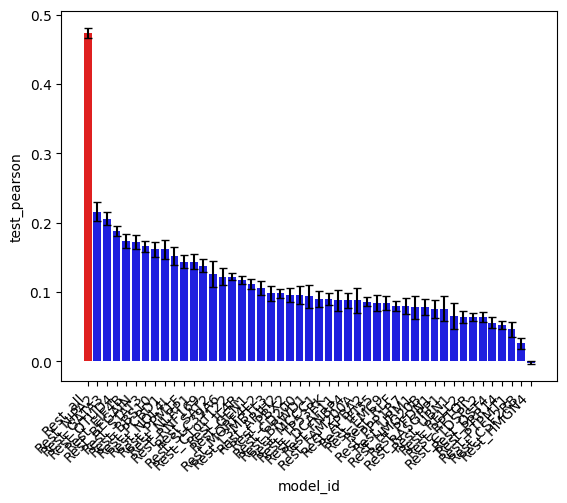

In [425]:
all_evals_df = pd.concat(all_evals)
# Sort data by test_pearson value
sorted_data = all_evals_df.sort_values('test_pearson', ascending=False).reset_index()

# Create barplot
ax = sns.barplot(data=sorted_data, x='model_id', y='test_pearson',
                palette=['red' if x == f'{cond}_all' else 'blue' for x in sorted_data['model_id']])

# Add error bars manually
x_coords = np.arange(len(sorted_data))
plt.errorbar(x=x_coords, y=sorted_data['test_pearson'],
            yerr=sorted_data['test_pearson_se'],
            fmt='none', color='black', capsize=3);

# Rotate x-axis labels
plt.xticks(rotation=45, ha='right');

### Specificity

In [441]:
degs_y

variable
IL5      -1.0
CHDH     -1.0
IFNG      1.0
NEK6     -1.0
RCAN2     1.0
         ... 
LGALS9   -1.0
IL1R1     1.0
FN1       1.0
EMID1    -1.0
IL7R      1.0
Name: zscore, Length: 163, dtype: float64

In [494]:
(state_results_df.adj_p_value >= 0.1).astype(int)

0       0
1       0
2       0
3       0
4       0
       ..
9995    1
9996    1
9997    1
9998    1
9999    1
Name: adj_p_value, Length: 10000, dtype: int64

In [501]:
for f in predicted_regulators:
    print(f)

SEC63
DDRGK1
DNAJB9
UFM1
CARM1
DCAF1
GEN1
GPR171
OST4
CD200
GALNT2
ACLY
SETDB1
SMARCB1
SLC25A37
C1orf122
UBA5
GDAP1
ZNF554
MYO9A
PDIA6
HS1BP3
AKIRIN1
PTPMT1
XBP1
TBPL1
C11orf58
TRMT6
CHD4
OTUD4
ANKRD11
DYRK4
NAB2
TP53RK
ENTR1
XRN1
L3MBTL3
URM1
MTM1
ADAT2
BRWD1
WARS
APBA2
CDKAL1
STAT6
IL4R


In [495]:
def calculate_tpr_fpr(all_results_df, adata_de, st='Th1', r='IL4R', cond='Stim8hr'):
    """Calculate true positive and false positive rates for matching signs between state and perturbation effects.
    
    Args:
        all_results_df: DataFrame with state results
        adata_de: AnnData object with perturbation results
        st: State to analyze (default 'Th1')
        r: Target gene (default 'IL4R') 
        cond: Culture condition (default 'Stim8hr')
        
    Returns:
        DataFrame with tpr and fpr values
    """
    # Get state results
    state_results_df = all_results_df[all_results_df['contrast'] == st].set_index('variable')
    degs_y = (state_results_df.adj_p_value >= 0.1).astype(int)

    # Get perturbation results
    long_pseq_results = get_DE_results_long(adata_de, targets=[r], gene_id_col='gene_name')
    long_pseq_results = long_pseq_results[long_pseq_results.culture_condition == cond].set_index('gene_name')
    degs_x = long_pseq_results['significant'].astype(int)

    # Get common genes and filter
    common_gs = np.intersect1d(degs_x.index, degs_y.index)
    degs_x = degs_x[common_gs]
    degs_y = degs_y[common_gs]

    # Calculate rates
    true_pos = sum((degs_x == degs_y) & (degs_y != 0))
    false_neg = sum((degs_x != degs_y) & (degs_y != 0))
    true_neg = sum((degs_x == degs_y) & (degs_y == 0))
    false_pos = sum((degs_x != degs_y) & (degs_y == 0))
    
    tpr = true_pos / (true_pos + false_neg)
    fpr = false_pos / (false_pos + true_neg)
    precision = true_pos / (true_pos + false_pos)
    
    return pd.DataFrame({'tpr': [tpr], 'fpr': [fpr], 'precision':[precision]})


all_res = []
from tqdm import tqdm
for r in tqdm(predicted_regulators, desc="Calculating TPR/FPR"):
    res = calculate_tpr_fpr(all_results_df, adata_de, st='Th1', r=r, cond='Stim8hr')
    all_res.append(res)


Calculating TPR/FPR: 100%|██████████| 46/46 [00:58<00:00,  1.26s/it]


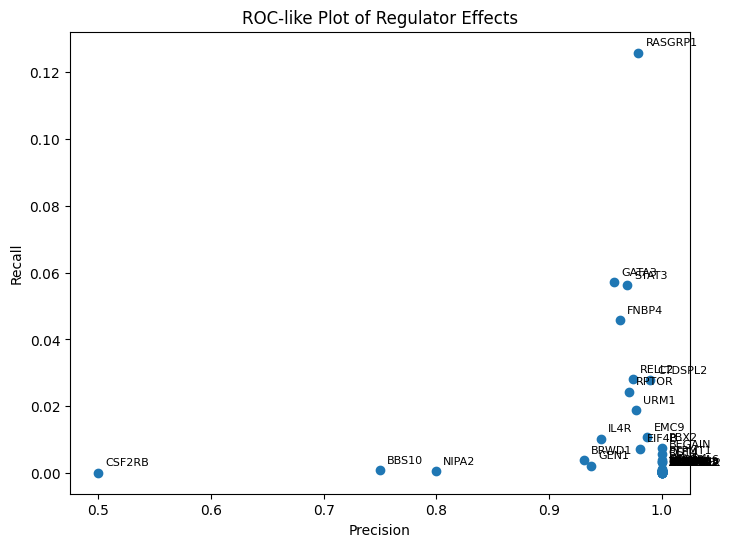

In [496]:
tpr_df = pd.concat(all_res)
tpr_df.index = predicted_regulators
plt.figure(figsize=(8,6))
scatter = plt.scatter(tpr_df['precision'], tpr_df['tpr'])
plt.xlabel('Precision')
plt.ylabel('Recall')
plt.title('ROC-like Plot of Regulator Effects')

# Annotate points with gene names
for gene in tpr_df.index:
    plt.annotate(gene, 
                (tpr_df.loc[gene, 'precision'], tpr_df.loc[gene, 'tpr']),
                xytext=(5, 5), textcoords='offset points',
                fontsize=8)

plt.show()

In [483]:
r = 'STAT3'
long_pseq_results = get_DE_results_long(adata_de, targets=[r], gene_id_col='gene_name')
long_pseq_results = long_pseq_results[long_pseq_results.culture_condition == cond].set_index('gene_name')
long_pseq_results['zscore'] = np.where(~long_pseq_results['significant'], 0, long_pseq_results['zscore'])
degs_x = np.sign(long_pseq_results['zscore'])

In [490]:
degs_y

variable
A4GALT    0.0
AAAS      0.0
AACS      0.0
AAK1      0.0
AAMDC     0.0
         ... 
ZWILCH    0.0
ZWINT     0.0
ZYG11A    0.0
ZYX       0.0
ZZEF1     0.0
Name: zscore, Length: 6985, dtype: float64

In [489]:
long_pseq_results[long_pseq_results['significant']]

,index,gene,log_fc,zscore,adj_p_value,significant,culture_condition,target_contrast,target_contrast_gene_name
gene_name,,,,,,,,,
ABCC1,ENSG00000168610_Stim8hr,ABCC1,0.260542,3.065559,0.049715,True,Stim8hr,ENSG00000168610,STAT3
ABHD2,ENSG00000168610_Stim8hr,ABHD2,0.573612,2.806012,0.080653,True,Stim8hr,ENSG00000168610,STAT3
ABTB2,ENSG00000168610_Stim8hr,ABTB2,1.313869,3.920038,0.005173,True,Stim8hr,ENSG00000168610,STAT3
ACOX1,ENSG00000168610_Stim8hr,ACOX1,0.474854,3.170972,0.040651,True,Stim8hr,ENSG00000168610,STAT3
ACVR1B,ENSG00000168610_Stim8hr,ACVR1B,-2.109128,-3.228161,0.036412,True,Stim8hr,ENSG00000168610,STAT3
...,...,...,...,...,...,...,...,...,...
ZNF282,ENSG00000168610_Stim8hr,ZNF282,-0.482092,-2.947881,0.063021,True,Stim8hr,ENSG00000168610,STAT3
ZNF410,ENSG00000168610_Stim8hr,ZNF410,-0.319559,-3.682154,0.011060,True,Stim8hr,ENSG00000168610,STAT3
ZNF552,ENSG00000168610_Stim8hr,ZNF552,0.556947,3.085184,0.048087,True,Stim8hr,ENSG00000168610,STAT3


variable
IL5      -1.0
CHDH     -1.0
IFNG      1.0
NEK6     -1.0
RCAN2     1.0
         ... 
LGALS9   -1.0
IL1R1     1.0
FN1       1.0
EMID1    -1.0
IL7R      1.0
Name: zscore, Length: 163, dtype: float64

In [393]:
p2t_model.get_prediction(X_perturbs)['pred_mean'].loc['RCAN2']

1.0967519708525324

In [399]:
pred_effect.sort_values()

target_contrast_gene_name
C2CD4D     -0.014864
NOL4L      -0.012751
FAIM       -0.009820
PHTF2      -0.008732
ATL3       -0.008453
              ...   
LAT2        0.011613
NIPA2       0.011886
C1orf122    0.012239
FAM200A     0.013647
MCCC1       0.013741
Name: pred_mean, Length: 3861, dtype: float64

In [404]:
pred_effect.sort_values()

target_contrast_gene_name
CCAR2    -0.018933
ZNF92    -0.017845
VAMP7    -0.017169
GDAP1    -0.016994
LETMD1   -0.016668
            ...   
GATA3     0.021374
WRN       0.022866
NSG1      0.023042
NIPA2     0.023703
SAT2      0.027355
Name: pred_mean, Length: 3861, dtype: float64

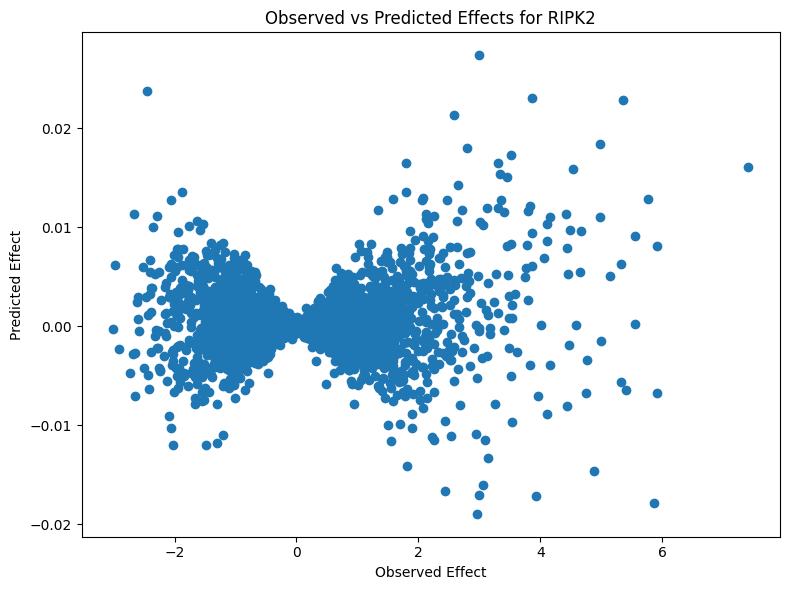

In [402]:
g = 'RIPK2'
pred_effect = p2t_model.get_effect_per_gene(X_perturbs, g)['pred_mean']
obs_effect = X_perturbs.loc[g]

plt.figure(figsize=(8,6))
plt.scatter(obs_effect, pred_effect)
plt.xlabel('Observed Effect')
plt.ylabel('Predicted Effect') 
plt.title(f'Observed vs Predicted Effects for {g}')

plt.tight_layout()
plt.show()

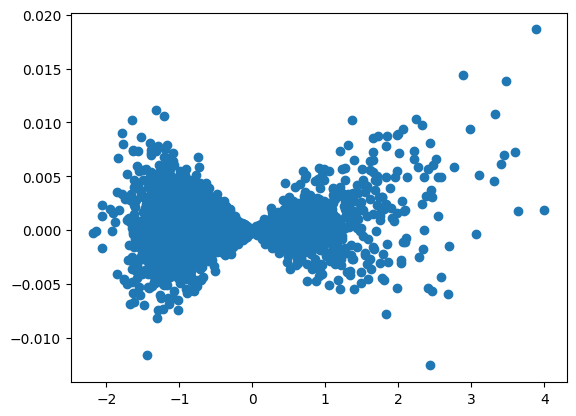

In [357]:
coefs = p2t_model.get_coefs()['coef_mean']
plt.scatter(X_perturbs.loc['RCAN2'], X_perturbs.loc['RCAN2'] * coefs)

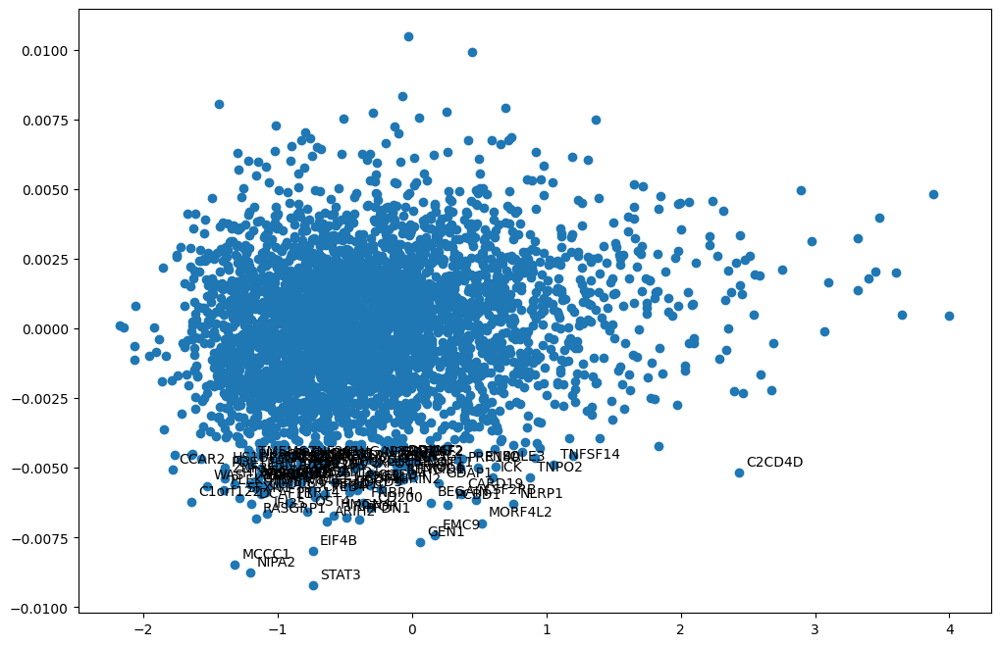

In [341]:
# Get top 5 genes with highest RCAN2 perturbation values
top_genes = p2t_model.get_coefs()['coef_mean'].nsmallest(100)

plt.figure(figsize=(12, 8))
plt.scatter(
    X_perturbs.loc['RCAN2'],
    p2t_model.get_coefs()['coef_mean'])

# Annotate top genes
for gene, value in top_genes.items():
    plt.annotate(
        gene,
        (X_perturbs.loc['RCAN2'][gene], value),
        xytext=(5, 5),
        textcoords='offset points'
    )

In [346]:
pred_df = p2t_model.get_prediction(X_perturbs, subset_regulators=[ 'MCCC1', 'NIPA2', 'STAT3', ''])
pred_df.loc['RCAN2']

pred_mean    0.031200
pred_sem     0.000378
Name: RCAN2, dtype: float64

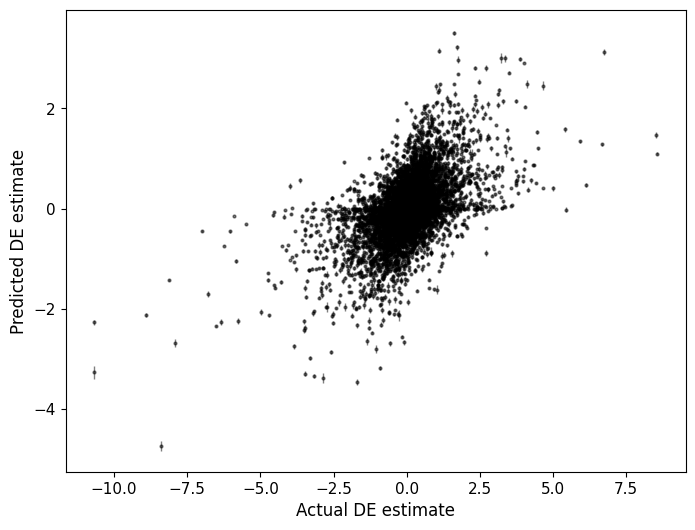

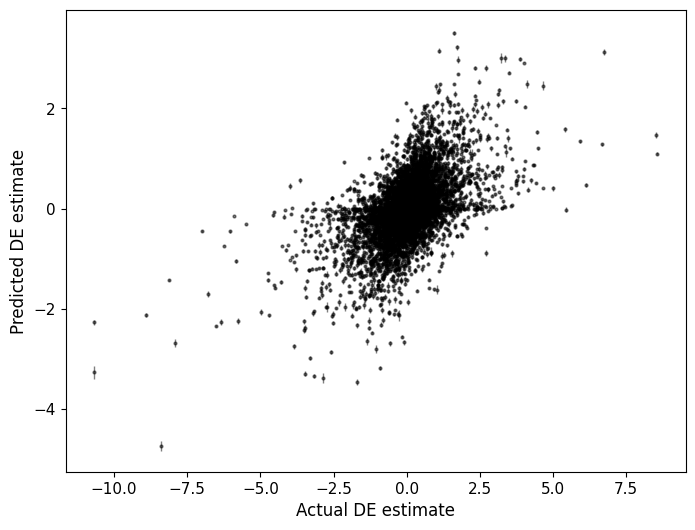

In [351]:
p2t_model.plot_prediction(X_perturbs, y_target)

In [340]:
p2t_model.plot_prediction(X_perturbs)


pred_mean    1.096752
pred_sem     0.033049
Name: RCAN2, dtype: float64

In [293]:
model_coefs = p2t_model.get_coefs()['coef_mean'].values

model_coefs

np.matmul(X_perturbs.loc['RCAN2'], model_coefs)


-1.1357412175172898

In [28]:
# Get the reordered indices after clustering
row_order = g.dendrogram_row.reordered_ind
col_order = g.dendrogram_col.reordered_ind

# Get the original row and column names in clustered order
clustered_row_names = wide_de_results.index[row_order]
clustered_col_names = wide_de_results.columns[col_order]

# Get the linkage matrices for further cluster analysis
row_linkage = g.dendrogram_row.linkage
col_linkage = g.dendrogram_col.linkage

# Optional: Get specific number of clusters using scipy
from scipy.cluster.hierarchy import fcluster

# Example: Get 3 clusters for rows and columns
n_row_clusters = 10
n_col_clusters = 5

row_clusters = fcluster(row_linkage, n_row_clusters, criterion='maxclust')
col_clusters = fcluster(col_linkage, n_col_clusters, criterion='maxclust')

# Create DataFrames with cluster assignments
row_cluster_df = pd.DataFrame({
    'regulator': clustered_row_names,
    'cluster': row_clusters
})

col_cluster_df = pd.DataFrame({
    'gene': clustered_col_names, 
    'cluster': col_clusters
})

print("Row clusters:")
print(row_cluster_df.groupby('cluster')['regulator'].apply(list))
print("\nColumn clusters:")
print(col_cluster_df.groupby('cluster')['gene'].apply(list))

Row clusters:
cluster
1     [RLF, TP53RK, IL4R, STAT3, FNBP4, BEGAIN, RPTO...
2     [SAMD1, SAT2, PPM1F, METTL15, UBN1, OTUD4, EIF...
3                         [ATL3, HMG20B, LETMD1, PFDN1]
4          [RELL2, OXA1L, GATA3, NLRP1, CD200, MORF4L2]
5                                              [TLNRD1]
6                                       [HS1BP3, CPEB4]
7     [ZFP41, MYO1D, FAM200A, ABTB2, APBA2, BRMS1, R...
8                                               [HMGN4]
9        [L3MBTL3, NOL4L, FAM98B, RIOK3, CSF2RB, IFI35]
10    [PPP1R7, PBX2, WARS, PTPMT1, URM1, ADORA2A, BB...
Name: regulator, dtype: object

Column clusters:
cluster
1    [CAMK2D, IL5, SMKR1, FGFBP2, GZMK, PDE4A, DUSP...
2    [SETBP1, HBEGF, TANK, MIOS, SH3RF2, ANKRD18B, ...
3    [KCNN4, TNFRSF1A, RIPK2, GZMH, ANKRD18A, RXRA,...
4    [KBTBD11, CPD, KIAA1217, RCAN2, RGS6, RNASE6, ...
5    [PRSS23, STOM, MAST4, IL18R1, IL18RAP, IRAG2, ...
Name: gene, dtype: object


### Test reconstruction accuracy for different subsets of regulators 

In [191]:

y = y_target
pred_y = p2t_model.get_prediction(X_perturbs[subset_regs])['pred_mean']
slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(y, pred_y)
shrink_adjusted_error = np.abs(pred_y - (y*slope + intercept))
pd.concat[shrink_adjusted_error]

A4GALT    0.001190
AAAS      0.005428
AACS      0.001732
AAK1      0.004338
AAMDC     0.013968
            ...   
ZWILCH    0.008858
ZWINT     0.003676
ZYG11A    0.008459
ZYX       0.020162
ZZEF1     0.000970
Length: 6985, dtype: float64

Cluster 2 regulators: ['SAMD1', 'SAT2', 'PPM1F', 'METTL15', 'UBN1', 'OTUD4', 'EIF4B', 'GEN1', 'ARIH2', 'XYLT2', 'PRR14', 'DCAF11', 'TMBIM6']
Cluster 9 regulators: ['L3MBTL3', 'NOL4L', 'FAM98B', 'RIOK3', 'CSF2RB', 'IFI35']
Cluster 7 regulators: ['ZFP41', 'MYO1D', 'FAM200A', 'ABTB2', 'APBA2', 'BRMS1', 'RASGRP1', 'SFXN1', 'NIPA2']
Cluster 10 regulators: ['PPP1R7', 'PBX2', 'WARS', 'PTPMT1', 'URM1', 'ADORA2A', 'BBS10', 'RTRAF', 'BRWD1', 'NSG1', 'CTDSPL2', 'SLC39A6', 'RNF169', 'ANKRD26', 'EMC9', 'PCBD1', 'CBLB', 'AKIRIN2', 'OST4', 'OTUD7B']
Cluster 1 regulators: ['RLF', 'TP53RK', 'IL4R', 'STAT3', 'FNBP4', 'BEGAIN', 'RPTOR', 'PSMD10', 'HS2ST1', 'C1orf122', 'MAP3K6', 'MCCC1', 'COP1', 'PDCD5']
Cluster 3 regulators: ['ATL3', 'HMG20B', 'LETMD1', 'PFDN1']
Cluster 4 regulators: ['RELL2', 'OXA1L', 'GATA3', 'NLRP1', 'CD200', 'MORF4L2']
Cluster 5 regulators: ['TLNRD1']
Cluster 6 regulators: ['HS1BP3', 'CPEB4']
Cluster 8 regulators: ['HMGN4']


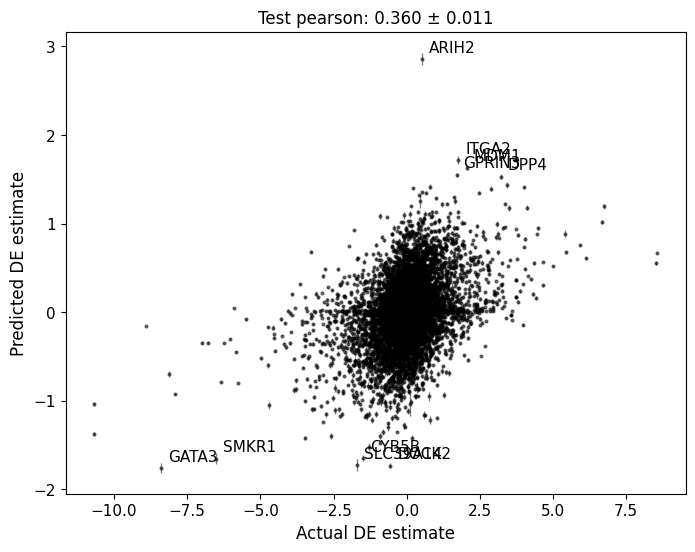

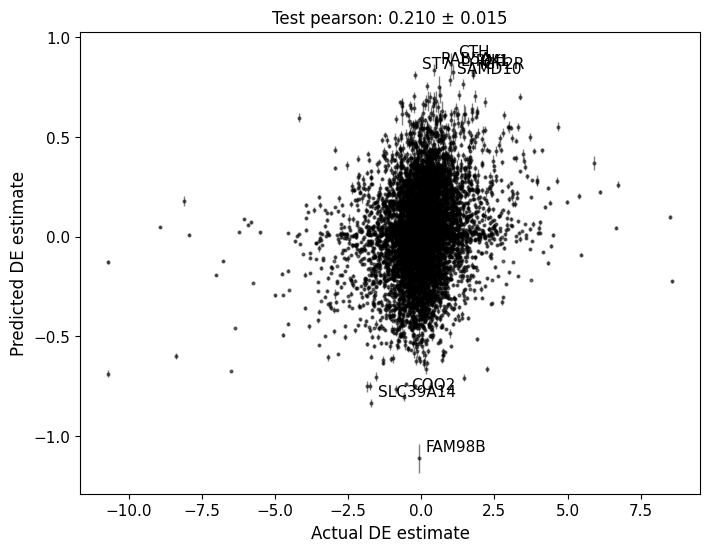

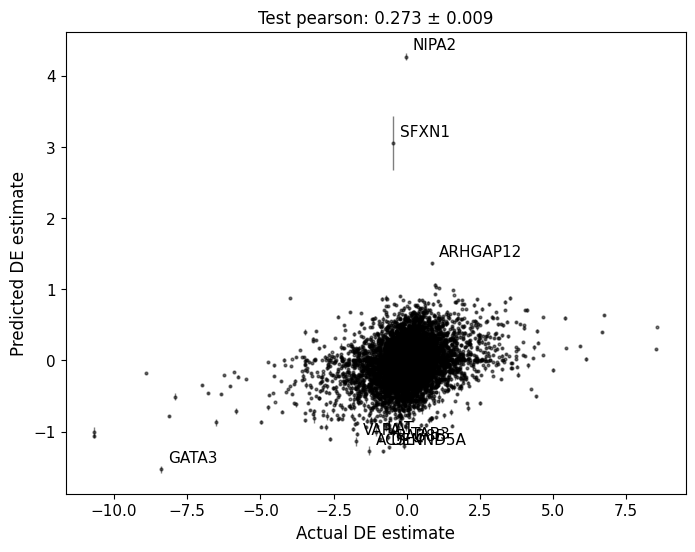

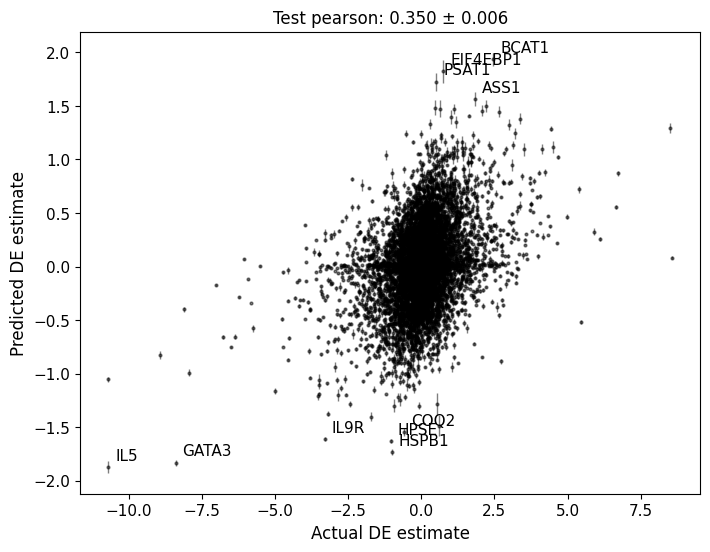

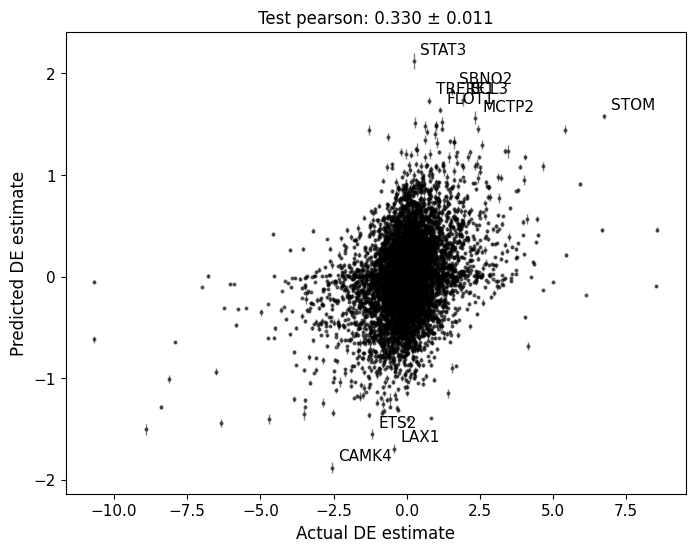

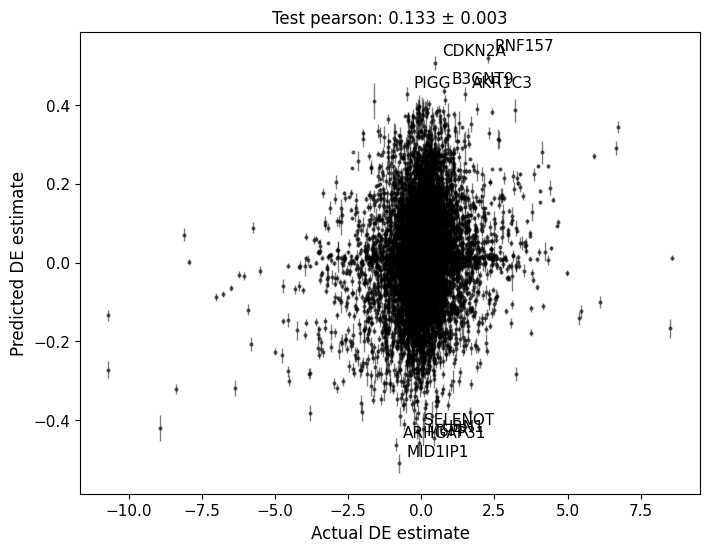

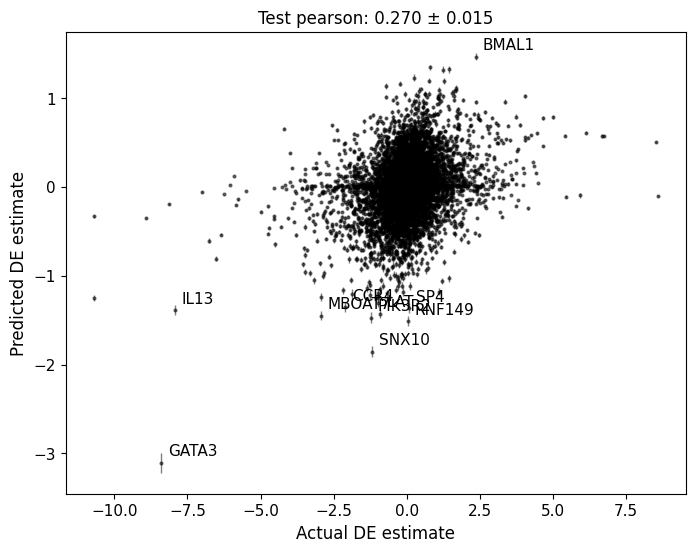

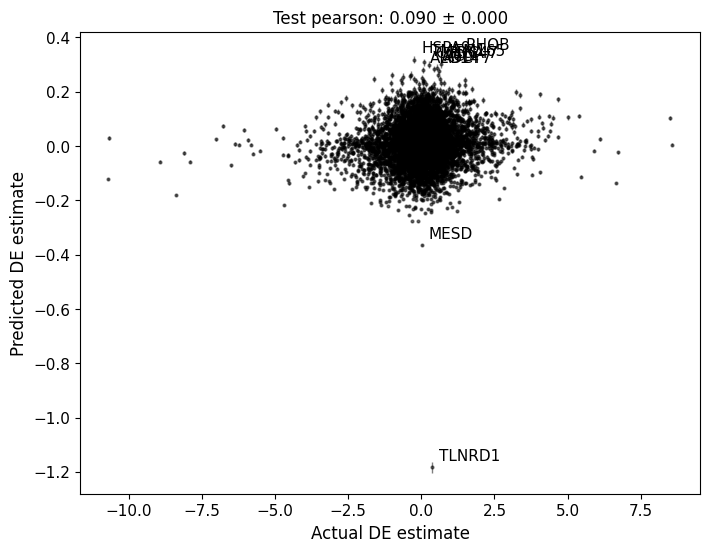

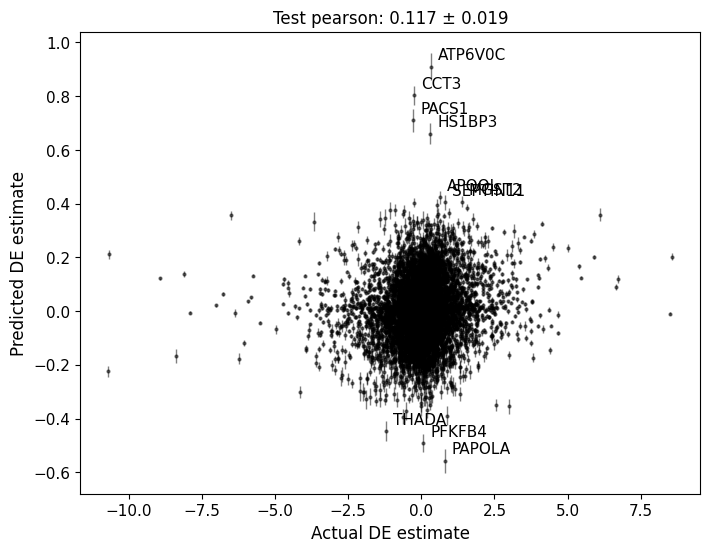

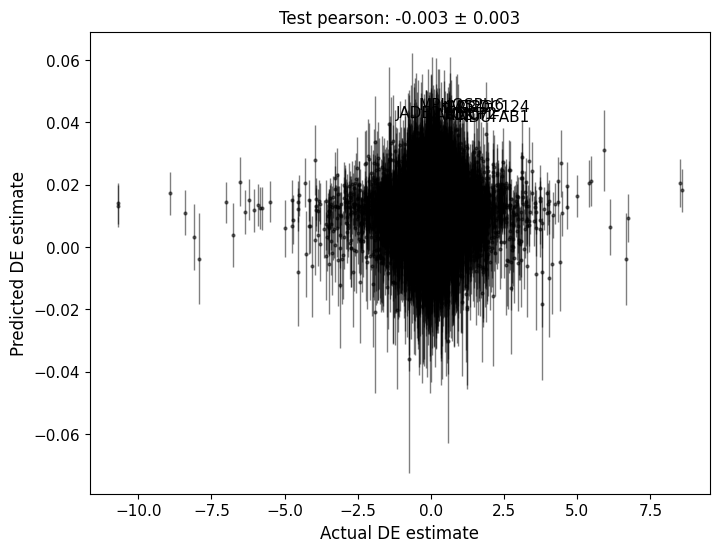

In [193]:
st = 'Th1'
p2t_model, p2t_model_k562, X_perturbs, y_target, common_gs = unpack_state_results(model_results, st).values()

# Initialize a list to store results for each cluster
cluster_results = []

# Iterate through clusters 1 and 2
for cluster_num in row_cluster_df['cluster'].unique():
    subset_regs = row_cluster_df.groupby('cluster')['regulator'].apply(list)[cluster_num]
    print(f"Cluster {cluster_num} regulators:", subset_regs)
    
    # Fit model and get predictions
    p2t_model = Perturb2TissueModel(pca_transform=False, n_pcs=10, n_splits=3, n_repeats=1, positive=False)
    p2t_model.fit(X_perturbs[subset_regs], y_target[X_perturbs.index], model_id=f'subset_cluster_{cluster_num}')
    
    # Plot predictions 
    pl = p2t_model.plot_prediction(X_perturbs[subset_regs], y_target, annotate_top_n=10, plot_metric='pearson')
    
    # Get predictions
    preds = p2t_model.get_prediction(X_perturbs[subset_regs])
    preds['true'] = y_target
    
    # Calculate metrics
    shrink_adjusted_error = p2t_model.get_genelevel_error(X_perturbs[subset_regs], y_target[X_perturbs.index])
    
    # Add cluster number to results
    preds['cluster'] = cluster_num
    preds['shrink_adjusted_error'] = shrink_adjusted_error
    
    # Store results
    cluster_results.append(preds)

# Combine results into a single DataFrame
combined_results = pd.concat(cluster_results)


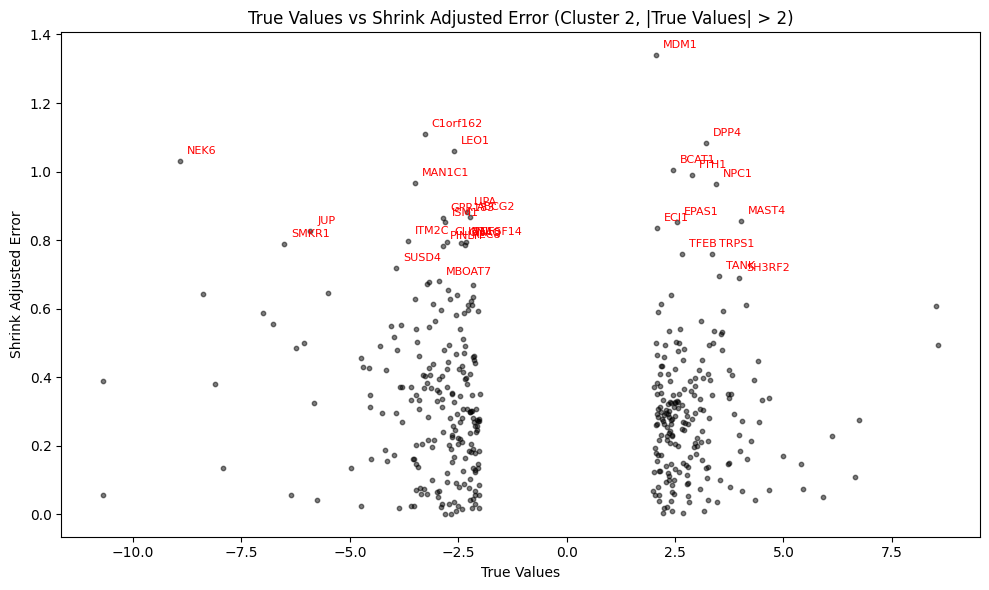

In [178]:
# Plot true values vs shrink adjusted error for cluster 2, annotating genes with highest error
cluster_2_results = combined_results[combined_results['cluster'] == 2]

# Filter to Th signature genes (true zscore > 2)
filtered_cluster_2_results = cluster_2_results[abs(cluster_2_results['true']) > 2]

plt.figure(figsize=(10, 6))
plt.scatter(filtered_cluster_2_results['true'], filtered_cluster_2_results['shrink_adjusted_error'], alpha=0.5, color='black', s=10)
plt.xlabel('True Values')
plt.ylabel('Shrink Adjusted Error')
plt.title('True Values vs Shrink Adjusted Error (Cluster 2, |True Values| > 2)')

# Find and annotate top 10 genes with highest error
top_error_genes = filtered_cluster_2_results.nlargest(30, 'shrink_adjusted_error')
for idx, row in top_error_genes.iterrows():
    plt.annotate(idx, 
                 (row['true'], row['shrink_adjusted_error']), 
                 xytext=(5, 5), 
                 textcoords='offset points', 
                 fontsize=8,
                 color='red')

plt.tight_layout()

Compare predictions from 2 subsets of regulators

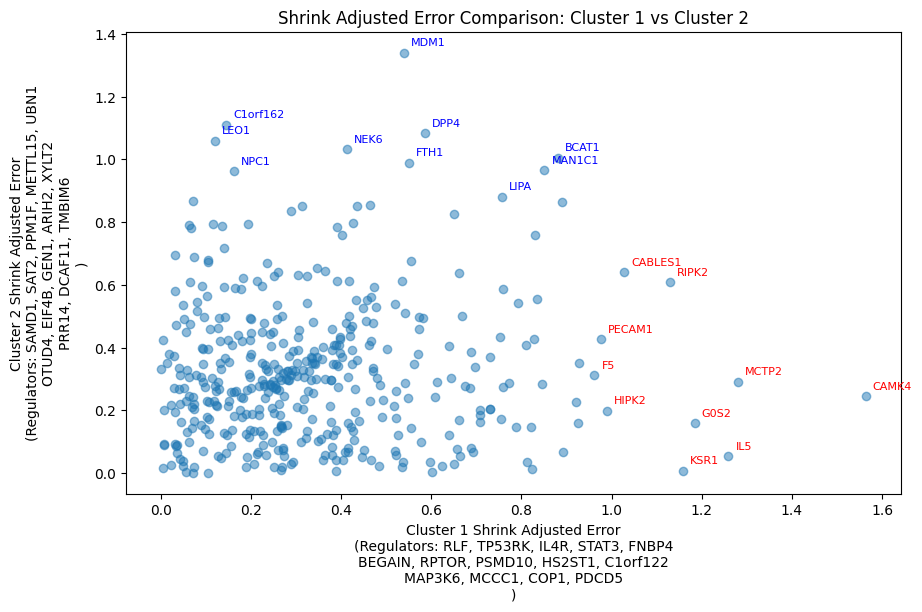

In [189]:

# Get shrink adjusted error for clusters 1 and 2, filtering to Th signature genes
cluster_1_error = combined_results[(combined_results['cluster'] == 1) & (abs(combined_results['true']) > 2)]['shrink_adjusted_error']
cluster_2_error = combined_results[(combined_results['cluster'] == 2) & (abs(combined_results['true']) > 2)]['shrink_adjusted_error']

cl1_regs = row_cluster_df.groupby('cluster')['regulator'].apply(list)[1]
cl2_regs = row_cluster_df.groupby('cluster')['regulator'].apply(list)[2]

# Create a DataFrame to plot
error_comparison = pd.DataFrame({
    'Cluster 1 Error': cluster_1_error,
    'Cluster 2 Error': cluster_2_error
})

# Plot with annotations of top genes
plt.figure(figsize=(10, 6))
plt.scatter(error_comparison['Cluster 1 Error'], error_comparison['Cluster 2 Error'], alpha=0.5)
plt.xlabel(f'Cluster 1 Shrink Adjusted Error\n(Regulators: {", ".join(cl1_regs[:5])}\n{", ".join(cl1_regs[5:10])}\n{", ".join(cl1_regs[10:15])}\n{", ".join(cl1_regs[15:])})')
plt.ylabel(f'Cluster 2 Shrink Adjusted Error\n(Regulators: {", ".join(cl2_regs[:5])}\n{", ".join(cl2_regs[5:10])}\n{", ".join(cl2_regs[10:15])}\n{", ".join(cl2_regs[15:])})')
plt.title('Shrink Adjusted Error Comparison: Cluster 1 vs Cluster 2')

# Find top genes for both clusters
top_cluster_1 = combined_results[(combined_results['cluster'] == 1) & (abs(combined_results['true']) > 2)].nlargest(10, 'shrink_adjusted_error')
top_cluster_2 = combined_results[(combined_results['cluster'] == 2) & (abs(combined_results['true']) > 2)].nlargest(10, 'shrink_adjusted_error')

# Annotate top genes
for idx, row in top_cluster_1.iterrows():
    cluster_1_error_val = row['shrink_adjusted_error']
    cluster_2_error_val = cluster_2_error.loc[idx] if idx in combined_results.index else None
    plt.annotate(idx, 
                     (cluster_1_error_val, cluster_2_error_val), 
                     xytext=(5, 5), 
                     textcoords='offset points', 
                     fontsize=8,
                     color='red')

for idx, row in top_cluster_2.iterrows():
    cluster_2_error_val = row['shrink_adjusted_error']
    cluster_1_error_val = cluster_1_error.loc[idx] if idx in combined_results.index else None
    # if cluster_1_error_val is not None:
    plt.annotate(idx, 
                    (cluster_1_error_val, cluster_2_error_val), 
                    xytext=(5, 5), 
                    textcoords='offset points', 
                    fontsize=8,
                    color='blue')

# plt.tight_layout()


---

In [170]:
st = 'Treg'
p2t_model, p2t_model_k562, X_perturbs, y_target, common_gs = unpack_state_results(model_results, st).values()
    


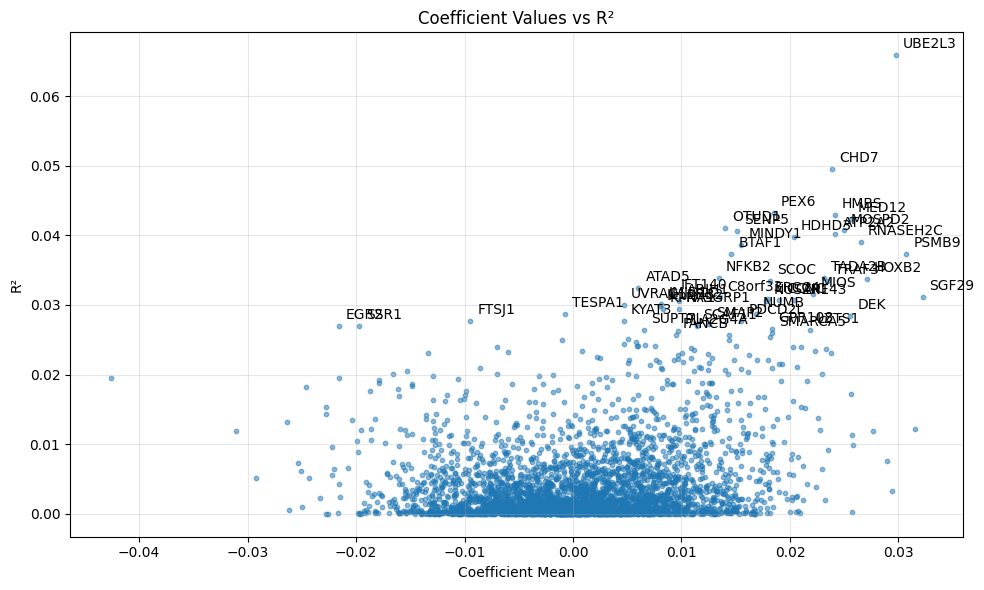

In [171]:
coefs_df = p2t_model.get_coefs()
r2_df = p2t_model.get_r2(X_perturbs, y_target)
pt_coefs = pd.concat([coefs_df, r2_df], axis=1).astype('float')
# Create scatter plot of coefficients vs r2
plt.figure(figsize=(10, 6))
plt.scatter(pt_coefs['coef_mean'], pt_coefs['r2'], alpha=0.5, s=10)

# Get top 10 genes by absolute coefficient value
top_coefs = pt_coefs['r2'].nlargest(50).index

# Add annotations for top coefficient genes
for gene in top_coefs:
    plt.annotate(gene, 
                (pt_coefs.loc[gene, 'coef_mean'], pt_coefs.loc[gene, 'r2']),
                xytext=(5, 5), textcoords='offset points')

plt.xlabel('Coefficient Mean')
plt.ylabel('R²')
plt.title('Coefficient Values vs R²')
plt.grid(True, alpha=0.3)
plt.tight_layout()


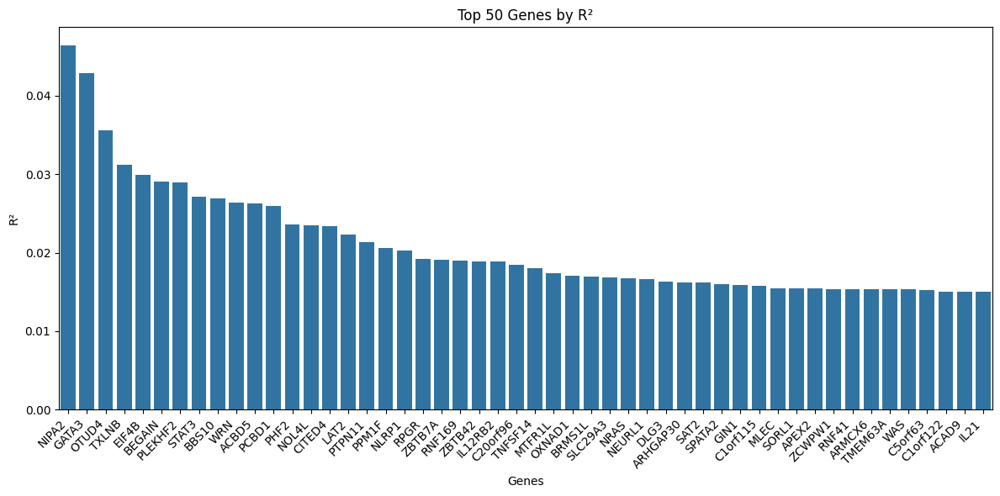

In [150]:
plt.figure(figsize=(12, 6))
sns.barplot(x=r2_top.index.tolist(), y=r2_top['r2'])
plt.xticks(rotation=45, ha='right')
plt.xlabel('Genes')
plt.ylabel('R²')
plt.title('Top 50 Genes by R²')
plt.tight_layout()

In [132]:

g = 'GATA3'
st = 'Th1'

p2t_model, p2t_model_k562, X_perturbs, y_target, common_gs = unpack_state_results(model_results, st).values()
pt_coefs = p2t_model.get_coefs()

# Initialize empty dataframe to store r2 values
r2_df = pd.DataFrame(index=X_perturbs.columns, columns=['r2'])

# Calculate r2 for each column
for col in X_perturbs.columns:
    # Get perturbation effects for this gene
    X_g = X_perturbs[col]
    # Mask self-perturbation and fill with mean
    X_g = X_g.mask(X_g.index == col).fillna(X_g.mean())
    # Calculate predictions using coefficients
    pred_from_g = X_g * pt_coefs['coef_mean'].loc[col]
    # Calculate correlation and r2
    corr, _ = scipy.stats.pearsonr(pred_from_g, y_target)
    r2_df.loc[col, 'r2'] = corr**2

# Sort by r2 values
r2_df = r2_df.sort_values('r2', ascending=False)
r2_df

,r2
target_contrast_gene_name,
NIPA2,0.046418
GATA3,0.042888
OTUD4,0.035552
TXLNB,0.031241
EIF4B,0.029963
...,...
GDF9,0.0
AHCYL1,0.0
CNOT6L,0.0


<Axes: xlabel='coef_mean', ylabel='r2'>

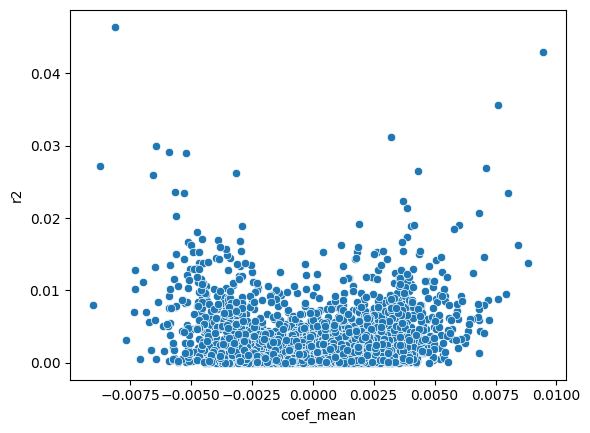

In [ ]:
pt_coefs['r2'] = r2_df['r2']
sns.scatterplot(data=pt_coefs, x='coef_mean', y='r2')

In [139]:
pt_coefs.sort_values('r2', ascending=False)[0:40]

,coef_mean,coef_sem,r2
NIPA2,-0.008121,0.000211,0.046418
GATA3,0.009467,0.000254,0.042888
OTUD4,0.007609,0.000096,0.035552
TXLNB,0.003214,0.000244,0.031241
EIF4B,-0.006426,0.000105,0.029963
BEGAIN,-0.005919,0.000239,0.029107
PLEKHF2,-0.005194,0.000255,0.028973
STAT3,-0.008712,0.000355,0.027131
BBS10,0.007118,0.000190,0.026897
WRN,0.004310,0.000237,0.026432


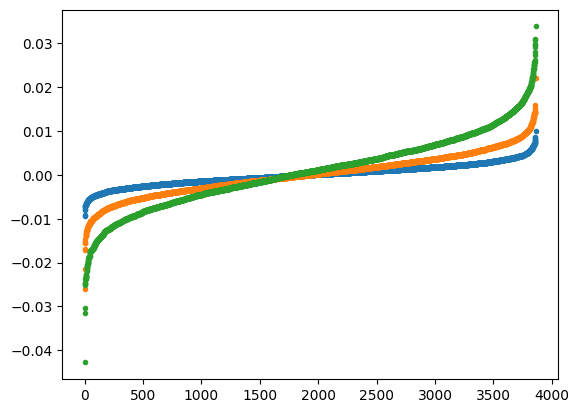

In [408]:
plt.plot(coefs_wide['Th1'].sort_values().values, '.')
plt.plot(coefs_wide['Th2'].sort_values().values, '.')
plt.plot(coefs_wide['Treg'].sort_values().values, '.')

In [251]:
# Normalize each row to sum to 1
coefs_wide_norm = coefs_wide.apply(lambda x: x - x.min(), axis=1)
# Get top 20 absolute values for each column and save in a list
top_genes_list = []
for col in coefs_wide_norm.columns:
    # Get absolute values and sort
    abs_values = coefs_wide_norm[col].abs().sort_values(ascending=False)
    # Get top 20 gene names and values
    top_20 = [gene for gene in abs_values.head(50).index]
    top_genes_list.extend(top_20)

top_genes_list = list(set(top_genes_list))


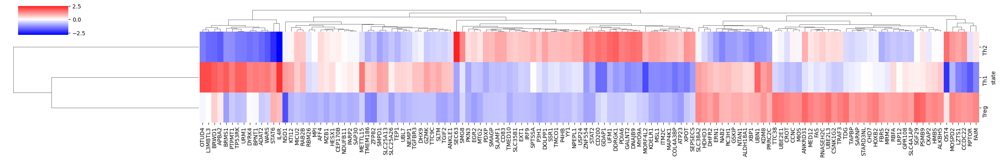

In [259]:
sns.clustermap(coefs_wide.loc[top_genes_list].T, center=0, cmap='bwr', figsize=(25,4), xticklabels=True, z_score=False)

Text(0.5, 1.0, 'Effect of Low Regulators on Most Affected Genes')

<Figure size 1500x2000 with 0 Axes>

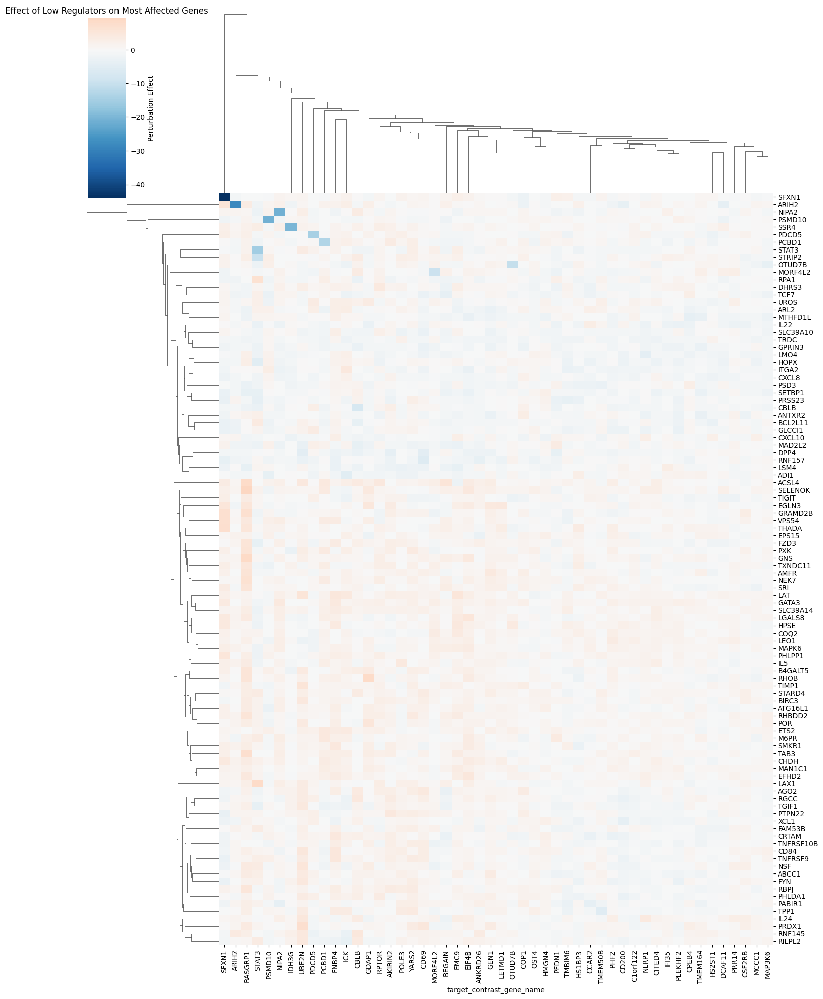

In [38]:
low_regs = coefs_wide['Th1'].sort_values()[0:50].index.tolist()
# Get the perturbation effects for low_regs
perturb_effects = X_perturbs[low_regs]

# Get the 200 genes most affected by these perturbations
# Calculate mean absolute effect across perturbations
mean_effects = perturb_effects.abs().mean(axis=1)
top_affected_genes = mean_effects.nlargest(100).index

# Create clustered heatmap
plt.figure(figsize=(15, 20))
sns.clustermap(perturb_effects.loc[top_affected_genes], 
               center=0,
               cmap='RdBu_r',
               xticklabels=True,
               yticklabels=True,
               figsize=(15, 20),
               cbar_kws={'label': 'Perturbation Effect'})
plt.title('Effect of Low Regulators on Most Affected Genes')

In [759]:
st='Th1'
p2t_model, p2t_model_k562, X_perturbs, y_target, common_gs = unpack_state_results(model_results, st).values()
mod_ix = 
comps = pd.DataFrame(p2t_model.pcas[mod_ix].components_, columns=X_perturbs.columns)
top = p2t_model.models[mod_ix].coef_.argmax()
# plt.plot(top, '.')
comps.iloc[top,:].sort_values()

target_contrast_gene_name
GIN1      -0.059474
HELZ      -0.058324
DNTTIP1   -0.055660
CCDC6     -0.055113
AP3M1     -0.053719
             ...   
PHF12      0.049750
SMARCB1    0.050056
ZBTB48     0.050656
SIN3B      0.054089
NSD1       0.091510
Name: 29, Length: 3861, dtype: float64

In [ ]:
st = 'Treg'
p2t_model, p2t_model_k562, X_perturbs, y_target, common_gs = unpack_state_results(model_results, st).values()

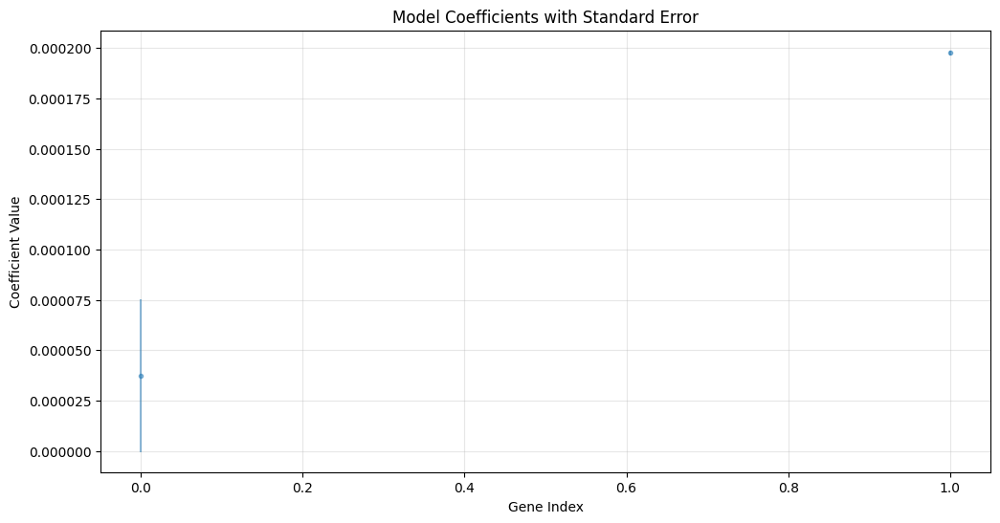

,coef_mean,coef_sem
coef_mean,0.000037,0.000038
coef_sem,0.000198,0.000001


In [761]:
coefs = p2t_model.get_coefs()
coefs_mean = coefs.mean(axis=0)
coefs_sem = coefs.sem(axis=0)

# Create DataFrame with mean and SEM
coefs_df = pd.DataFrame({
    'coef_mean': coefs_mean,
    'coef_sem': coefs_sem
})

# Plot mean coefficients with error bars
plt.figure(figsize=(12, 6))
plt.errorbar(range(len(coefs_mean)), coefs_mean, yerr=coefs_sem, fmt='.', alpha=0.5)
plt.title('Model Coefficients with Standard Error')
plt.xlabel('Gene Index')
plt.ylabel('Coefficient Value')
plt.grid(True, alpha=0.3)
plt.show()

coefs_df

In [452]:
import decoupler as dc

In [594]:
msigdb_table = decoupler.op.resource('MSigDB')

In [645]:
msigdb_table.collection.value_counts()

collection
immunesigdb                           1211234
go_biological_process                 1028339
human_phenotype_ontology               643992
chemical_and_genetic_perturbations     520915
mirna_targets_mirdb                    468097
tf_targets_gtrf                        278854
reactome_pathways                      207025
tf_targets_legacy                      199207
cell_type_signatures                   193040
go_cellular_component                  177903
go_molecular_function                  176652
cancer_modules                          68839
wikipathways                            59269
vaccine_response                        58531
cancer_gene_neighborhoods               57559
mirna_targets_legacy                    44535
oncogenic_signatures                    39253
kegg_pathways                           27028
positional                              24437
pid_pathways                            16547
hallmark                                11319
biocarta_pathways      

In [669]:
ctsig_table = msigdb_table[msigdb_table.collection == 'kegg_pathways']
immunesig_db_table = msigdb_table[msigdb_table['collection'] == 'immunesigdb']

In [681]:
[x for x in ctsig_table.geneset if 'T_CELL' in x]

['KEGG_T_CELL_RECEPTOR_SIGNALING_PATHWAY',
 'KEGG_T_CELL_RECEPTOR_SIGNALING_PATHWAY',
 'KEGG_T_CELL_RECEPTOR_SIGNALING_PATHWAY',
 'KEGG_T_CELL_RECEPTOR_SIGNALING_PATHWAY',
 'KEGG_T_CELL_RECEPTOR_SIGNALING_PATHWAY',
 'KEGG_T_CELL_RECEPTOR_SIGNALING_PATHWAY',
 'KEGG_T_CELL_RECEPTOR_SIGNALING_PATHWAY',
 'KEGG_T_CELL_RECEPTOR_SIGNALING_PATHWAY',
 'KEGG_T_CELL_RECEPTOR_SIGNALING_PATHWAY',
 'KEGG_T_CELL_RECEPTOR_SIGNALING_PATHWAY',
 'KEGG_T_CELL_RECEPTOR_SIGNALING_PATHWAY',
 'KEGG_T_CELL_RECEPTOR_SIGNALING_PATHWAY',
 'KEGG_T_CELL_RECEPTOR_SIGNALING_PATHWAY',
 'KEGG_T_CELL_RECEPTOR_SIGNALING_PATHWAY',
 'KEGG_T_CELL_RECEPTOR_SIGNALING_PATHWAY',
 'KEGG_T_CELL_RECEPTOR_SIGNALING_PATHWAY',
 'KEGG_T_CELL_RECEPTOR_SIGNALING_PATHWAY',
 'KEGG_T_CELL_RECEPTOR_SIGNALING_PATHWAY',
 'KEGG_T_CELL_RECEPTOR_SIGNALING_PATHWAY',
 'KEGG_T_CELL_RECEPTOR_SIGNALING_PATHWAY',
 'KEGG_T_CELL_RECEPTOR_SIGNALING_PATHWAY',
 'KEGG_T_CELL_RECEPTOR_SIGNALING_PATHWAY',
 'KEGG_T_CELL_RECEPTOR_SIGNALING_PATHWAY',
 'KEGG_T_CE

In [670]:
net = ctsig_table.rename({'geneset':'source', 'genesymbol':'target'}, axis=1)
net = net.drop_duplicates(subset=['source', 'target'])

In [671]:
input_df = coefs_wide[['Th1']].T
input_df.index.name = None

In [695]:
scores  = decoupler.mt.decouple(coefs_wide[['Th2']].T.abs(), net=net)


AttributeError: 'NoneType' object has no attribute '__name__'

In [689]:
scores.T

,Th2
KEGG_ACUTE_MYELOID_LEUKEMIA,1.319735
KEGG_ADHERENS_JUNCTION,1.030324
KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY,1.289013
KEGG_ALANINE_ASPARTATE_AND_GLUTAMATE_METABOLISM,1.138446
KEGG_ALDOSTERONE_REGULATED_SODIUM_REABSORPTION,0.780028
...,...
KEGG_VASOPRESSIN_REGULATED_WATER_REABSORPTION,0.702157
KEGG_VEGF_SIGNALING_PATHWAY,1.202326
KEGG_VIBRIO_CHOLERAE_INFECTION,1.225944
KEGG_VIRAL_MYOCARDITIS,0.920714


In [691]:
pvals.T.sort_values('Th2')

,Th2
KEGG_JAK_STAT_SIGNALING_PATHWAY,0.308000
KEGG_CHRONIC_MYELOID_LEUKEMIA,0.435803
KEGG_CYSTEINE_AND_METHIONINE_METABOLISM,0.435803
KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,0.435803
KEGG_DNA_REPLICATION,0.435803
...,...
KEGG_BIOSYNTHESIS_OF_UNSATURATED_FATTY_ACIDS,0.994032
KEGG_FRUCTOSE_AND_MANNOSE_METABOLISM,0.994032
KEGG_REGULATION_OF_ACTIN_CYTOSKELETON,0.994032
KEGG_CELL_ADHESION_MOLECULES_CAMS,0.994032


(None,
 array(['IL4R', 'STAT6', 'STAT2', 'CSF2RB', 'CREBBP', 'EP300', 'AKT3',
        'STAT1', 'STAT3', 'CBLB', 'IL10RA', 'IFNGR2', 'AKT1', 'PTPN11',
        'IRF9', 'STAT5A', 'IFNAR1', 'IL4', 'PIK3CB', 'GRB2', 'CCND2',
        'PIK3CA', 'IL12RB2', 'AKT2', 'PIK3CG'], dtype='<U10'))

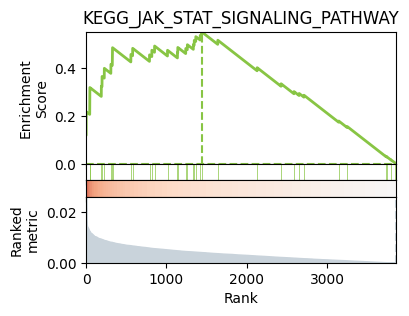

In [693]:
decoupler.pl.leading_edge(coefs_wide.abs(), net=net, stat='Th2', name='KEGG_JAK_STAT_SIGNALING_PATHWAY')

In [562]:
tf_acts

,Androgen,EGFR,Estrogen,Hypoxia,JAK-STAT,MAPK,NFkB,PI3K,TGFb,TNFa,Trail,VEGF,WNT,p53
Treg,0.858993,1.032567,0.904279,1.045801,1.044117,1.086472,1.102279,0.977776,0.872948,1.08322,-1.208076,1.095913,-0.798849,0.963823


array([[<Axes: title={'center': 'Treg'}>]], dtype=object)

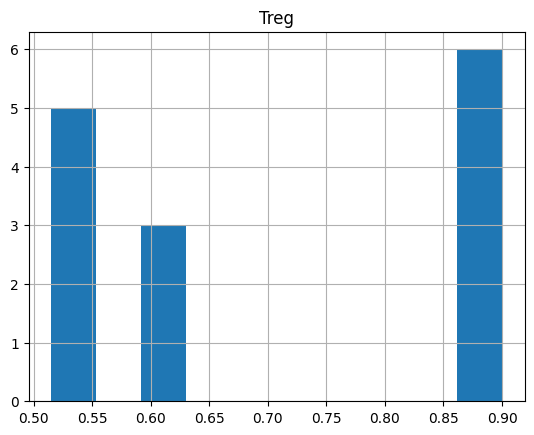

In [561]:
tf_padj.T.hist()

## Check single-cell states 

In [8]:
import glob
stim_sc_files = glob.glob(f'{datadir}/**/*Stim8hr*postQC.h5ad', recursive=True)
# Pick some lanes
stim_sc_files = stim_sc_files[0:10]

In [ ]:
import h5py
import anndata as ad
from tqdm import tqdm

adatas = []
all_highly_variable_genes = []
for f in tqdm(stim_sc_files):
    adata = ad.experimental.read_lazy(f)
    adata_ntc = adata[adata.obs['perturbed_gene_name'] == 'NTC'].copy()

    X_dask = adata_ntc.X
    X_dask = X_dask.map_blocks(lambda x: x.toarray(), dtype=X_dask.dtype, meta=np.array([]))
    col_sums = X_dask.sum(axis=0).compute()  # Compute sum along rows (axis=1)
    gene_mask = col_sums > 2

    adata_ntc = adata_ntc[:, gene_mask].copy()
    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata, n_top_genes=2000)
    
    highly_variable_genes = set(adata.var_names[adata.var["highly_variable"]])
    all_highly_variable_genes.append(highly_variable_genes)
    adatas.append(adata)

In [45]:
from collections import Counter

## select the genes appears more than two lanes
gene_counts = Counter(gene for genes in all_highly_variable_genes for gene in genes)
selected_genes = {gene for gene, count in gene_counts.items() if count > 2}
print( len(selected_genes) )

for i,a in enumerate(adatas):
    common_genes = list(set(a.var_names) & selected_genes)
    a = a[:, common_genes].copy()
    a.obs = a.obs.to_dataframe()
    a.var = a.var.to_dataframe()
    output_path = f'{datadir}/tmp/Stim8hr_NTCs_preprocessed_s{i}.h5ad'
    a.write_h5ad(output_path)

1774


In [47]:
%%time
data_dict = {}
for i,_ in enumerate(adatas):
    data_dict.update({i:f'{datadir}/tmp/Stim8hr_NTCs_preprocessed_s{i}.h5ad'})

ad.experimental.concat_on_disk(
    data_dict,
    f'{datadir}/tmp/Stim8hr_NTCs_merged.h5ad',
    label='sample_id',
)

CPU times: user 3.22 s, sys: 2.65 s, total: 5.87 s
Wall time: 12.7 s


In [61]:
adata = sc.read_h5ad(f'{datadir}/tmp/Stim8hr_NTCs_merged.h5ad', backed=False)

In [63]:
sc.pp.pca(adata, n_comps=50)

In [86]:
adata.var = a.var[['gene_ids', 'gene_name']].loc[adata.var_names].copy()

In [87]:
adata.var_names = adata.var['gene_name'].values

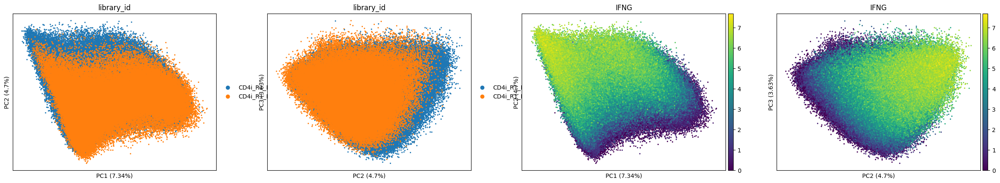

In [92]:
sc.pl.pca(adata, annotate_var_explained=True, color=['library_id', 'IFNG'], size=20, components=['1,2', '2,3'])

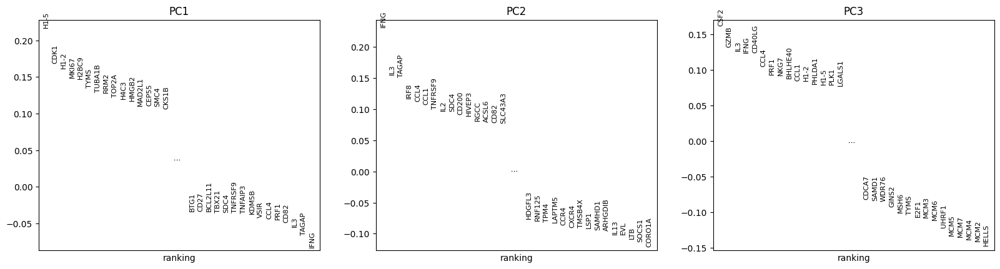

In [90]:
sc.pl.pca_loadings(adata)

In [327]:
target_hits = get_DE_results_long(adata_de, targets=['GATA3'])
target_hits = target_hits[target_hits['culture_condition'] == cond]
signif_genes = target_hits[target_hits['significant']]
signif_genes['class'] = np.where(np.sign(target_hits[target_hits['significant']].zscore) < 0, 'neg', 'pos')
signif_gene_classes = signif_genes.groupby('class')['gene'].apply(list).to_dict()
signif_gene_classes

/tmp/ipykernel_2698264/4045715312.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  signif_genes['class'] = np.where(np.sign(target_hits[target_hits['significant']].zscore) < 0, 'neg', 'pos')


{'neg': ['ADAM19',
  'ANXA4',
  'ATP8B2',
  'CD44',
  'CLINT1',
  'CYLD',
  'EEIG1',
  'EML4',
  'ERN1',
  'GIMAP4',
  'GLUL',
  'ICAM2',
  'IFITM2',
  'IKZF1',
  'IL10RA',
  'IL32',
  'KLF2',
  'MORC2',
  'MYD88',
  'NME2',
  'NSA2',
  'PXN',
  'RASA3',
  'S100A10',
  'S100A11',
  'SAMD3',
  'SLFN5',
  'SOS1',
  'TNFSF10'],
 'pos': ['ADA',
  'CD3G',
  'CD7',
  'CD74',
  'CYFIP2',
  'FTH1',
  'GRK2',
  'HMGN1',
  'LBR',
  'MAL',
  'MAP4K4',
  'NHERF1',
  'RABL6',
  'SEPTIN6',
  'SNRPC',
  'STAU2',
  'YBX1']}

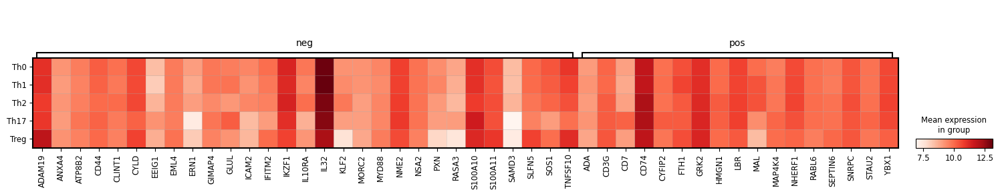

In [331]:
sc.pl.matrixplot(pbulk_adata[pbulk_adata.obs.culture_condition != 'Day0'], signif_gene_classes, groupby='culture_condition', cmap='Reds')

In [137]:
# Store evaluation results for different numbers of PCs
pc_eval_results = []

from tqdm.notebook import tqdm
for d in tqdm(np.linspace(10,100, 10), desc="Testing different PC counts"):
    p2t_model = Perturb2TissueModel(pca_transform=True, n_pcs=int(d), n_splits=3, n_repeats=3)
    p2t_model.fit(X_perturbs, y_target, model_id=f'Stim8hr_PC{int(d)}', frac_top_hvgs=0.50)
    
    # Get evaluation summary
    eval_summary = p2t_model.summarize_eval()
    eval_summary['n_pcs'] = int(d)
    
    # Store results
    pc_eval_results.append(eval_summary)


Testing different PC counts:   0%|          | 0/10 [00:00<?, ?it/s]

Training on 3170/6341 genes
Training on 3170/6341 genes
Training on 3170/6341 genes
Training on 3170/6341 genes
Training on 3170/6341 genes
Training on 3170/6341 genes
Training on 3170/6341 genes
Training on 3170/6341 genes
Training on 3170/6341 genes
Training on 3170/6341 genes


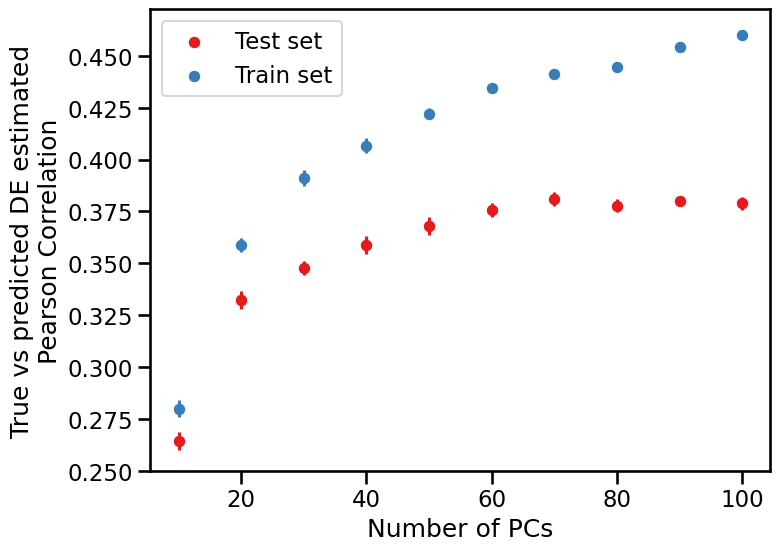

In [143]:
sns.set_context('talk')
# Combine all results into a single DataFrame
pc_eval_df = pd.concat(pc_eval_results)
# Create a figure with error bars showing standard error
fig, ax = plt.subplots(figsize=(8, 6))

# Use Set1 color palette
palette = sns.color_palette("Set1")

# Test pearson with matching color for points and error bars
sns.scatterplot(data=pc_eval_df, x='n_pcs', y='test_pearson', label='Test set', ax=ax, color=palette[0])
ax.errorbar(pc_eval_df['n_pcs'], pc_eval_df['test_pearson'], 
            yerr=pc_eval_df['test_pearson_se'], fmt='none', alpha=1, color=palette[0])

# Train pearson with matching color for points and error bars
sns.scatterplot(data=pc_eval_df, x='n_pcs', y='train_pearson', label='Train set', ax=ax, color=palette[1])
ax.errorbar(pc_eval_df['n_pcs'], pc_eval_df['train_pearson'], 
            yerr=pc_eval_df['train_pearson_se'], fmt='none', alpha=1, color=palette[1])

plt.xlabel('Number of PCs')
plt.ylabel('True vs predicted DE estimated\nPearson Correlation')
plt.legend()

### Simple correlation

Text(0.5, 1.0, 'Correlation: r = -0.164, p = 6.429e-43')

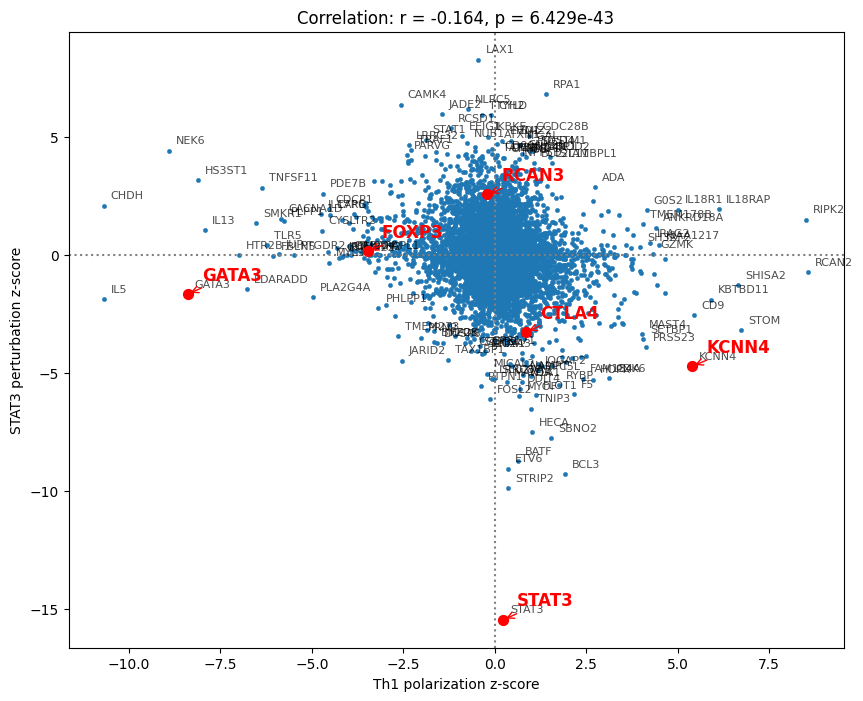

In [283]:
pseq_target = 'STAT3'
pol_condition = 'Th1'

perturbseq_results = get_DE_results_long(adata_de, targets=[pseq_target], effect_estimates=['zscore'])
perturbseq_results = perturbseq_results.set_index('gene_name')[['zscore', 'culture_condition']]
perturbseq_results = perturbseq_results[perturbseq_results['culture_condition'] == 'Stim8hr' ].copy()

polarization_results = all_results_df[all_results_df['contrast'] == pol_condition].set_index('variable')
polarization_results = polarization_results.rename({'zscore': 'zscore_polarization'}, axis=1)
compare_df = pd.concat([perturbseq_results, polarization_results], axis=1).dropna()

# Calculate correlation coefficient and p-value
from scipy import stats
corr, p_value = stats.pearsonr(compare_df['zscore_polarization'], compare_df['zscore'])

# Create scatter plot with correlation and p-value in title
fig, ax = plt.subplots(figsize=(10, 8))
sns.scatterplot(data=compare_df, x='zscore_polarization', y='zscore', s=10, edgecolor=None, ax=ax)

# Add quadrant lines
plt.axhline(y=0, linestyle='dotted', color='gray')
plt.axvline(x=0, linestyle='dotted', color='gray')

# Annotate top genes in each quadrant
# Get top 5 genes by absolute distance from origin in each quadrant
for quadrant in ['top_right', 'top_left', 'bottom_right', 'bottom_left']:
    if quadrant == 'top_right':
        mask = (compare_df['zscore_polarization'] > 0) & (compare_df['zscore'] > 0)
    elif quadrant == 'top_left':
        mask = (compare_df['zscore_polarization'] < 0) & (compare_df['zscore'] > 0)
    elif quadrant == 'bottom_right':
        mask = (compare_df['zscore_polarization'] > 0) & (compare_df['zscore'] < 0)
    else:  # bottom_left
        mask = (compare_df['zscore_polarization'] < 0) & (compare_df['zscore'] < 0)
    
    quadrant_df = compare_df[mask].copy()
    if len(quadrant_df) > 0:
        # Calculate distance from origin
        quadrant_df['distance'] = np.sqrt(quadrant_df['zscore_polarization']**2 + quadrant_df['zscore']**2)
        # Get top 5 genes
        top_genes = quadrant_df.nlargest(30, 'distance')
        
        # Annotate points
        for idx, row in top_genes.iterrows():
            ax.annotate(idx, 
                       (row['zscore_polarization'], row['zscore']),
                       xytext=(5, 5), textcoords='offset points',
                       fontsize=8, alpha=0.7)

# Highlight and annotate CTLA4 and FOXP3
highlight_genes = ['CTLA4', 'FOXP3', 'KCNN4', 'RCAN3', 'STAT3', 'GATA3']
for gene in highlight_genes:
    if gene in compare_df.index:
        row = compare_df.loc[gene]
        # Plot highlighted point
        ax.scatter(row['zscore_polarization'], row['zscore'], 
                  color='red', s=50, zorder=3)
        # Add annotation with arrow
        ax.annotate(gene,
                   (row['zscore_polarization'], row['zscore']),
                   xytext=(10, 10), textcoords='offset points',
                   fontsize=12, fontweight='bold',
                   color='red',
                   arrowprops=dict(arrowstyle='->', color='red'))

plt.xlabel(f'{pol_condition} polarization z-score')
plt.ylabel(f'{pseq_target} perturbation z-score')
plt.title(f'Correlation: r = {corr:.3f}, p = {p_value:.3e}')

In [236]:
pseq_target = 'GATA3'
perturbseq_results = get_DE_results_long(adata_de, targets=[pseq_target], effect_estimates=['zscore', 'log_fc'])
perturbseq_results[ perturbseq_results['significant'] ]

,index,gene,zscore,log_fc,adj_p_value,significant,gene_name,culture_condition,target_contrast,target_contrast_gene_name
45,ENSG00000107485_Rest,ABHD3,3.134213,0.280295,0.052651,True,ABHD3,Rest,ENSG00000107485,GATA3
58,ENSG00000107485_Rest,ABRACL,-2.918213,-0.187295,0.079782,True,ABRACL,Rest,ENSG00000107485,GATA3
102,ENSG00000107485_Rest,ACOX3,3.547358,0.750618,0.019155,True,ACOX3,Rest,ENSG00000107485,GATA3
125,ENSG00000107485_Rest,ACTR1A,2.956265,0.199357,0.075256,True,ACTR1A,Rest,ENSG00000107485,GATA3
138,ENSG00000107485_Rest,ADA,3.608786,0.455327,0.016035,True,ADA,Rest,ENSG00000107485,GATA3
...,...,...,...,...,...,...,...,...,...,...
20022,ENSG00000107485_Stim8hr,ZNF664,-3.559065,-0.280524,0.019270,True,ZNF664,Stim8hr,ENSG00000107485,GATA3
20081,ENSG00000107485_Stim8hr,ZNF792,-2.802688,-0.890283,0.089452,True,ZNF792,Stim8hr,ENSG00000107485,GATA3
20090,ENSG00000107485_Stim8hr,ZNF827,3.623823,0.757133,0.015924,True,ZNF827,Stim8hr,ENSG00000107485,GATA3
20129,ENSG00000107485_Stim8hr,ZSCAN22,-3.156376,-0.907989,0.044912,True,ZSCAN22,Stim8hr,ENSG00000107485,GATA3


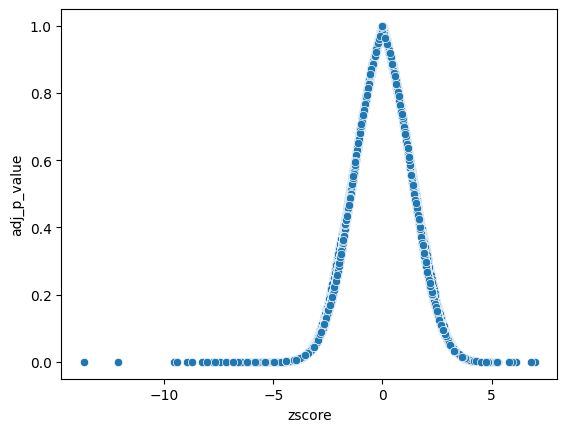

In [239]:
sns.scatterplot(data=perturbseq_results, x='zscore', y='adj_p_value');

In [182]:
df = all_results_df[all_results_df['contrast'] == 'Treg']
df.set_index('variable').loc['CTLA4']

baseMean       2840.803695
log_fc            1.807931
lfcSE             0.252782
stat              7.152129
p_value                0.0
adj_p_value            0.0
contrast              Treg
zscore            7.152129
Name: CTLA4, dtype: object

In [120]:
pseq_target = 'MTOR'
perturbseq_results = get_DE_results_long(adata_de, targets=[pseq_target], effect_estimates=['zscore'])
perturbseq_results.set_index('gene_name').groupby('culture_condition').significant.value_counts()

Series([], Name: count, dtype: int64)

In [88]:
perturbseq_results = get_DE_results_long(adata_de, targets=[pseq_target], effect_estimates=['zscore'])
perturbseq_results.set_index('gene_name').loc['FOXP3']

,index,gene,zscore,adj_p_value,significant,culture_condition,target_contrast,target_contrast_gene_name
gene_name,,,,,,,,
FOXP3,ENSG00000049768_Stim8hr,FOXP3,-4.610460,0.022389,True,Stim8hr,ENSG00000049768,FOXP3
FOXP3,ENSG00000049768_Rest,FOXP3,-3.431448,0.999792,False,Rest,ENSG00000049768,FOXP3


In [263]:
adata_de.var_names = adata_de.var['gene_name'].copy()
# Create a dictionary to store correlation results for all polarization conditions
all_correlation_results = {}

# Loop through all polarization conditions
for pol_condition in all_results['contrast'].unique():
    polarization_results = all_results[all_results['contrast'] == pol_condition].set_index('variable')
    polarization_results['zscore_polarization'] = polarization_results['log_fc'] / polarization_results['lfcSE']
    
    common_gs = np.intersect1d(polarization_results.index, adata_de.var['gene_name'])
    
    polarization_results = polarization_results.loc[common_gs].copy()
    pseq_results = pd.DataFrame(adata_de[:, common_gs].layers['zscore'], columns=common_gs, index=adata_de.obs_names)
    
    # Compute correlation coefficient and p-value for each row in pseq_results
    correlation_results = {}
    for idx in pseq_results.index:
        row_data = pseq_results.loc[idx]
        corr, p_value = stats.pearsonr(polarization_results['zscore_polarization'], row_data)
        correlation_results[idx] = {'correlation': corr, 'p_value': p_value, 'polarization': pol_condition}
    
    # Store results for this polarization condition
    all_correlation_results[pol_condition] = correlation_results

# Convert all results to a single DataFrame
correlation_dfs = []
for pol_condition, results in all_correlation_results.items():
    df = pd.DataFrame(results).T
    df.columns = ['correlation', 'p_value', 'polarization']
    correlation_dfs.append(df)

correlation_df = pd.concat(correlation_dfs)
correlation_df['target_gene_name'] = correlation_df.index.map(lambda x: adata_de.obs.loc[x, 'target_contrast_gene_name'])
correlation_df['condition'] = correlation_df.index.map(lambda x: adata_de.obs.loc[x, 'culture_condition'])

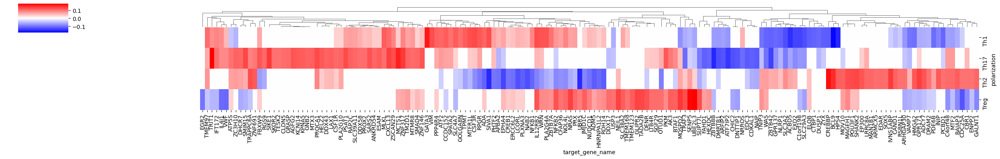

In [295]:
corr_wide = correlation_df.pivot_table(index=['target_gene_name', 'condition'], values='correlation', columns='polarization')
pval_wide = correlation_df.pivot_table(index=['target_gene_name', 'condition'], values='p_value', columns='polarization')
corr_wide[pval_wide >= 0.01] = 0
corr_wide = corr_wide.reset_index()
corr_wide = corr_wide[corr_wide['condition'] == 'Stim8hr'].drop('condition', axis=1).set_index('target_gene_name')

sns.clustermap(corr_wide[corr_wide.abs().max(1) > 0.1].astype(float).T, cmap='bwr', center=0, figsize=(25,4), xticklabels=True, row_cluster=False)

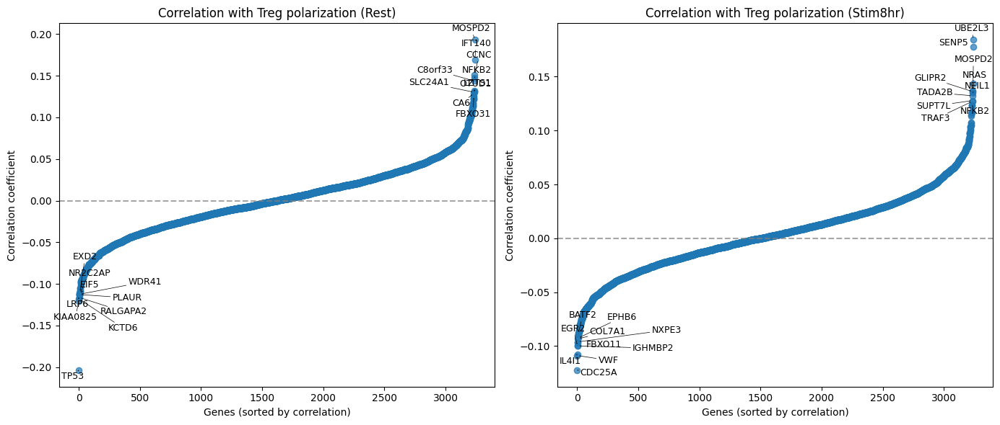

In [261]:
from adjustText import adjust_text
# Create a figure with 2 subplots (one for each condition)
ntop = 10
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
conditions = correlation_df['condition'].unique()

for i, condition in enumerate(conditions):
    # Filter data for this condition
    condition_df = correlation_df[correlation_df['condition'] == condition].copy()
    condition_df = condition_df.sort_values('correlation')
    
    # Create scatterplot
    axes[i].scatter(range(len(condition_df)), condition_df['correlation'], alpha=0.7)
    
    # Get top and bottom genes to annotate
    top_genes = condition_df.nlargest(ntop, 'correlation')
    bottom_genes = condition_df.nsmallest(ntop, 'correlation')
    genes_to_annotate = pd.concat([top_genes, bottom_genes])
    
    # Annotate points with adjustText to avoid overlaps
    texts = []
    for _, row in genes_to_annotate.iterrows():
        idx = condition_df.index.get_loc(row.name)
        text = axes[i].text(idx, row['correlation'], row['target_gene_name'], 
                          fontsize=9, ha='center', va='center')
        texts.append(text)
    
    adjust_text(texts, arrowprops=dict(arrowstyle='->', color='black', lw=0.5), ax=axes[i])
    
    # Add horizontal line at y=0
    axes[i].axhline(y=0, linestyle='--', color='gray', alpha=0.7)
    
    # Set title and labels
    axes[i].set_title(f'Correlation with {pol_condition} polarization ({condition})')
    axes[i].set_xlabel('Genes (sorted by correlation)')
    axes[i].set_ylabel('Correlation coefficient')

plt.tight_layout()